# Check throughputs using galaxy MSA data

In [1]:
# Quiet!
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Are we on a GitHub codespace?
import os

if os.getcwd().startswith('/workspaces/msaexp'):
    import os
    os.environ['CRDS_PATH'] = os.path.join('/tmp/', 'crds_cache')

    if not os.path.exists(os.environ['CRDS_PATH']):
        ! mkdir {os.environ['CRDS_PATH']}

    os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

    print('On codespace: ', os.environ['CRDS_PATH'], os.environ['CRDS_SERVER_URL'])

    workdir  = '/workspaces/msaexp/docs/examples/codespace'
    if not os.path.exists(workdir):
        ! mkdir {workdir}
    
    os.chdir(workdir)
else:
    print('(not on a codespace)')

(not on a codespace)


In [3]:
import os
if 'CRDS_PATH' not in os.environ is None:
    os.environ['CRDS_PATH'] = f'{os.getcwd()}/crds_cache'

    if not os.path.exists(os.environ['CRDS_PATH']):
        os.makedirs(os.environ['CRDS_PATH'])

    os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [4]:
if os.environ['MAST_TOKEN'] is None:
    print('The MAST_TOKEN environment variable must be set to download proprietary data!')
else:
    print('MAST_TOKEN found.')

MAST_TOKEN found.


In [5]:
import os
import glob
import yaml
import warnings

import numpy as np
import matplotlib.pyplot as plt

import grizli
from grizli import utils, jwst_utils
jwst_utils.set_quiet_logging()
utils.set_warnings()

import astropy.io.fits as pyfits
from jwst.datamodels import SlitModel


import msaexp
from msaexp import pipeline
import msaexp.spectrum

print(f'grizli version = {grizli.__version__}')
print(f'msaexp version = {msaexp.__version__}')

grizli version = 1.12.9.dev18+ge21bf3a.d20241025
msaexp version = 0.9.2.dev0+g1039008.d20241104


## Rubies test

In [6]:
import grizli.jwst_utils

os.environ['CRDS_CONTEXT'] = 'jwst_1298.pmap'
context = grizli.jwst_utils.set_crds_context()

ENV CRDS_CONTEXT = jwst_1298.pmap


In [7]:
os.chdir('/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength')

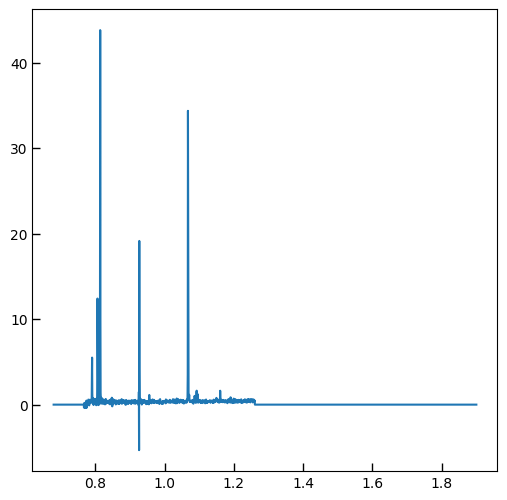

In [300]:
spe = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-egs61-v3/rubies-egs61-v3_prism-clear_4233_55604.spec.fits')


spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-uds3-v3/rubies-uds3-v3_prism-clear_4233_959606.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-egs63-v3/rubies-egs63-v3_prism-clear_4233_42803.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/suspense-kriek-v3/suspense-kriek-v3_g140m-f100lp_2110_129133.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/suspense-kriek-v3/suspense-kriek-v3_g140m-f100lp_2110_128019.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/ceers-v3/ceers-v3_g235m-f170lp_1345_3060.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/ceers-v3/ceers-v3_g395m-f290lp_1345_2919.spec.fits'

# valentino spectrum of z=7.2
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/valentino-obs19-v3/valentino-obs19-v3_g235m-f170lp_3567_66283.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-uds31-nod-v3/rubies-uds31-nod-v3_prism-clear_4233_166283.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/valentino-obs08-v3/valentino-obs08-v3_g235m-f170lp_3567_262.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/valentino-obs19-v3/valentino-obs19-v3_g235m-f170lp_3567_51909.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/valentino-obs19-v3/valentino-obs19-v3_g235m-f170lp_3567_40460.spec.fits'

# Rubies extended
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-egs53-v3/rubies-egs53-v3_prism-clear_4233_47517.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-egs53-v3/rubies-egs53-v3_prism-clear_4233_46141.spec.fits'

# 3 gratings
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gds-wide2-v3/jades-gds-wide2-v3_prism-clear_1180_8814.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/bluejay-south-v3/bluejay-south-v3_g140m-f100lp_1810_9395.spec.fits'
# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/bluejay-south-v3/bluejay-south-v3_g395m-f290lp_1810_12020.spec.fits'
# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/bluejay-south-v3/bluejay-south-v3_g395m-f290lp_1810_11142.spec.fits'

# # JADES PRISM + gratings
# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_25480.spec.fits'
# # spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_22456.spec.fits'
# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_28074.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_3991.spec.fits' # GNz11
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_1936.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_3982.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_28074.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_65299.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_29438.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_23924.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn09-v3/jades-gdn09-v3_prism-clear_1181_73488.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-udeep-v3/gds-udeep-v3_prism-clear_3215_201249.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-deep-v3/gds-deep-v3_g140m-f070lp_1210_35180.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn09-v3/jades-gdn09-v3_g140m-f070lp_1181_58736.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v3/cosmos-curti-v3_g140m-f100lp_1879_4502.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v3/cosmos-curti-v3_g140m-f100lp_1879_748.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v3/cosmos-curti-v3_g140m-f100lp_1879_316.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-udeep-v3/gds-udeep-v3_prism-clear_3215_98554.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-udeep-v3/gds-udeep-v3_prism-clear_3215_143264.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gds-wide2-v3/jades-gds-wide2-v3_prism-clear_1180_6535.spec.fits'
spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_27395.spec.fits'

spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_g140m-f070lp_1181_22847.spec.fits'

# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v3/jades-gdn2-v3_prism-clear_1181_26708.spec.fits'

# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-egs51-v3/rubies-egs51-v3_prism-clear_4233_15825.spec.fits'
# spe_file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/rubies-uds1-v3/rubies-uds1-v3_prism-clear_4233_40579.spec.fits' # BRD
spe = msaexp.spectrum.SpectrumSampler(spe_file)

source_id = spe.meta['SOURCEID']

orig_file = spe.meta['FILENAME']

plt.plot(spe["wave"], spe["flux"])

In [301]:

import mastquery.jwst

gratings = ['prism', 'g140m', 'g235m', 'g395m'][:]


prog = int(orig_file[3:7])
extra = mastquery.jwst.make_query_filter('visit_id', values=[orig_file[2:2+11]])

outroot = spe.file.split('/')[-2].replace('v3','vx')

detectors = ['nrs1','nrs2']

print(f'program: {prog}\noutroot: {outroot}')

HOME = os.getcwd()

DO_RECALIBRATE = False


# Download the rate files again because the headers of the reprocessed files above aren't quite right
masks = pipeline.query_program(prog, download=False, detectors=detectors, gratings=gratings,
                               extensions=['uncal','s2d'], 
                               extra_filters=extra)

un = utils.Unique(masks['grating'])
utils.Unique(masks['detector'])
utils.Unique(masks['targprop'])
utils.Unique(masks['apername'])
utils.Unique(masks['visit_id'])

program: 1181
outroot: jades-gdn2-vx
   N  value     
====  ==========
  12  G140M     
  12  G235M     
  12  G395M     
  24  PRISM     
   N  value     
====  ==========
  30  NRS1      
  30  NRS2      
   N  value     
====  ==========
  60  1181-MERGED-APT-CLEAN-CLEAN
   N  value     
====  ==========
  60  NRS_FULL_MSA
   N  value     
====  ==========
  60  01181005001


In [302]:
if 1:
    os.system(f"aws s3 sync s3://msaexp-nirspec/extractions/slitlets/{outroot.replace('vx','v4')}/ ./ --exclude \"*\" --include \"*_{source_id}.fits\"")
    

download: s3://msaexp-nirspec/extractions/slitlets/jades-gdn2-v4/jw01181005001_03101_00001_nrs1_f070lp_g140m_raw.116.1181_22847.fits to ./jw01181005001_03101_00001_nrs1_f070lp_g140m_raw.116.1181_22847.fits
download: s3://msaexp-nirspec/extractions/slitlets/jades-gdn2-v4/jw01181005001_03101_00002_nrs2_f070lp_g140m_raw.116.1181_22847.fits to ./jw01181005001_03101_00002_nrs2_f070lp_g140m_raw.116.1181_22847.fits
download: s3://msaexp-nirspec/extractions/slitlets/jades-gdn2-v4/jw01181005001_03101_00001_nrs2_f070lp_g140m_raw.116.1181_22847.fits to ./jw01181005001_03101_00001_nrs2_f070lp_g140m_raw.116.1181_22847.fits
download: s3://msaexp-nirspec/extractions/slitlets/jades-gdn2-v4/jw01181005001_03101_00002_nrs1_f070lp_g140m_raw.116.1181_22847.fits to ./jw01181005001_03101_00002_nrs1_f070lp_g140m_raw.116.1181_22847.fits
download: s3://msaexp-nirspec/extractions/slitlets/jades-gdn2-v4/jw01181005001_05101_00001_nrs2_f170lp_g235m_raw.116.1181_22847.fits to ./jw01181005001_05101_00001_nrs2_f170lp_

In [303]:
os.getcwd()

'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength'

In [304]:
xfiles = glob.glob(f'*_{source_id}.fits')
if len(xfiles) == 0:
    mastquery.utils.download_from_mast(masks['dataURI'].tolist())
    mastquery.utils.download_from_mast(masks['msametfl'].tolist())
else:
    print(f'Found {len(xfiles)} files')

Found 21 files


### Trim to a single source to speed up test

In [167]:
def get_msa_source_ids(rate_file, merge_first=True):
    """
    Get source_ids from the MSAMETFL associated with an exposure

    Parameters
    ----------
    rate_file : str
        Exposure filename.

    merge_first : bool
        Run `~msaexp.msa.MSAMetafile.merge_source_ids` before computing unique source ids

    Returns
    -------
    source_ids : list
        List of source ids in the mask configuration
        
    """
    
    with pyfits.open(rate_file) as im:
        if im[0].header['EXP_TYPE'] != 'NRS_MSASPEC':
            return []

        metfl = im[0].header['MSAMETFL']
        msa = msaexp.msa.MSAMetafile(metfl)
        if merge_first:
            msa.merge_source_ids()
        
        conf = im[0].header['MSACONID']
        msaid = im[0].header['MSAMETID']
        expid = im[0].header['PATT_NUM']

    rows = (shu['msa_metadata_id'] == msaid) & (shu['dither_point_index'] == expid)
    source_ids = np.unique(shu[rows]['source_id']).tolist()

    return source_ids

    

In [5818]:
import msaexp.msa

msa_files = np.unique(masks['msametfl'])

for file in msa_files:
    msametfl = msaexp.msa.pad_msa_metafile(
                            file,
                            pad=0,
                            positive_ids=True,
                            source_ids=[source_id],
                            slitlet_ids=None,
                            primary_sources=True,
    )

rate_files = [os.path.basename(f) for f in masks['dataURI']]
for file in rate_files:
    with pyfits.open(file, mode='update') as im:
        if 'src' not in im[0].header['MSAMETFL']:
            im[0].header['MSAMETFL'] = 'src_' + im[0].header['MSAMETFL']
        
        print(file, im[0].header['MSAMETFL'])
        
        im.flush()
        

# (2024-11-03 15:11:09.762)
msaexp.utils.pad_msa_metafile: Trim source_id in jw04233001001_01_msa.fits to [40579]
msaexp.utils.pad_msa_metafile: pad = 0
# (2024-11-03 15:11:09.955)
msaexp.utils.pad_msa_metafile: Trim source_id in jw04233001001_02_msa.fits to [40579]
msaexp.utils.pad_msa_metafile: pad = 0
jw04233001001_03101_00002_nrs1_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_03101_00002_nrs2_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_03101_00003_nrs1_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_03101_00003_nrs2_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_03101_00004_nrs1_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_03101_00004_nrs2_rate.fits src_jw04233001001_01_msa.fits
jw04233001001_05101_00002_nrs1_rate.fits src_jw04233001001_02_msa.fits
jw04233001001_05101_00002_nrs2_rate.fits src_jw04233001001_02_msa.fits
jw04233001001_05101_00003_nrs1_rate.fits src_jw04233001001_02_msa.fits
jw04233001001_05101_00003_nrs2_rate.fits src_jw04233001

### Run extended pipeline

In [5819]:
rate_files

['jw04233001001_03101_00002_nrs1_rate.fits',
 'jw04233001001_03101_00002_nrs2_rate.fits',
 'jw04233001001_03101_00003_nrs1_rate.fits',
 'jw04233001001_03101_00003_nrs2_rate.fits',
 'jw04233001001_03101_00004_nrs1_rate.fits',
 'jw04233001001_03101_00004_nrs2_rate.fits',
 'jw04233001001_05101_00002_nrs1_rate.fits',
 'jw04233001001_05101_00002_nrs2_rate.fits',
 'jw04233001001_05101_00003_nrs1_rate.fits',
 'jw04233001001_05101_00003_nrs2_rate.fits',
 'jw04233001001_05101_00004_nrs1_rate.fits',
 'jw04233001001_05101_00004_nrs2_rate.fits']

In [5763]:
# reload(extend_pipeline)
from msaexp import pipeline_extended
import time

import msaexp.pipeline

reload(msaexp.pipeline); reload(pipeline_extended); reload(msaexp.utils)
reload(msaexp.pipeline); reload(pipeline_extended); reload(msaexp.utils)

for i, file in enumerate(rate_files[:]):
    print(f'\n\nFile {i} of {len(rate_files)}:  {file}\n')
    if 1:
        # Current calibration but extended limits for a matched comparison
        result = pipeline_extended.run_pipeline(
            file,
            slit_index=0,
            all_slits=True,
            write_output=True,
            set_log=True,
            skip_existing_log=False,
            undo_flat=False,
        )

    if 1:
        # Undo flat
        result = pipeline_extended.run_pipeline(
            file,
            slit_index=0,
            all_slits=True,
            write_output=True,
            set_log=True,
            skip_existing_log=False,
            undo_flat=True,
        )
    
    if hasattr(result, 'slits'):
        save_result = result
    # break

print('Done. ' + time.ctime())




File 0 of 12:  jw04233001001_03101_00002_nrs1_rate.fits


########
# extend_reference_files Sun Nov  3 15:39:48 2024
# jw04233001001_03101_00002_nrs1_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00002_nrs1_rate.wave_log.txt

exposure_oneoverf_correction: jw04233001001_03101_00002_nrs1_rate.fits axis=0 deg_pix=256
exposure_oneoverf_correction: jw04233001001_03101_00002_nrs1_rate.fits apply to file
msaexp.preprocess : jw04233001001_03101_00002_nrs1_rate.fits  bias offset =   0.006
msaexp.preprocess : jw04233001001_03101_00002_nrs1_rate.fits    rms scale =   2.35
jw04233001001_03101_00002_nrs1_rate.fits AssignWCS
jw04233001001_03101_00002_nrs1_rate.fits Extract2D
jw04233001001_03101_00002_nrs1_rate.fits CLEAR_PRISM NRS1
jw04233001001_03101_00002_nrs1_rate.fits FlatFieldStep
jw04233001001_03101_00002_nrs1_rate.fits  dflat = 'jwst_nirspec_dflat_0001_ext.fits'
jw04233001001_03101_00002_nrs1_rate.fits NRS_MSASPEC run PathLossStep
jw04233001001_03101

2024-11-03 15:40:13,384 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00002_nrs2_rate.fits No open slits found to work on

########
# extend_reference_files Sun Nov  3 15:40:13 2024
# jw04233001001_03101_00002_nrs2_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00002_nrs2_rate.wave_log.txt

msaexp.preprocess : jw04233001001_03101_00002_nrs2_rate.fits  bias offset =   0.005 (from MASKBIAS)
msaexp.preprocess : jw04233001001_03101_00002_nrs2_rate.fits    rms scale =    1.71 (from SCLREADN)
jw04233001001_03101_00002_nrs2_rate.fits AssignWCS


2024-11-03 15:40:13,801 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00002_nrs2_rate.fits No open slits found to work on


File 2 of 12:  jw04233001001_03101_00003_nrs1_rate.fits


########
# extend_reference_files Sun Nov  3 15:40:13 2024
# jw04233001001_03101_00003_nrs1_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00003_nrs1_rate.wave_log.txt

exposure_oneoverf_correction: jw04233001001_03101_00003_nrs1_rate.fits axis=0 deg_pix=256
exposure_oneoverf_correction: jw04233001001_03101_00003_nrs1_rate.fits apply to file
msaexp.preprocess : jw04233001001_03101_00003_nrs1_rate.fits  bias offset =   0.002
msaexp.preprocess : jw04233001001_03101_00003_nrs1_rate.fits    rms scale =   2.33
jw04233001001_03101_00003_nrs1_rate.fits AssignWCS
jw04233001001_03101_00003_nrs1_rate.fits Extract2D
jw04233001001_03101_00003_nrs1_rate.fits CLEAR_PRISM NRS1
jw04233001001_03101_00003_nrs1_rate.fits FlatFieldStep
jw04233001001_03101_00003_nrs1_rate.fits  dflat = 'jwst_nirspec_dflat_0001_ext.fits'
jw04233001001_031

2024-11-03 15:40:37,273 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00003_nrs2_rate.fits No open slits found to work on

########
# extend_reference_files Sun Nov  3 15:40:37 2024
# jw04233001001_03101_00003_nrs2_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00003_nrs2_rate.wave_log.txt

msaexp.preprocess : jw04233001001_03101_00003_nrs2_rate.fits  bias offset =   0.003 (from MASKBIAS)
msaexp.preprocess : jw04233001001_03101_00003_nrs2_rate.fits    rms scale =    1.53 (from SCLREADN)
jw04233001001_03101_00003_nrs2_rate.fits AssignWCS


2024-11-03 15:40:37,667 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00003_nrs2_rate.fits No open slits found to work on


File 4 of 12:  jw04233001001_03101_00004_nrs1_rate.fits


########
# extend_reference_files Sun Nov  3 15:40:37 2024
# jw04233001001_03101_00004_nrs1_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00004_nrs1_rate.wave_log.txt

exposure_oneoverf_correction: jw04233001001_03101_00004_nrs1_rate.fits axis=0 deg_pix=256
exposure_oneoverf_correction: jw04233001001_03101_00004_nrs1_rate.fits apply to file
msaexp.preprocess : jw04233001001_03101_00004_nrs1_rate.fits  bias offset =   0.004
msaexp.preprocess : jw04233001001_03101_00004_nrs1_rate.fits    rms scale =   2.35
jw04233001001_03101_00004_nrs1_rate.fits AssignWCS
jw04233001001_03101_00004_nrs1_rate.fits Extract2D
jw04233001001_03101_00004_nrs1_rate.fits CLEAR_PRISM NRS1
jw04233001001_03101_00004_nrs1_rate.fits FlatFieldStep
jw04233001001_03101_00004_nrs1_rate.fits  dflat = 'jwst_nirspec_dflat_0001_ext.fits'
jw04233001001_031

2024-11-03 15:41:00,924 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00004_nrs2_rate.fits No open slits found to work on

########
# extend_reference_files Sun Nov  3 15:41:00 2024
# jw04233001001_03101_00004_nrs2_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_03101_00004_nrs2_rate.wave_log.txt

msaexp.preprocess : jw04233001001_03101_00004_nrs2_rate.fits  bias offset =  -0.000 (from MASKBIAS)
msaexp.preprocess : jw04233001001_03101_00004_nrs2_rate.fits    rms scale =    1.52 (from SCLREADN)
jw04233001001_03101_00004_nrs2_rate.fits AssignWCS


2024-11-03 15:41:01,331 - stpipe - CRITICAL - No open slits fall on detector NRS2.


jw04233001001_03101_00004_nrs2_rate.fits No open slits found to work on


File 6 of 12:  jw04233001001_05101_00002_nrs1_rate.fits


########
# extend_reference_files Sun Nov  3 15:41:01 2024
# jw04233001001_05101_00002_nrs1_rate.fits
# slit_index=0 all_slits=True write_output=True
# log to jw04233001001_05101_00002_nrs1_rate.wave_log.txt

exposure_oneoverf_correction: jw04233001001_05101_00002_nrs1_rate.fits axis=0 deg_pix=256
exposure_oneoverf_correction: jw04233001001_05101_00002_nrs1_rate.fits apply to file
msaexp.preprocess : jw04233001001_05101_00002_nrs1_rate.fits  bias offset =   0.000
msaexp.preprocess : jw04233001001_05101_00002_nrs1_rate.fits    rms scale =   2.36
jw04233001001_05101_00002_nrs1_rate.fits AssignWCS
jw04233001001_05101_00002_nrs1_rate.fits Extract2D
jw04233001001_05101_00002_nrs1_rate.fits F290LP_G395M NRS1
jw04233001001_05101_00002_nrs1_rate.fits FlatFieldStep
jw04233001001_05101_00002_nrs1_rate.fits  dflat = 'jwst_nirspec_dflat_0001_ext.fits'
jw04233001001_05

## Try extraction

In [103]:
os.getcwd()

files

['wd_sensitivity_CLEAR_PRISM.fits',
 'wd_sensitivity_F070LP_G140M.fits',
 'wd_sensitivity_F100LP_G140M.fits',
 'wd_sensitivity_F170LP_G235M.fits',
 'wd_sensitivity_F290LP_G395M.fits']

In [5749]:
files = glob.glob(f'jw042*phot*{source_id}.fits')
files = glob.glob(f'jw*phot*{source_id}.fits')
files.sort()

source_id, len(files)

(15825, 9)

# (2024-10-30 21:01:27.821)

slit_combine.extract_spectra(**{'target': 'iras-05248-7007', 'root': 'ext_calib', 'path_to_files': './', 'files': ['jw02110001001_03101_00002_nrs1_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_03101_00002_nrs2_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_05101_00001_nrs1_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_05101_00001_nrs2_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_07101_00001_nrs1_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_07101_00001_nrs2_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_09101_00001_nrs1_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_09101_00001_nrs2_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_11101_00001_nrs1_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_11101_00001_nrs2_f100lp_g140m_phot.39.2110_129133.fits', 'jw02110001001_13101_00001_nrs1_f100lp_g140m_phot.113.2110_129133.fits', 'jw02110001001_13101_00001_nrs2_f100lp_g140m_phot.113.2110_1291

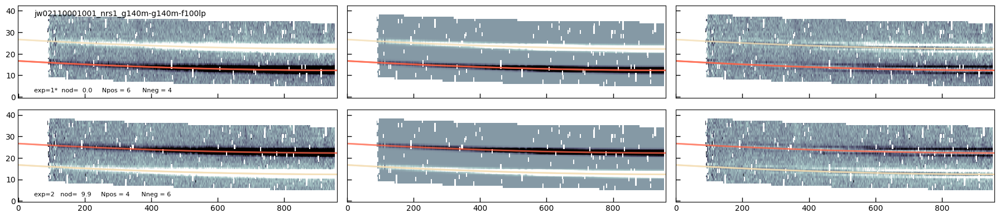

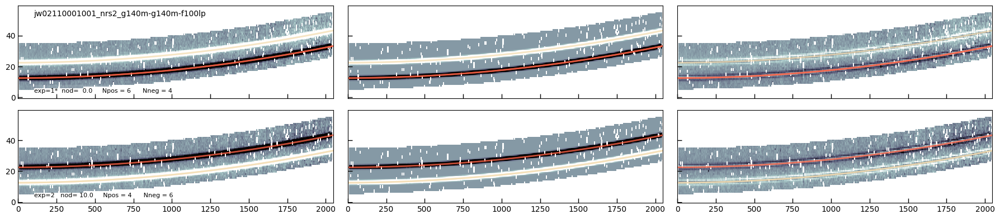

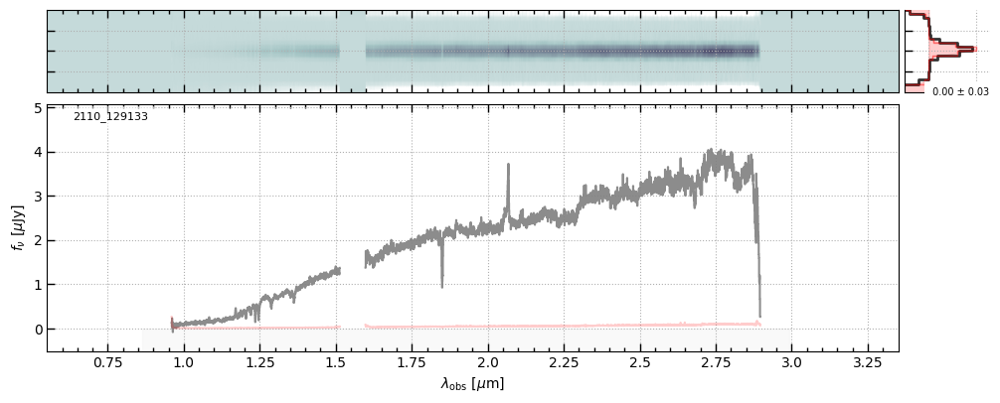

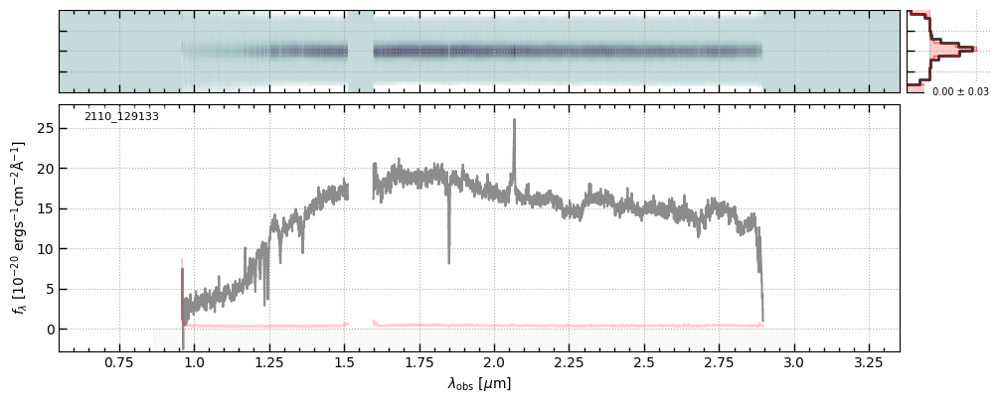

In [4035]:

files = glob.glob(f'jw042*phot*{source_id}.fits')
files = glob.glob(f'jw*phot*{source_id}.fits')
files.sort()

if source_id == 166283:
    files += glob.glob(f'jw042*phot*{123}.fits')
    files.sort()
    
DRIZZLE_KWS = dict(step=1,
                with_pathloss=True,
                # with_pathloss=False,
                wave_sample=1.05,
                ny=15,
                dkws=dict(oversample=16, pixfrac=0.8),
                       grating_limits=GRATING_LIMITS,
                  )

hdul, xobj = msaexp.slit_combine.extract_spectra(
    target='iras-05248-7007',
    root='ext_calib',
    files=files,
    do_gratings=ALL_GRATINGS,
    recenter_all=True,
    diffs=True,
    undo_barshadow=True,
    undo_pathloss=False,
    get_xobj=True,
    input_fix_sigma=0.3,
    initial_theta=[0.0, 0.0],
    do_multiple_mask=False,
    flag_percentile_kwargs=None,
    hot_cold_kwargs=None,
    flag_trace_kwargs=None,
    slit_hotpix_kwargs=None,
    sky_file=None,
    # trace_with_xpos=True,
    fix_prism_norm=False,
    drizzle_kws=DRIZZLE_KWS,
    include_full_pixtab=[] ,#ALL_GRATINGS,
)


In [3916]:
import eazy

tlog = 10**np.arange(np.log10(50), np.log10(5.5e4), 1./2500/np.log(10))

igm_obj = eazy.igm.Inoue14()
z = 10
igm = igm_obj.full_IGM(z, tlog*(1+z))

if not os.path.exists('templates'):
    eazy.symlink_eazy_inputs()

otemp = eazy.templates.read_templates_file('templates/sfhz/agn_blue_sfhz_13.param')

# Add PSB template
# psb = eazy.templates.Template('/mnt/efs/fs1/telescopes/NIRSpec/young_post_starburst.fits')
# otemp.append(psb)

templ = []
for ti in otemp:
    templ.append(ti.resample(tlog, in_place=False))
    templ[-1].flux *= igm

templ

/Users/gbrammer/miniconda3/envs/jw310-2024/lib/python3.10/site-packages/eazy/data/templates -> ./templates
/Users/gbrammer/miniconda3/envs/jw310-2024/lib/python3.10/site-packages/eazy/data/filters/FILTER.RES.latest -> ./FILTER.RES.latest


[<class 'eazy.templates.Template'>: corr_sfhz_13_bin0_av0.01.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin0_av0.25.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin0_av0.50.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin0_av1.00.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin1_av0.01.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin1_av0.25.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin1_av0.50.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin1_av1.00.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin2_av0.01.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin2_av0.50.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin2_av1.00.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin3_av0.01.fits,
 <class 'eazy.templates.Template'>: corr_sfhz_13_bin3_av0.50.fits,
 <class 'eazy.templates.Template'>: fsps_4590.fits,
 <class 'eazy.templates.Template'>: j0647agn+torus.fits]

# (2024-10-30 16:43:00.002)

spectrum.fit_redshift(**{'file': 'ext_calib_prism-clear_4233_166283.spec.fits', 'z0': [6, 7.5], 'zstep': None, 'nspline': None, 'scale_disp': 1.3, 'vel_width': 100, 'Rline': None, 'is_prism': False, 'use_full_dispersion': False, 'ranges': None, 'sys_err': 0.02, 'kwargs': {}, 'froot': 'ext_calib_prism-clear_4233_166283'})



98it [00:00, 165.66it/s]
101it [00:00, 172.88it/s]



# line flux err
# flux x 10^-20 erg/s/cm2
# ext_calib_prism-clear_4233_166283.spec.fits
# z = 7.28459
# Wed Oct 30 17:43:01 2024


# line flux err
# flux x 10^-20 erg/s/cm2
# ext_calib_prism-clear_4233_166283.spec.fits
# z = 7.28459
# Wed Oct 30 17:43:01 2024
            line Lya     -187.7 ±    297.9 (EW=  -1787.9)
      line OIII-1663        2.9 ±     66.4 (EW=      6.6)
      line NIII-1750      -88.0 ±     58.0 (EW=   -196.4)
      line CIII-1906        0.4 ±     53.7 (EW=      0.9)
           line MgII      -47.2 ±     18.7 (EW=   -160.2)
       line NeV-3346       -4.2 ±     11.3 (EW=    -18.5)
      line NeVI-3426        5.7 ±     12.2 (EW=     27.9)
            line OII      -19.0 ±      9.8 (EW=    -86.4)
     line NeIII-3867        2.7 ±     10.3 (EW=      8.6)
       line HeI-3889       -1.9 ±      8.7 (EW=     -5.9)
     line NeIII-3968      -23.1 ±      8.0 (EW=    -63.9)
             line Hd      -25.3 ±      8.6 (EW=    -75.2)
             line Hg      -12.6 ±      8.1 

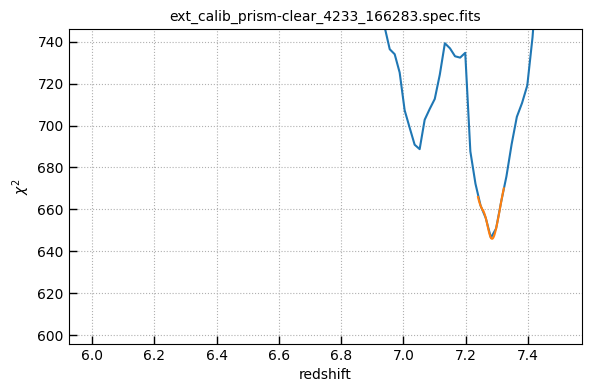

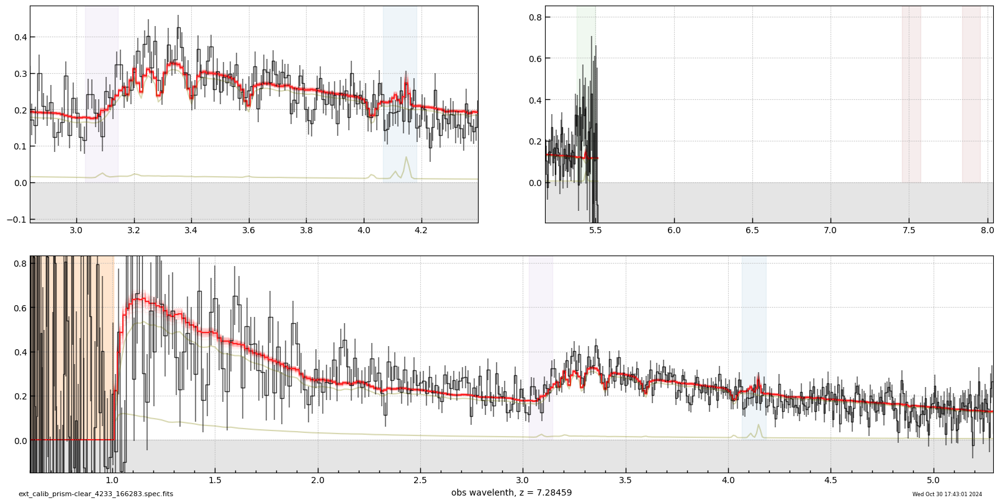

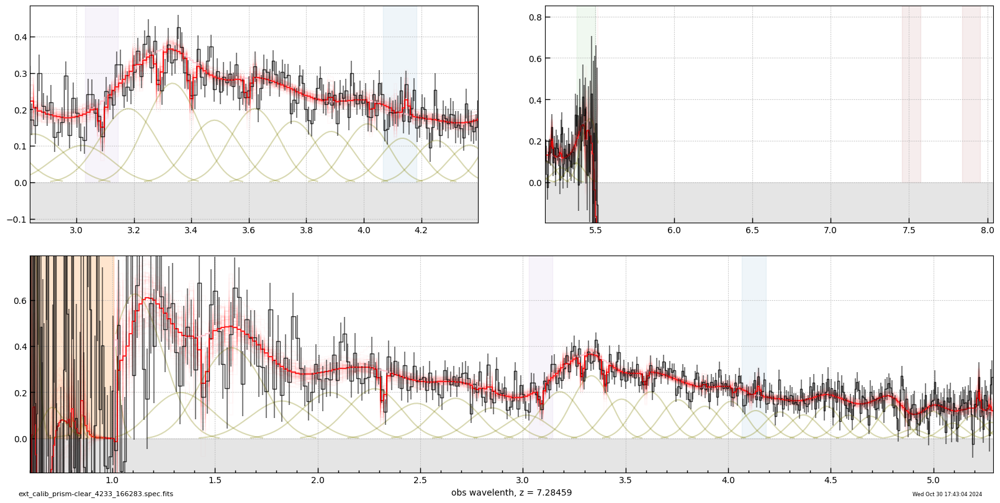

In [3917]:
_ = msaexp.spectrum.fit_redshift(file='ext_calib_prism-clear_4233_166283.spec.fits',
                             z0 = [6, 7.5],
                                 eazy_templates=templ,
                            )

In [3874]:
obj = xobj['jw04233006001_nrs1_prism-prism-clear']['obj']

In [3879]:
# plt.imshow(obj.sci[0].reshape(obj.sh), aspect='auto')
obj.sky_arrays

(<Column name='wave' dtype='float64' length=1207>
 0.603108
  0.60455
 0.606002
 0.607464
 0.608936
 0.610418
  0.61191
 0.613412
 0.614925
 0.616448
 0.617982
 0.619527
      ...
 5.271062
 5.273562
  5.27606
 5.278557
 5.281052
 5.283547
  5.28604
 5.288531
 5.291022
 5.293511
 5.295999,
 <Column name='flux' dtype='float64' length=1207>
 0.071975
 0.072548
 0.073139
 0.073783
 0.074467
 0.075152
 0.075784
 0.076313
 0.076703
  0.07696
  0.07714
 0.077312
      ...
 0.430612
 0.432877
  0.43573
 0.439506
 0.443521
 0.446873
 0.449549
 0.452467
 0.456283
 0.460665
 0.477016)

In [4036]:
spe_file

'https://s3.amazonaws.com/msaexp-nirspec/extractions/suspense-kriek-v3/suspense-kriek-v3_g140m-f100lp_2110_129133.spec.fits'

In [4082]:
prog_str = spe.file.split('_')[-2]

key = f'{prog_str}_{source_id}'

outroot = spe.file.split('/')[-2].replace('v3','vx')

targets = [key]

FORCE_DIFFS = True

utils.LOGFILE = 'extract.log'

print(key, outroot)

2110_128019 suspense-kriek-vx


In [3862]:
file = 'jw04233006001_03101_00002_nrs1_clear_prism_phot.190.4233_55604.fits'

def slit_extended_flux_calibration(slit, verbose=True):
    """
    Get flux calibration for extended extractions
    """
    
    test = False
    refs = slit.meta.ref_file.instance

    if 'photom' in refs:
        test = '_ext.fits' in refs['photom']['name']

    if not test:
        return 0

    sens_file = f"wd_sensitivity_{slit.meta.instrument.filter}_{slit.meta.instrument.grating}.fits"
    
    if not os.path.exists(sens_file):
        msg = f"slit_extended_flux_calibration: {sens_file} not found"
        utils.log_comment(utils.LOGFILE, msg, verbose=verbose)
        return 1

    msg = f"slit_extended_flux_calibration: {sens_file}"
    utils.log_comment(utils.LOGFILE, msg, verbose=verbose)

    sens = utils.read_catalog(sens_file)

    wcs = slit.meta.wcs
    d2w = wcs.get_transform("detector", "world")

    _ypi, _xpi = np.indices(slit.data.shape)
    _ras, _des, _wave = d2w(_xpi, _ypi)

    sens_data = 1./np.interp(_wave, sens["wavelength"], sens["sensitivity"], left=0, right=0)
    sens_data[~np.isfinite(sens_data)] = 0
    
    slit.data *= sens_data
    slit.err *= sens_data
    slit.var_rnoise *= sens_data**2
    slit.var_poisson *= sens_data**2
    
    return 2
    
slit = jwst.datamodels.open(file)
slit_extended_flux_calibration(slit)

slit_extended_flux_calibration: wd_sensitivity_CLEAR_PRISM.fits


2

## Standard extraction

In [306]:
prog_str = spe.file.split('_')[-2]

key = f'{prog_str}_{source_id}'

# key = 'background_123'

outroot = spe.file.split('/')[-2].replace('v3','vx')

targets = [key]

FORCE_DIFFS = True

utils.LOGFILE = 'extract.log'

print(key, outroot)
pfiles = glob.glob(f'*nrs?_*_phot*{key}.fits')
pfiles.sort()

rfiles = glob.glob(f'*nrs?_*_raw*{key}.fits')
rfiles.sort()

if 0:
    outroot = spe.file.split('/')[-2].replace('v3','vo')
    pfiles = glob.glob(f'*nrs?_*_xphot*{key}.fits')
    pfiles.sort()

print('phot files: ', len(pfiles))
print('raw files: ', len(rfiles))

pfiles + ['\n'] + rfiles

1181_22847 jades-gdn2-vx
phot files:  0
raw files:  21


['\n',
 'jw01181005001_03101_00001_nrs1_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_03101_00001_nrs2_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_03101_00002_nrs1_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_03101_00002_nrs2_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_03101_00003_nrs1_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_03101_00003_nrs2_f070lp_g140m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00001_nrs1_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00001_nrs2_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00002_nrs1_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00002_nrs2_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00003_nrs1_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_05101_00003_nrs2_f170lp_g235m_raw.116.1181_22847.fits',
 'jw01181005001_07101_00001_nrs1_f290lp_g395m_raw.116.1181_22847.fits',
 'jw01181005001_07101_00002_nrs1_f290lp_g395m_raw.116.118

In [307]:
if outroot in ['gds-udeep-lr-v1','xxgds-deep-lr-v1','gds-deep-xmr-v1','bluejay-north-v1','xbluejay-north-alt-v1']:
    join = [0,3,5]
    # join = [0,1,3,5]
    join = [3,5]
elif 'gds-udeep' in outroot:
    join = [0,3,5]
elif 'gds-deep' in outroot:
    join = [0,1,3,5]
elif 'uncover' in outroot:
    join = [0,3,5]
elif 'egami' in outroot:
    join = [3,5]
elif 'macsj0647-hr' in outroot:
    join = [3,5]
    # join = [0,3]
elif 'glazebrook-v' in outroot:
    join = [0,3]
elif 'suspense-kriek-v' in outroot:
    join = [3, 5, 7]
elif 'cecilia' in outroot:
    join = [0,1,3]
else:
    join = [0,3,5]

outroot, join 
# join += [-1]

if (1):
    GRATING_LIMITS = {
        "prism": [0.54, 5.63, 0.01],
        "g140m": [0.55, 3.35, 0.00063],
        "g235m": [1.58, 5.3, 0.00106],
        "g395m": [2.68, 5.6, 0.00179],
        "g140h": [0.68, 1.9, 0.000238],
        "g235h": [1.66, 3.17, 0.000396],
        "g395h": [2.83, 5.24, 0.000666],
    }
elif (1):
    GRATING_LIMITS = {
        "prism": [0.54, 5.63, 0.01],
        "g140m": [0.5, 5.65, 0.00063],
        "g235m": [0.5, 5.65, 0.00106],
        "g395m": [0.5, 5.65, 0.00179],
        "g140h": [0.68, 1.9, 0.000238],
        "g235h": [1.66, 3.17, 0.000396],
        "g395h": [2.83, 5.24, 0.000666],
    }

else:
    GRATING_LIMITS = msaexp.utils.GRATING_LIMITS

# DRIZZLE_KWS = dict(
#     step=1,
#     with_pathloss=False,
#     wave_sample=1.05,
#     ny=13,
#     dkws=dict(oversample=16, pixfrac=0.8),
#     grating_limits=GRATING_LIMITS,
# )


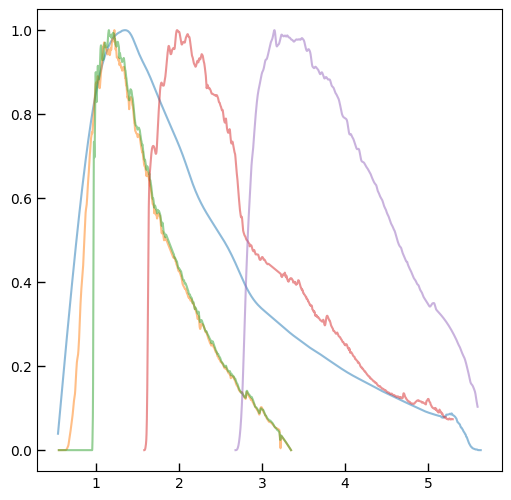

In [308]:
files = glob.glob('wd*fits')
# files = glob.glob('p330*fits')

files.sort()
for file in files:
    sens = utils.read_catalog(file)
    plt.plot(sens['wavelength'], sens['sensitivity'] / sens['sensitivity'].max(), label=file, alpha=0.5)



In [309]:
import msaexp.utils
from importlib import reload
import msaexp.slit_combine

reload(msaexp.utils); reload(msaexp.slit_combine)
reload(msaexp.utils); reload(msaexp.slit_combine)

prf = msaexp.slit_combine.set_lookup_prf()
print(prf.psf_file)
# msaexp.slit_combine.LOOKUP_PRF = None

outroot

Initialize LookupTablePSF()
nirspec_exp_psf_lookup.fits


'jades-gdn2-vx'

# (2024-11-05 10:10:23.302)
Start
Run:  1181_22847
# (2024-11-05 10:10:23.304)

slit_combine.extract_spectra(**{'target': '1181_22847', 'root': 'jades-gdn2-vx', 'path_to_files': './', 'files': ['jw01181005001_03101_00001_nrs1_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_03101_00001_nrs2_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_03101_00002_nrs1_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_03101_00002_nrs2_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_03101_00003_nrs1_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_03101_00003_nrs2_f070lp_g140m_raw.116.1181_22847.fits', 'jw01181005001_05101_00001_nrs1_f170lp_g235m_raw.116.1181_22847.fits', 'jw01181005001_05101_00001_nrs2_f170lp_g235m_raw.116.1181_22847.fits', 'jw01181005001_05101_00002_nrs1_f170lp_g235m_raw.116.1181_22847.fits', 'jw01181005001_05101_00002_nrs2_f170lp_g235m_raw.116.1181_22847.fits', 'jw01181005001_05101_00003_nrs1_f170lp_g235m_raw.116.1181_22847.fits', 'jw01181005001_05101_0000

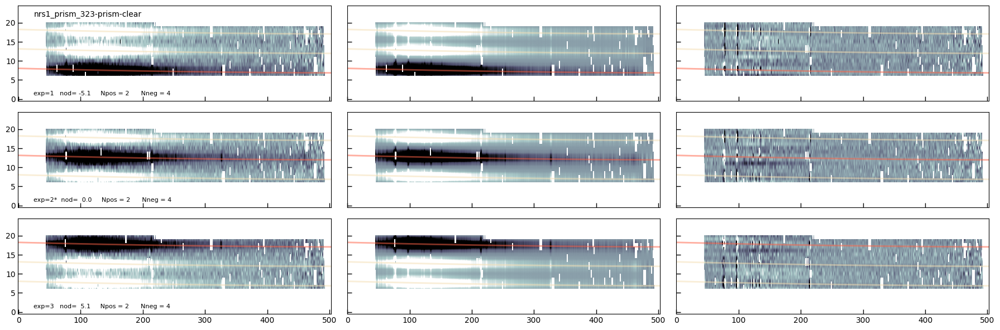

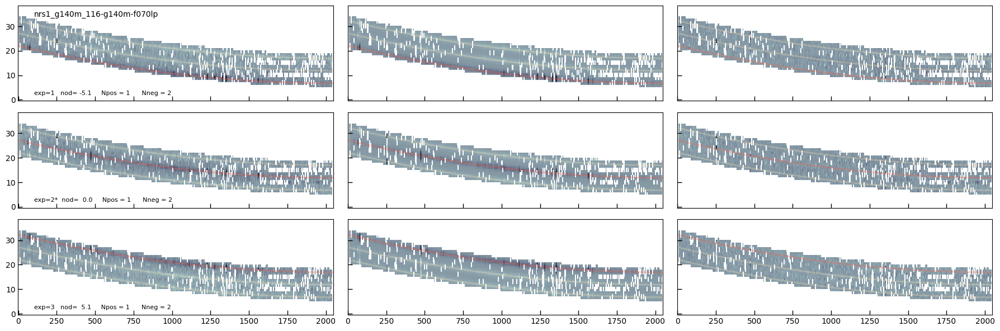

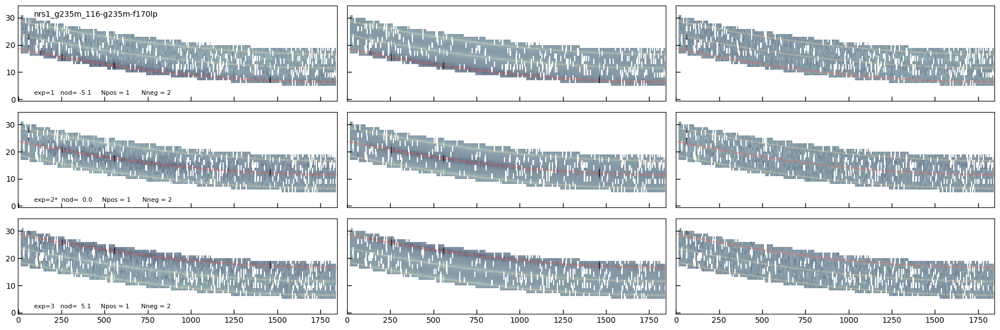

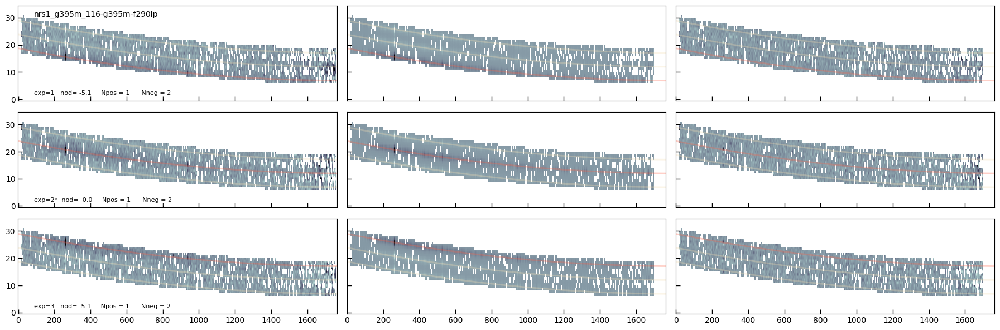

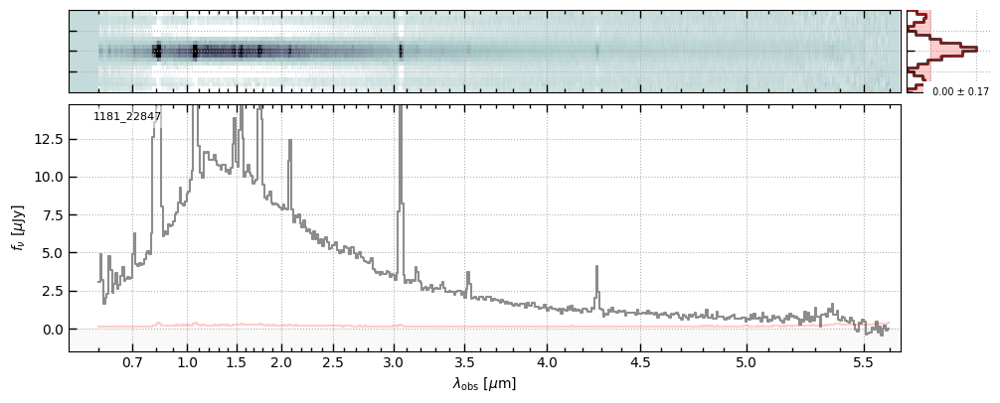

...

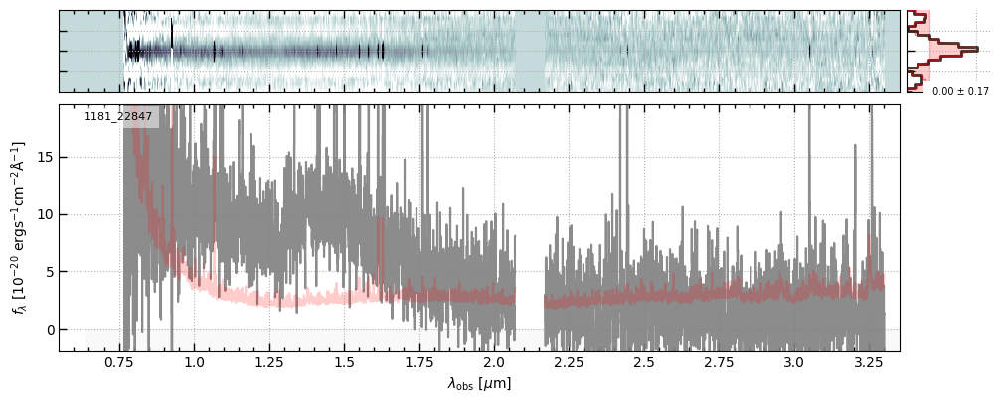

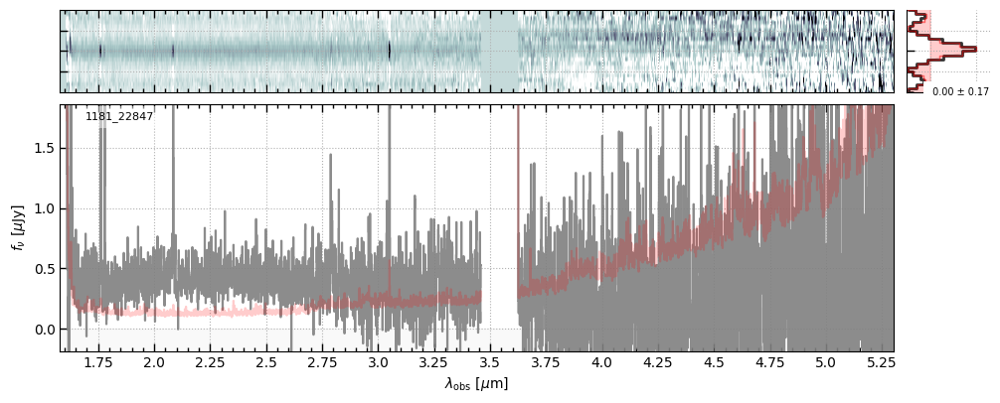

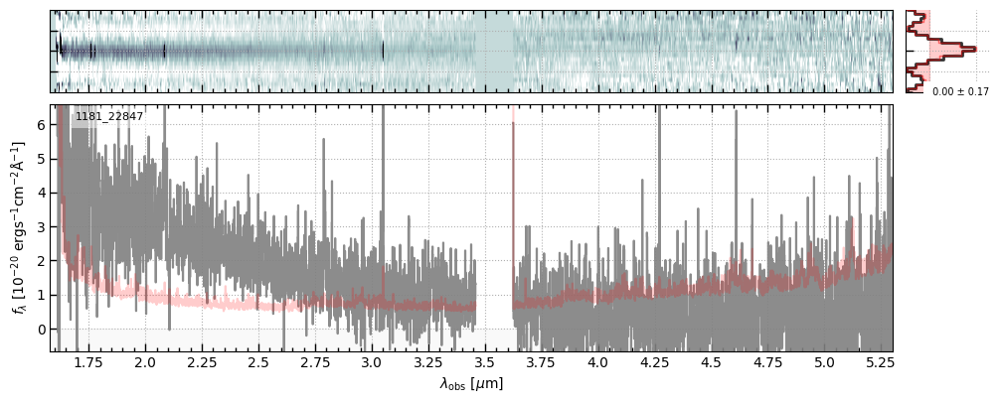

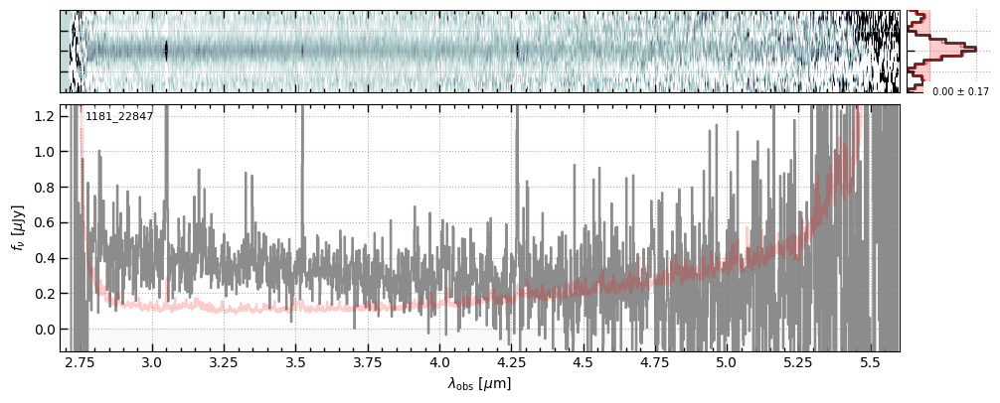

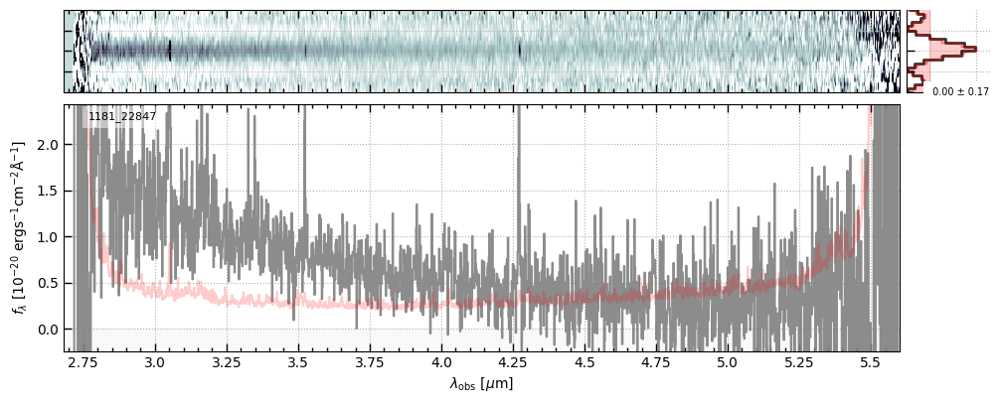

In [319]:
import gc
import matplotlib.pyplot as plt
import time
import traceback
from msaexp.slit_combine import extract_spectra
import jwst.datamodels


PLOT_OFF = False
SKIP_COMPLETED = False
IS_INTERACTIVE = True

done = []

plt.rcParams['scatter.marker'] = '.'

if PLOT_OFF:
    plt.ioff()

join = [3, 5, 7]

for key in targets:
    # for key in keys:

    # plt.close('all')
    # files = glob.glob(f'*{key}.spec.fits')
    # files += glob.glob(f'*{key}.extract.log')
    # files += glob.glob(f'*{key.replace("m","-").replace("_b", "_background_")}.spec.fits')
    # if ((len(files) > 0) | (key in done)) & SKIP_COMPLETED:
    #     print('Skip: ', key)
    #     continue

    utils.LOGFILE = f'{outroot}_{key}.extract.log'
    utils.log_comment(utils.LOGFILE, 'Start', verbose=True, show_date=True)

    # pfiles = glob.glob(f'*phot.*{key}.fits')
    # pfiles.sort()
    
    if len(pfiles + rfiles) < 2:
        print('Skip: ', key, len(pfiles), 'files')
        continue

    print('Run: ', key)
    
    try:
        DRIZZLE_KWS = dict(step=1,
                       # with_pathloss=True,
                        with_pathloss=False,
                        wave_sample=1.05,
                        ny=15,
                        dkws=dict(oversample=16, pixfrac=0.8),
                               grating_limits=GRATING_LIMITS,
                          )
        
        FIT_PARAMS_SN_KWARGS = dict(sn_percentile=95,
                                    sigma_threshold=0,
                                    # degree_sn=[[-10000,10,100], [0,1,2]],
                                    degree_sn=[[-10000], [0]],
                                    verbose=True)

        if 'b' in key:
            msaexp.slit_combine.CENTER_WIDTH = 0.1
            initial_theta = [5., -0.5]
        else:
            msaexp.slit_combine.CENTER_WIDTH = 0.1
            initial_theta = None
            # initial_theta = [5., -2.5]

        position_key = 'y_index'
        trace_from_yoffset = True

        kwargs = dict(
            path_to_files='./',
            files=rfiles,
            root=outroot,
            do_gratings=['PRISM','G140H','G235H','G395H','G395M','G235M','G140M'][:],
            join=join,
            stuck_min_sn=0.9 - 500,
            pad_border=2,
            sort_by_sn=True,
            position_key=position_key,
            reference_exposure='auto',
            offset_degree=1,
            trace_from_yoffset=trace_from_yoffset,
            recenter_all=False,
            initial_sigma=5,
            fit_type=1,
            initial_theta=initial_theta,
            fix_params=False,
            input_fix_sigma=None,
            fit_params_kwargs=FIT_PARAMS_SN_KWARGS,
            drizzle_kws=DRIZZLE_KWS,
            undo_barshadow=False,
            undo_pathloss=True,
            get_xobj=True,
            make_2d_plots=2,
        )

        kwargs['fix_prism_norm'] = False
        
        if 0:
            # Use point source pathloss
            kwargs['drizzle_kws']['with_pathloss'] = False; kwargs['undo_pathloss'] = 2
        else:
            kwargs['drizzle_kws']['with_pathloss'] = True; kwargs['undo_pathloss'] = 1
    
        kwargs['split_uncover'] = 1
        kwargs['pad_border'] = 0
        
        kwargs['hot_cold_kwargs'] = None #{'dilate':1}
        # kwargs['hot_cold_kwargs'] = {'cold_percentile':0.5, 'hot_percentile':99.95, 'absolute':False}
        # kwargs['hot_cold_kwargs'] = {'cold_percentile':0.5, 'hot_percentile':99.9, 'absolute':False}
        
        # kwargs['initial_theta'] = [5, -5.]
        kwargs['fix_params'] = False
        kwargs['flag_profile_kwargs'] = None #{'make_plot': True, 'grow': 2, 'require_multiple': False}
        # kwargs['flag_profile_kwargs'] = {'require_multiple': True, 'make_plot': True, 'nfilt':-32, 'grow': 2.}
        kwargs['flag_percentile_kwargs'] = dict(plevels=[0.95, -4, -0.1], yslit=[-2, 2], scale=2., dilate=np.ones((3,3)))
        kwargs['flag_trace_kwargs'] = {}
        
        kwargs['weight_type'] = 'ivm'
        
        estimate_sky_kwargs={'make_plot':True, 'df':71,
                             'outlier_threshold': 7,
                             'var_percentiles': [-2,-2],
                             'absolute_threshold':0.2,
                             'min_bar': 0.95,
                             'mask_yslit': [[-4, 4]],
                             'high_clip':0.9,
                            }
            
        if outroot.startswith('glazebrook'):
            estimate_sky_kwargs['mask_yslit'] = [[-8,8]]
            estimate_sky_kwargs['absolute_threshold'] = 0.1
            kwargs['pad_border'] = 2

        kwargs['undo_barshadow'] = 2
        kwargs['min_bar'] = 0.4
        
        kwargs['fixed_offset'] = 0.0
        kwargs['bar_corr_mode'] = 'wave'
        
        if outroot.split('-v')[0] in ['macsj0647-hr']:
            # kwargs['diffs'] = True
            kwargs['diffs'] = False
            # estimate_sky_kwargs = None
            estimate_sky_kwargs['df'] = 15
            kwargs['hot_cold_kwargs'] = None
            # kwargs['join'] = [0,3]
        else:
            kwargs['diffs'] = False

        ####
        # Scale global sky spectrum
        sky_file = f'{outroot}_prism_sky.csv'

        if os.path.exists(sky_file) & (1):
            
            print(f'\n use {sky_file} for global sky')
        
            sky_data = utils.read_catalog(sky_file)
            kwargs['sky_arrays'] = sky_data['wave'], sky_data['flux']

            kwargs['pad_border'] = 1
            
            estimate_sky_kwargs['df'] = 0
            estimate_sky_kwargs['mask_yslit'] = [[-4, 4]]

            if 1:
                estimate_sky_kwargs['df'] = 5
                estimate_sky_kwargs['mask_yslit'] = [[-6, 6]]
                if outroot.startswith('glazebrook'):
                    estimate_sky_kwargs['mask_yslit'] = [[-8,8]]

            # Fixed sky
            if 0:
                estimate_sky_kwargs['df'] = -1
                estimate_sky_kwargs['mask_yslit'] = [[-8, 8]]
            
            estimate_sky_kwargs['outlier_threshold'] = 7
            
            if 0:
                estimate_sky_kwargs['outlier_threshold'] = 1000
        
        kwargs['estimate_sky_kwargs'] = estimate_sky_kwargs
        kwargs['fix_prism_norm'] = True

        if outroot.split('-v3')[0] in ['gds-barrufet-s67']:
            kwargs['diffs'] = True
            kwargs['sky_arrays'] = None
            kwargs['estimate_sky_kwargs'] = None

        if outroot.split('-v3')[0] in ['macsj0647-single','whl0137']:
            kwargs['diffs'] = False
            kwargs['estimate_sky_kwargs'] = None
            kwargs['join'] = [0,3,5]
            kwargs['flag_profile_kwargs'] = {'make_plot':True, 'grow':4}
            kwargs['flag_trace_kwargs'] = None
            kwargs['make_2d_plots'] = False
            kwargs['pad_border'] = 0
            kwargs['min_bar'] = 0.1

        if 0:
            kwargs['initial_theta'] = [8, 0.]
            kwargs['fit_params_kwargs']['sigma_threshold'] = -10

        if 0:
            kwargs['input_fix_sigma'] = 10.

        BAD_PIXEL_NAMES = [
            "DO_NOT_USE",
            # "OTHER_BAD_PIXEL",
            "MSA_FAILED_OPEN",
            # "UNRELIABLE_SLOPE",
            # "UNRELIABLE_BIAS",
            # "NO_SAT_CHECK",
            # "NO_GAIN_VALUE",
            "HOT",
            "DEAD",
            # # "TELEGRAPH",
            # "RC",
            # "LOW_QE",
            "OPEN",
            "ADJ_OPEN",
            "SATURATED",
        ]
        msaexp.slit_combine.BAD_PIXEL_FLAG = 1024
        for _bp in BAD_PIXEL_NAMES:
            msaexp.slit_combine.BAD_PIXEL_FLAG |= jwst.datamodels.dqflags.pixel[_bp]
        
        # Use point source path loss to compare to MAST
        if 0:
            kwargs['drizzle_kws']['with_pathloss'] = False
            kwargs['undo_pathloss'] = 0 # to compare to mast

        if 1:
            kwargs["sky_file"] = "read"
            # kwargs["global_sky_df"] = -1; kwargs['estimate_sky_kwargs'] = None
            kwargs["global_sky_df"] = 7
            kwargs['estimate_sky_kwargs']['mask_yslit'] = [[-8, 8]]
            kwargs['estimate_sky_kwargs']['high_clip'] = 1.5
            kwargs['estimate_sky_kwargs']['absolute_threshold'] = 1.

        if outroot.split('-v')[0] in ['cecilia', 'cosmos-curti','stark-a1703','cosmos-alpha', 'stark-rxcj2248']:
            kwargs['recenter_all'] = True
            kwargs['grating_diffs'] = False
            kwargs['diffs'] = True
            # kwargs['flag_percentile_kwargs'] = {'plev': [0.95, 0.9999, 0.999999], 'scale':2, 'dilate':False}
            # kwargs['flag_profile_kwargs'] = None
            # kwargs['flag_profile_kwargs'] = {'require_multiple': True, 'make_plot': True, 'nfilt':-32, 'grow': 3.}
            kwargs['include_full_pixtab'] = ['PRISM']

        if outroot.split('-v3')[0] in ['abell2744-glass']:
            kwargs['diffs'] = True
            kwargs['sky_arrays'] = None
            kwargs['estimate_sky_kwargs'] = None
            kwargs['valid_frac_threshold'] = 0.1

            kwargs['dilate_failed_open'] = False

            if key in ['1324_180009', '1324_320027']:
                kwargs['num_shutters'] = -1
            else:
                kwargs['num_shutters'] = 0

            import msaexp.utils as msautils
            import jwst.datamodels
            
            print(msautils.BAD_PIXEL_FLAG)
            msautils.BAD_PIXEL_FLAG = 1 | 1024
            
            if "MSA_FAILED_OPEN" in msautils.BAD_PIXEL_NAMES:
                print("pop failed open dq flag")
                _ = msautils.BAD_PIXEL_NAMES.pop(msautils.BAD_PIXEL_NAMES.index("MSA_FAILED_OPEN"))
                msautils._set_bad_pixel_flag()
            
            for _bp in msautils.BAD_PIXEL_NAMES:
                msautils.BAD_PIXEL_FLAG |= jwst.datamodels.dqflags.pixel[_bp]
            
            print(msautils.BAD_PIXEL_FLAG)

        # kwargs['diffs'] = True
        # kwargs['fit_params_kwargs']['degree_sn'] = [[-10000,30,100], [0,1,2]]
        if outroot == 'xglazebrook-v3':
            kwargs['fixed_offset'] = 0.19
        
        kwargs['diffs'] = True

        if outroot in ['ceers-v3', 'macs0416-v3', 'macs1423-v3', 'abell370-v3', 'macs1149-v3', 'gds-egami-ddt-v3', 'macs0417-v3']:
            kwargs['diffs'] = False

        if outroot.startswith('rubies') & ('v3' in outroot):
            kwargs['diffs'] = False

        if (outroot in ['jades-gds-wide3-v3', 
                        'jades-gds-w03-v3',
                        'jades-gds-w05-v3',
                        'jades-gds-w06-v3',
                        'jades-gds-w07-v3',
                        'jades-gds-w08-v3',
                        'jades-gds-w09-v3',
                        'jades-gds05-v3',
                        'abell2744-castellano1-v3',
                      ]) & (True):
            kwargs['diffs'] = False
            if FORCE_DIFFS:
                kwargs['diffs'] = True

        if '-nod' in outroot:
            kwargs['diffs'] = True
        
        elif outroot in ['xrubies-uds31-v3', 'xrubies-uds32-v3', 'xrubies-uds33-v3',
                         'uncover-62-v3', 'uncover-61-v3']:
            kwargs['diffs'] = True
            
        if key in ['4233_61167', '4233_61168']:
            turn_off_flagging = True
            kwargs['grating_diffs'] = True
            kwargs['mask_cross_dispersion'] = [8,1000]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            # kwargs['estimate_sky_kwargs']['df'] = -1
        else:
            kwargs['mask_cross_dispersion'] = None
            kwargs['cross_dispersion_mask_type'] = 'trace'
            turn_off_flagging = False

        if key in ['4233_131457']:
            kwargs['mask_cross_dispersion'] = [3,1000]
            kwargs['cross_dispersion_mask_type'] = 'fixed'
            
        if IS_INTERACTIVE & (1) & (key in ['2561_80166', '2561_80006', '2561_31609']):
            turn_off_flagging = True
            kwargs['diffs'] = False
            kwargs['estimate_sky_kwargs']['df'] = -1
            kwargs['global_sky_df'] = -1
            
        if turn_off_flagging:
            print('Turn off bad pixel flagging')
            kwargs['flag_trace_kwargs'] = None
            kwargs['flag_percentile_kwargs'] = None
            kwargs['flag_profile_kwargs'] = None
            kwargs['estimate_sky_kwargs']['outlier_threshold'] = 10000000
            kwargs['estimate_sky_kwargs']['high_clip'] = 100000

        if (outroot == 'j0252m0503-hennawi-07-v3') & (IS_INTERACTIVE):
            kwargs['diffs'] = True
            
        if outroot.startswith('macsj0647-hr'):
            _files = glob.glob(f'jw04246003001_0310[135]*{key}.fits')
            print(f'{outroot} manual {len(_files)} files {key}')
            if len(_files) == 0:
                continue
                
            kwargs['files'] = _files
            # kwargs['valid_frac_threshold'] = 0.01
            # kwargs['files'] = None
            kwargs['diffs'] = False
            kwargs['grating_diffs'] = False
            kwargs['make_2d_plots'] = False
            kwargs['trace_with_ypos'] = True
            kwargs['trace_from_yoffset'] = False
            kwargs['sky_file'] = 'jw04246003001_sky.csv'
            # kwargs['estimate_sky_kwargs'] = None
            kwargs['global_sky_df'] = 0
            # kwargs['estimate_sky_kwargs']['mask_yslit'] = [[100,-100]]
            kwargs['estimate_sky_kwargs']['outlier_threshold'] = 7
            # kwargs['drizzle_kws']['wave_sample'] = 0.95
            kwargs['drizzle_kws']['dkws']['pixfrac'] = 1.0
            kwargs['estimate_sky_kwargs']['high_clip'] = 5
            kwargs['flag_profile_kwargs'] = {'require_multiple':False, 'make_plot':False}
            kwargs['initial_theta'] = [4.0, 0]
            kwargs['fix_params'] = True
            kwargs['plot_kws'] = {'smooth_sigma':2, 'ymax_sigma_scale':15}
            
        elif (outroot == 'jades-gds-w09-v3') & (key == 'b32'):
            # print('yes')
        
            _files = glob.glob('*phot*b32.fits')
            _files.sort()
            if 0:
                kwargs['files'] = _files[-3:] #_files
                kwargs['bad_shutter_names'] = [1]
            else:
                kwargs['files'] = _files[:-3]
                
        else:
            kwargs['files'] = None

        if 'castellano' in outroot:
            #  kwargs['sky_file'] = 'jw03073010001_sky.csv'
            kwargs['diffs'] = True

        if key in ['3073_22600']:
            kwargs['mask_cross_dispersion'] = [7,100]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            kwargs["diffs"] = True

        if key in ['3073_22600', '3073_21352', '3073_23628']:
            kwargs["diffs"] = True

        if '-xoff' in outroot:
            kwargs['trace_with_xpos'] = True
        
        if ('-v4' in outroot) & (True):
            kwargs['trace_with_xpos'] = True
            kwargs['fix_prism_norm'] = False
            kwargs['diffs'] = len(glob.glob('*sky.csv')) == 0
            if kwargs['diffs']:
                kwargs['estimate_sky_kwargs'] = None
            
            kwargs['include_full_pixtab'] = ['PRISM','G140M','G235M','G395M']

            # kwargs['files'] = glob.glob(f'*_b00*{key}.fits')
            # kwargs['files'].sort()
            
            if FORCE_DIFFS:
                kwargs['diffs'] = True

        ######################
        kwargs['estimate_sky_kwargs'] = None
        kwargs['sky_file'] = None
        kwargs['fix_prism_norm'] = False
        kwargs['min_extended_calibration'] = 0.05
        kwargs['min_extended_calibration'] = None
        kwargs['files'] = pfiles

        kwargs['extended_calibration_kwargs'] = None

        kwargs['trace_with_xpos'] = True
        
        if 0:
            kwargs['mask_cross_dispersion'] = [-100,2]
            kwargs['cross_dispersion_mask_type'] = 'fixed'
        elif key == '3567_66283':
            kwargs['mask_cross_dispersion'] = [-100,-5]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            
        if 'kriek' in outroot:
            kwargs['recenter_all'] = True
            
        #### 
        ##  Run it
        kwargs['drizzle_kws']['with_pathloss'] = False

        if (1) & (len(pfiles) > 0):
            kwargs['files'] = pfiles
            kwargs['root'] = outroot.replace('vx','vo').replace('-v3','-vo')      
            hdul, xobj = extract_spectra(target=key, **kwargs)

        if (1) & (len(rfiles) > 0):
            kwargs['files'] = rfiles
            kwargs['extended_calibration_kwargs'] = None
            kwargs['root'] = outroot.replace('-v3','-vx')      
            hdul, xobj = extract_spectra(target=key, **kwargs)

        if (1) & (len(rfiles) > 0):
            kwargs['files'] = rfiles
            kwargs['root'] = outroot.replace('-vx','-vy')      
            kwargs['extended_calibration_kwargs'] = {"threshold": 0.005}
            hdul, xobj = extract_spectra(target=key, **kwargs)

    except:
        print('Failed: ', key)
        utils.log_exception(utils.LOGFILE, traceback, verbose=True, mode='a')

    utils.log_comment(utils.LOGFILE, 'Done', verbose=True, show_date=True)
    
    done.append(key)
    if IS_INTERACTIVE & (1):
        break

    gc.collect()
    gc.collect()
    gc.collect()

if PLOT_OFF:
    plt.ion()


(0.6, 4.7)

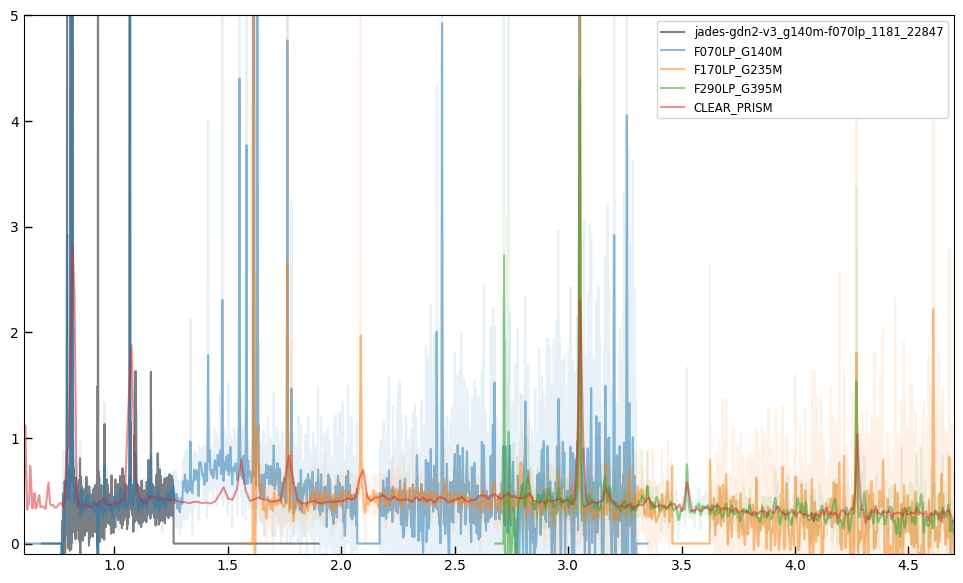

In [325]:
import scipy.ndimage as nd

new_spe_files = glob.glob(f'{outroot.replace("vx","vy")}*{source_id}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

grating_smooth = 2

plt.plot(spe["wave"], spe["flux"] * spe["to_flam"]**flam, label=os.path.basename(spe_file).split('.spec')[0], color='0.5')

ymax = None
xmin, xmax = 10, 0
for new_file in new_spe_files:
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    flux = new_spe["flux"] * new_spe["to_flam"]**flam
    if 'prism' in new_file:
        plt.plot(new_spe["wave"], flux, label=inst_key, alpha=0.5) #color='tomato')
        ymax = flux[new_spe.valid].max()
        
    else:
        smoothed_flux = flux*0.
        smoothed_flux[new_spe.valid] = nd.gaussian_filter1d(flux[new_spe.valid], grating_smooth)

        pl = plt.plot(new_spe["wave"], flux, alpha=0.1)
        plt.plot(new_spe["wave"], smoothed_flux, label=inst_key, alpha=0.5, color=pl[0].get_color())


    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

plt.xlim(xmin, xmax)
if ymax is not None:
    plt.ylim(-0.2*ymax, 2*ymax)
    
inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

fflat = utils.read_catalog(f"wd_sensitivity_{inst_key}.fits")

corr = np.interp(new_spe["wave"], fflat["wavelength"], fflat["sensitivity"])

calspec_rebin = new_spe["flux"] # / corr

if "sensitivity_2" in fflat.colnames:
    calspec_rebin_extra = calspec_rebin*np.interp(new_spe["wave"], fflat["wavelength"], fflat["sensitivity_2"])
    calspec_rebin_extra[~np.isfinite(calspec_rebin_extra)] = 0

    # corr = 1./spec[k].spec['fcorr']
    extra = np.interp(new_spe["wave"], new_spe["wave"]*2, calspec_rebin_extra) * corr
    ax.plot(new_spe['wave'], extra * new_spe["to_flam"]**flam, color='pink')

# plt.xlim(1.7, 3.1)

# plt.xlim(2.8, 3.7)

# plt.xlim(0.9, 2.5) #; plt.ylim(-1, 6)

# plt.ylim(-1, 30)
ax.legend()

# plt.ylim(-0.1, 1)
# plt.xlim(3.5, 5.6)

# plt.xlim(2.5, 4.3)

# plt.ylim(-0.5, 4); plt.xlim(3.8, 5.6)

#plt.xlim(0.6, 5.9)

plt.ylim(-0.1, 5); plt.xlim(0.6, 3.7)

# plt.xlim(0.6, 4)

(-0.5, 8.0)

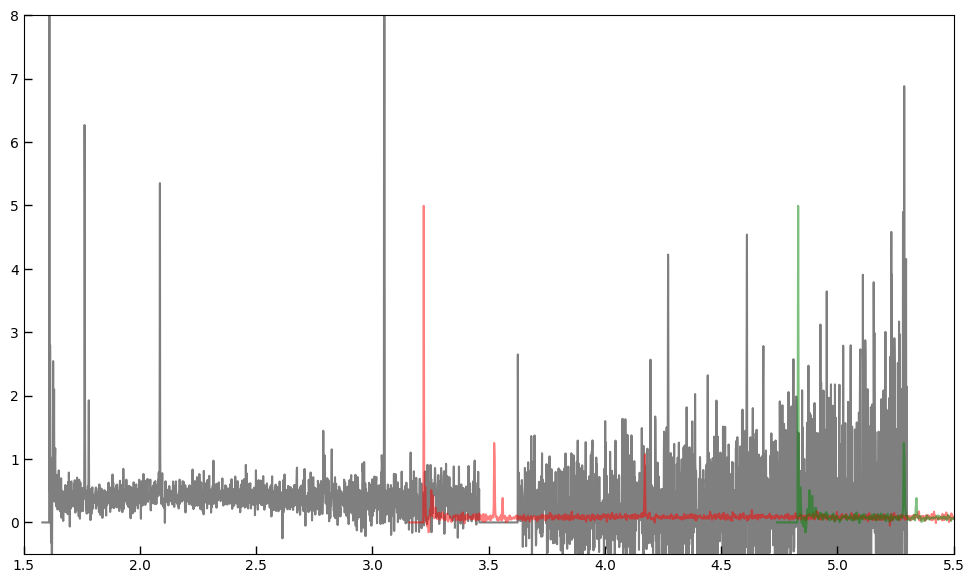

In [328]:
fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

grating_smooth = 2

# plt.plot(spe["wave"], spe["flux"] * spe["to_flam"]**flam, label=os.path.basename(spe_file).split('.spec')[0], color='0.5')

ymax = None
xmin, xmax = 10, 0
for new_file in new_spe_files:
    if 'g23' not in new_file:
        continue
        
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    ax.plot(new_spe["wave"], new_spe["flux"], color='k', alpha=0.5)
    ax.plot(new_spe["wave"]*2, new_spe["flux"]*0.2, color='r', alpha=0.5)
    ax.plot(new_spe["wave"]*3, new_spe["flux"]*0.2, color='g', alpha=0.5)
    # break
    
if new_spe.meta['GRATING'] == 'G140M':
    plt.xlim(0.6, 3.3)

if new_spe.meta['GRATING'] == 'G235M':
    plt.xlim(1.5, 5.5)

plt.ylim(-0.5, 8)
# plt.xlim(3.6, 3.9)

# plt.xlim(2.1, 2.2)

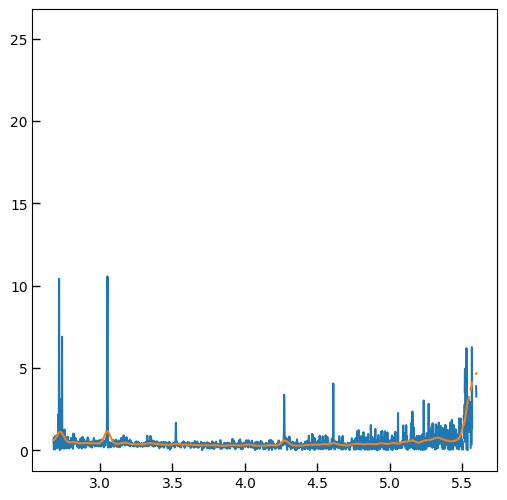

In [316]:
new_file = new_spe_files[2]

new_spe = msaexp.spectrum.SpectrumSampler(new_file)
old_spe = msaexp.spectrum.SpectrumSampler(new_file.replace('-vx','-vx'))
oflux = old_spe["flux"]

fill = new_spe["wave"]*0.
for _f in [new_file] + new_spe_files:

    if 'prism' in new_file:
        if 'prism' not in _f:
            continue
    elif 'g140' in new_file:
        if 'prism' in _f:
            continue
    
    else:
        if 'xprism' in _f:
            continue
            
    old_spe = msaexp.spectrum.SpectrumSampler(_f.replace('-vx','-vo'))
    if 'prism' in _f:
        old_spe.valid &= nd.binary_erosion(old_spe.valid, iterations=1) #(old_spe["wave"] > 0.7) & (old_spe["wave"] < 5.3)
        
    ofl = old_spe["flux"]
    ofl[~old_spe.valid] = np.nan
    
    fi = np.interp(new_spe["wave"], old_spe["wave"], old_spe["flux"], left=0, right=0)
    ok = (fi > 0) & np.isfinite(fi) & (fill == 0)
    
    fill[ok] = fi[ok]

fill[fill == 0] = np.nan

okf = np.isfinite(fill)

plt.plot(new_spe["wave"], fill)

fill[okf] = nd.gaussian_filter1d(fill[okf], 12)
plt.plot(new_spe["wave"], fill)


In [287]:
new_spe_files

['jades-gdn2-vy_g140m-f070lp_1181_27395.spec.fits',
 'jades-gdn2-vy_g235m-f170lp_1181_27395.spec.fits',
 'jades-gdn2-vy_g395m-f290lp_1181_27395.spec.fits',
 'jades-gdn2-vy_prism-clear_1181_27395.spec.fits']

(0.9, 5.7)

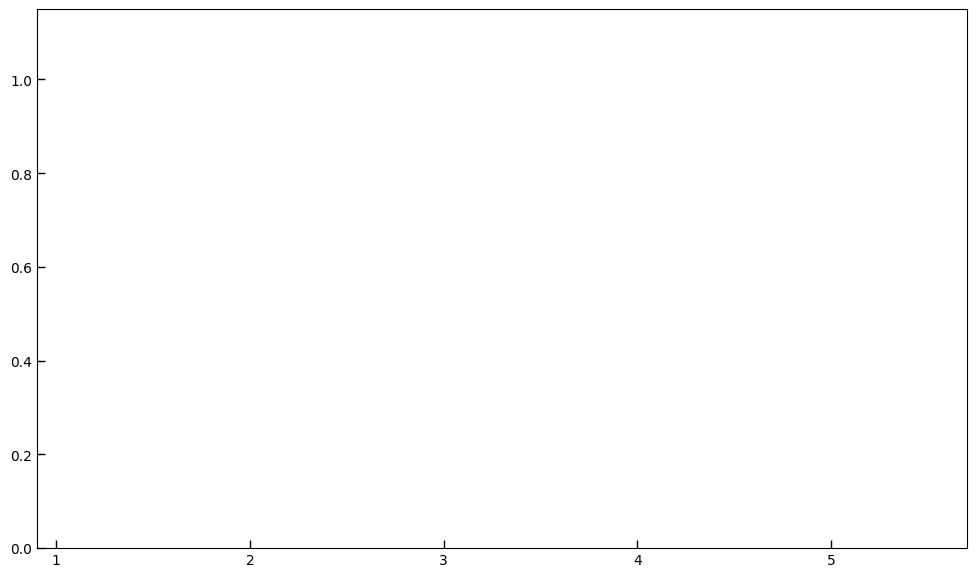

In [288]:
new_spe_files = glob.glob(f'{outroot}*{source_id}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

xmin, xmax = 10, 0
for new_file in new_spe_files:
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    old_spe = msaexp.spectrum.SpectrumSampler(new_file.replace('-vx','-vo'))
    oflux = old_spe["flux"]
    
    fill = new_spe["wave"]*0.
    for _f in [new_file] + new_spe_files:

        if 'prism' in new_file:
            if 'prism' not in _f:
                continue
        elif 'g140' in new_file:
            if 'prism' in _f:
                continue
        else:
            if 'xprism' in _f:
                continue
                
        old_spe = msaexp.spectrum.SpectrumSampler(_f.replace('-vx','-vo'))
        if 'prism' in _f:
            old_spe.valid &= nd.binary_erosion(old_spe.valid, iterations=1) & (old_spe["wave"] > 0.9) & (old_spe["wave"] < 5.3)

        ofl = old_spe["flux"]
        ofl[~old_spe.valid] = np.nan
        
        fi = np.interp(new_spe["wave"], old_spe["wave"], old_spe["flux"], left=0, right=0)
        ok = (new_spe.valid) & (fi > 0) & np.isfinite(fi) & (fill == 0)
        
        fill[ok] = fi[ok]

    # fill = nd.gaussian_filter(fill, 5)
    fill[fill == 0] = np.nan

    okf = np.isfinite(fill)
    if 'prism' not in new_file:
        # fill[okf] = nd.median_filter(fill[okf], 3)
        fill[okf] = nd.gaussian_filter1d(fill[okf], 3)

    # oflux = fill
    
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    # plt.plot(new_spe["wave"], new_spe["flux"] / oflux, label=inst_key, alpha=0.5) #color='tomato')
    scl = 25 if 'prism' in new_file else 1.0
    
    fflat = utils.read_catalog(f"p330e_s1600a1_sensitivity_{inst_key}.fits")
    fflat = utils.read_catalog(f"fix_p330e_s1600a1_sensitivity_{inst_key}.fits")
    # plt.plot(fflat["wavelength"], fflat["sensitivity"]*0.75, alpha=0.3)

    newf = new_spe["flux"]*1
    if 'prism' not in new_file:
        newf[new_spe.valid] = nd.gaussian_filter1d(newf[new_spe.valid], 3)

    plt.plot(new_spe["wave"], newf / fill / scl, label=inst_key, alpha=0.5) #, color='tomato')

    ratio = newf / fill
    ri = np.interp(fflat["wavelength"], new_spe["wave"], ratio, left=np.nan, right=np.nan)
    okr = np.isfinite(ri)

    # plt.plot(fflat["wavelength"][okr], (ri/fflat["sensitivity"])[okr])

    bspl = utils.bspline_templates(fflat["wavelength"], df=7, get_matrix=True)
    c = np.linalg.lstsq(bspl[okr,:], (ri/fflat["sensitivity"])[okr], rcond=None)
    cc = bspl.dot(c[0])

    # cc = cc**0
    
    # plt.plot(fflat["wavelength"], cc, color='r', alpha=0.5)
    
    # c = np.polyfit(fflat["wavelength"][okr], (ri/fflat["sensitivity"])[okr], 5)
    # cc = np.polyval(c, fflat["wavelength"])
    fix_sens = fflat["sensitivity"]*cc
    oflux[oflux == 0] = np.nan
    if 'g140m' in new_file:
        oflux[new_spe["wave"] < 0.9] = np.nan

    if '100lp' in new_file:
        oflux[new_spe["wave"] < 1.] = np.nan
    
    ora = np.interp(fflat["wavelength"], new_spe["wave"], new_spe["flux"]/oflux, left=np.nan, right=np.nan)
    # ora = np.interp(fflat["wavelength"], new_spe["wave"], new_spe["flux"]/oflux, left=np.nan, right=np.nan)
    # ora = fill / oflux
    
    print(new_file)
    if ('x395m' not in new_file) & (1):
        fix_sens[np.isfinite(ora)] = ora[np.isfinite(ora)]
    
    plt.plot(fflat["wavelength"], fix_sens / scl, alpha=0.3, color='magenta', lw=3)
    plt.plot(fflat["wavelength"], fflat["sensitivity"] / scl, alpha=0.3, color='g', lw=2)

    fflat["sensitivity"] = fix_sens
    
    # fflat.write(f"fix_p330e_s1600a1_sensitivity_{inst_key}.fits", overwrite=True)
    
    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

plt.xlim(0.5, 5.8)

plt.ylim(0, 1.15)

# plt.xlim(2.5, 3.6)

plt.xlim(0.9, 5.7)

# plt.xlim(0.5, 1.0)

(-1.0, 60.0)

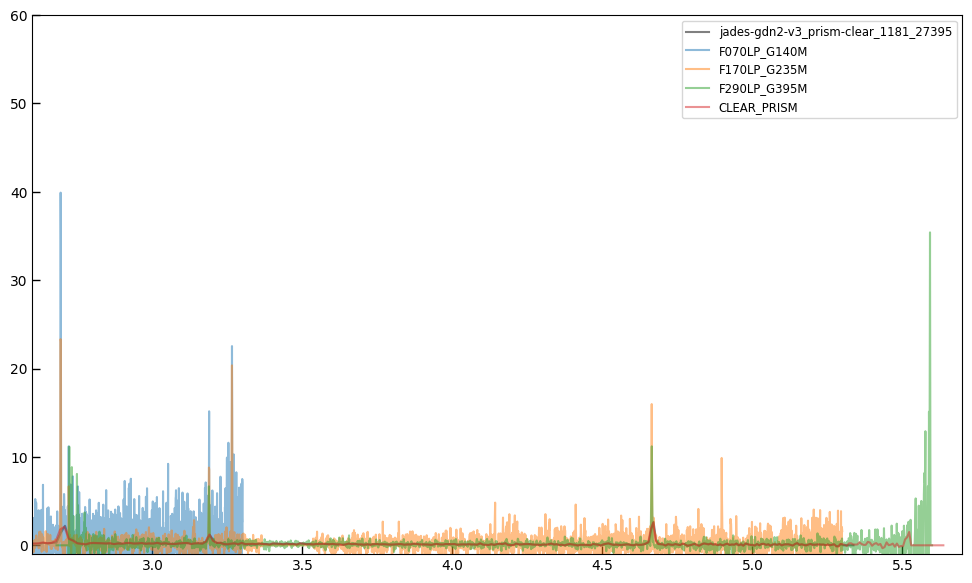

In [289]:
new_spe_files = glob.glob(f'{outroot.replace("vx","vy")}*{source_id}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 1

plt.plot(spe["wave"], spe["flux"] * spe["to_flam"]**flam, label=os.path.basename(spe_file).split('.spec')[0], color='0.5')

xmin, xmax = 10, 0
for new_file in new_spe_files:
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    plt.plot(new_spe["wave"], new_spe["flux"] * new_spe["to_flam"]**flam, label=inst_key, alpha=0.5) #color='tomato')

    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

plt.xlim(xmin, xmax)

inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

fflat = utils.read_catalog(f"wd_sensitivity_{inst_key}.fits")

corr = np.interp(new_spe["wave"], fflat["wavelength"], fflat["sensitivity"])

calspec_rebin = new_spe["flux"] # / corr

if "sensitivity_2" in fflat.colnames:
    calspec_rebin_extra = calspec_rebin*np.interp(new_spe["wave"], fflat["wavelength"], fflat["sensitivity_2"])
    calspec_rebin_extra[~np.isfinite(calspec_rebin_extra)] = 0

    # corr = 1./spec[k].spec['fcorr']
    extra = np.interp(new_spe["wave"], new_spe["wave"]*2, calspec_rebin_extra) * corr
    ax.plot(new_spe['wave'], extra * new_spe["to_flam"]**flam, color='pink')

# plt.xlim(1.7, 3.1)

# plt.xlim(2.8, 3.7)

# plt.xlim(0.9, 2.5) #; plt.ylim(-1, 6)

plt.ylim(-1, 40)
#plt.xlim(2.4, 5.5)

# plt.xlim(1.8, 2.4)

ax.legend()

plt.xlim(2.6, 5.7); plt.ylim(-1, 60)



# (2024-11-03 09:53:59.177)

spectrum.fit_redshift(**{'file': 'bluejay-south-vy_g395m-f290lp_1810_11142.spec.fits', 'z0': [1.5, 3.2], 'zstep': None, 'nspline': None, 'scale_disp': 1.3, 'vel_width': 100, 'Rline': None, 'is_prism': False, 'use_full_dispersion': False, 'ranges': None, 'sys_err': 0.02, 'kwargs': {}, 'froot': 'bluejay-south-vy_g395m-f290lp_1810_11142'})



519it [00:05, 99.99it/s] 
501it [00:05, 98.04it/s] 



# line flux err
# flux x 10^-20 erg/s/cm2
# bluejay-south-vy_g395m-f290lp_1810_11142.spec.fits
# z = 2.44788
# Sun Nov  3 10:54:09 2024


# line flux err
# flux x 10^-20 erg/s/cm2
# bluejay-south-vy_g395m-f290lp_1810_11142.spec.fits
# z = 2.44788
# Sun Nov  3 10:54:10 2024
       line HeI-8446        0.0 ±      0.0 (EW=      0.0)
           line Pa10      -79.4 ±     18.4 (EW=     -6.0)
      line SIII-9068       24.3 ±     21.1 (EW=      1.9)
            line Pa9      -66.2 ±     18.9 (EW=     -5.2)
      line SIII-9531       33.4 ±     20.7 (EW=      2.6)
            line Pa8       13.7 ±     18.4 (EW=      1.1)
        line CI-9850       20.7 ±     17.3 (EW=      1.6)
            line PaD      -71.8 ±     17.5 (EW=     -5.6)
       line HeI-1083      151.7 ±     18.7 (EW=     13.1)
            line PaG      -46.4 ±     16.6 (EW=     -4.2)
     line FeII-11128       40.7 ±     15.9 (EW=      3.8)
      line PII-11886       -7.3 ±     16.1 (EW=     -0.7)
     line FeII-12570       13

(2.8, 4.1)

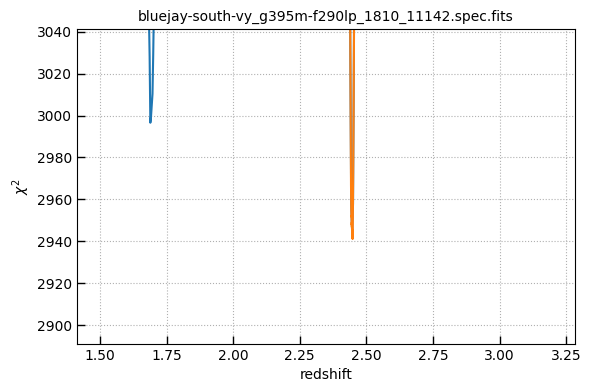

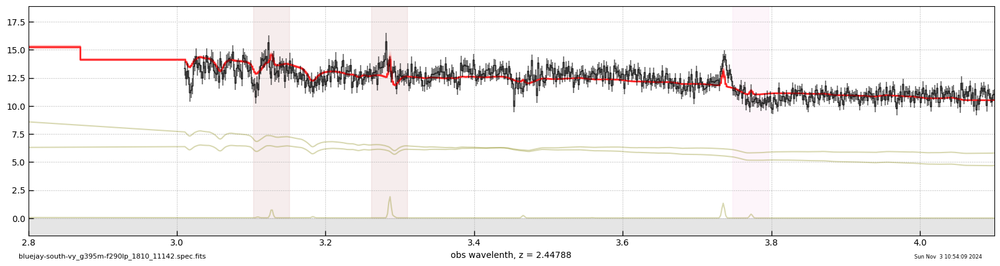

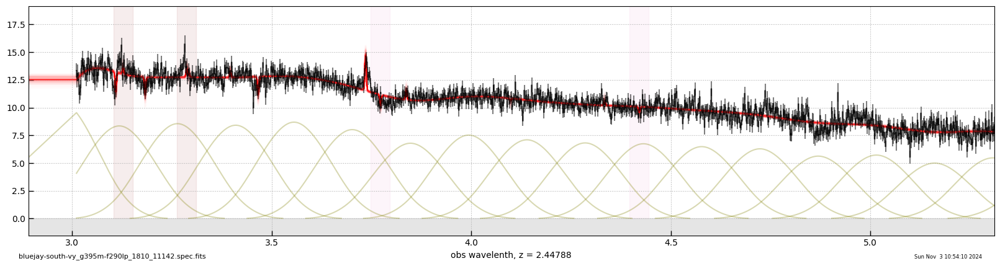

In [5639]:
_ = msaexp.spectrum.fit_redshift(file=new_file,
                             z0 = [1.5,3.2],
                                 eazy_templates=templ,
                            )

_[0].axes[-1].set_xlim(2.8, 4.1)

### template as reference

In [5640]:
import eazy

tlog = 10**np.arange(np.log10(50), np.log10(5.5e4), 1./2500/np.log(10))

igm_obj = eazy.igm.Inoue14()
z = 10
igm = igm_obj.full_IGM(z, tlog*(1+z))

if not os.path.exists('templates'):
    eazy.symlink_eazy_inputs()

otemp = eazy.templates.read_templates_file('templates/sfhz/agn_blue_sfhz_13.param')
# otemp = eazy.templates.read_templates_file('templates/fsps_full_2021/fsps_QSF_12_v3_narrow_nolines.param')

# Add PSB template
# psb = eazy.templates.Template('/mnt/efs/fs1/telescopes/NIRSpec/young_post_starburst.fits')
# otemp.append(psb)

templ = []
for ti in otemp:
    templ.append(ti.resample(tlog, in_place=False))
    templ[-1].flux *= igm

z = 3.13043
z = 1.69118
z = 1.678
z = 2.44788


In [5641]:
import msaexp.resample_numba
new_file

'bluejay-south-vy_g395m-f290lp_1810_11142.spec.fits'

(1.0, 2.5)

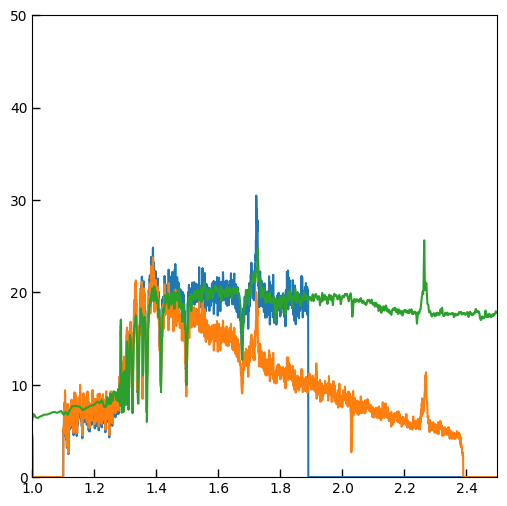

In [5653]:
pri_file = new_file.replace('vx','vo').replace('vy','vo')
pri_file = pri_file.replace('prism-clear','g395m-f290lp')
pri_file = pri_file.replace('g395m-f290lp', 'g140m-f100lp')
# pri_file = pri_file.replace('prism-clear','g235m-f170lp')
# pri_file = pri_file.replace('prism-clear','g140m-f070lp')

pri = msaexp.spectrum.SpectrumSampler(pri_file)

xpri = msaexp.spectrum.SpectrumSampler(pri_file.replace('vo','vx'))

dust = msaexp.resample_numba.calzetti2000_attenuation(pri["wave"].astype(float), z, 0.9)
dust = msaexp.resample_numba.smc_attenuation(pri["wave"].astype(float), z, 0.5)
dust = msaexp.resample_numba.smc_attenuation(pri["wave"].astype(float), z, 0.0)

atemp = np.array([pri.resample_eazy_template(t, z=z, scale_disp=1.8, fnu=True)*dust for t in templ])

lines = ['OII', 'Ha+NII','OI-6302','OIII','SII','SIII','CI-9850', 'PaG','PaD','PaB','HeI-1083','FeII-12570']
lw, lr = utils.get_line_wavelengths()

ltemp = []
for l in lines:
    lws = lw[l]
    for lwi in lws:
        ltemp.append(pri.fast_emission_line(lwi*(1+z)/1.e4, scale_disp=1.8))

A = np.vstack([atemp, ltemp])
A = (A.T / np.linalg.norm(A, ord=2, axis=1)).T

okt = np.isfinite(A.sum(axis=1))
A = A[okt,:]

Ax = A / pri['full_err']
ok = (pri.valid) & (pri['wave'] < 5.3) & (pri["wave"] > 0.9)
# ok &= (pri.valid) & (pri['wave'] < 5.3) & (pri["wave"] > 2.0)
ok &= np.isfinite(pri["flux"]/pri["full_err"])

coef = nnls(Ax[:, ok].T, (pri['flux']/pri['full_err'])[ok])
# coef = np.linalg.lstsq(Ax[:, ok].T, (pri['flux']/pri['full_err'])[ok], rcond=None)
model = A.T.dot(coef[0])

plt.plot(pri["wave"], pri["flux"]*pri["to_flam"])
plt.plot(pri["wave"], xpri["flux"]*pri["to_flam"])
plt.plot(pri["wave"], model * pri["to_flam"])

plt.ylim(0, 50)
plt.xlim(0.5,2.7)
# plt.xlim(0.7, 2.2); plt.ylim(0, 100)

plt.xlim(1, 2.5)

In [5654]:
okt

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False, False, False, False, False, False])

(0.0, 1.2)

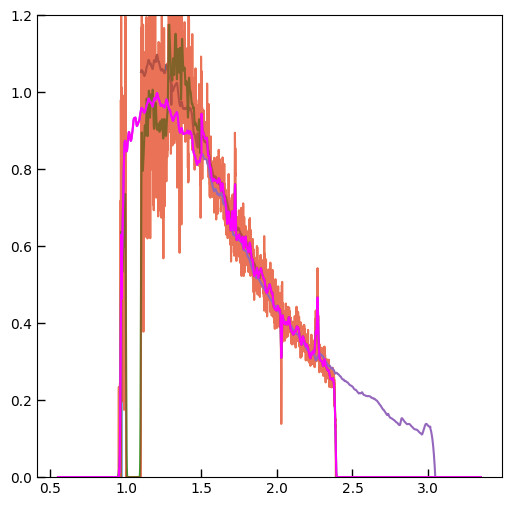

In [5655]:
plt.plot(pri["wave"], xpri["flux"]/pri["flux"])
plt.plot(pri["wave"], xpri["flux"]/model, alpha=0.5)

gr = 'CLEAR_PRISM'
sm = nd.gaussian_filter1d(xpri["flux"]/model, 2)
xlim = 5.08

if 'g395' in pri_file:
    gr = 'F290LP_G395M'
    sm = nd.gaussian_filter1d(xpri["flux"]/model, 5)
    xlim = 5.15
if '100lp' in pri_file:
    gr = 'F100LP_G140M'
    sm = nd.gaussian_filter1d(xpri["flux"]/model, 5)
    xlim = 1.5

plt.plot(pri["wave"], sm)
plt.plot(pri["wave"], xpri["flux"]/model, alpha=0.5)


sens = utils.read_catalog(f'fix_p330e_s1600a1_sensitivity_{gr}.fits')
plt.plot(sens["wavelength"], sens["sensitivity"])

# sm[xpri["wave"] > 5.6] = 0

smi = np.interp(sens["wavelength"], pri["wave"], sm, left=0, right=0)

xfill = sens["wavelength"] > xlim

sens["sensitivity"][xfill] = smi[xfill]
plt.plot(sens["wavelength"], sens["sensitivity"], color='magenta')

# sens.write(f'fix_p330e_s1600a1_sensitivity_{gr}.fits', overwrite=True)

plt.ylim(0, 1.2)
# plt.xlim(2.5, 3.7)
# plt.xlim(4, 5.7)



# (2024-10-30 21:27:36.656)

spectrum.fit_redshift(**{'file': 'suspense-kriek-vx_g140m-f100lp_2110_129133.spec.fits', 'z0': [1.9, 2.9], 'zstep': None, 'nspline': None, 'scale_disp': 1.3, 'vel_width': 100, 'Rline': None, 'is_prism': False, 'use_full_dispersion': False, 'ranges': None, 'sys_err': 0.02, 'kwargs': {}, 'froot': 'suspense-kriek-vx_g140m-f100lp_2110_129133'})



297it [00:07, 42.18it/s]
501it [00:14, 35.34it/s]



# line flux err
# flux x 10^-20 erg/s/cm2
# suspense-kriek-vx_g140m-f100lp_2110_129133.spec.fits
# z = 2.13898
# Wed Oct 30 22:27:58 2024


# line flux err
# flux x 10^-20 erg/s/cm2
# suspense-kriek-vx_g140m-f100lp_2110_129133.spec.fits
# z = 2.13898
# Wed Oct 30 22:27:58 2024
       line NeV-3346       -2.8 ±      7.8 (EW=     -0.4)
      line NeVI-3426       34.1 ±      8.0 (EW=      4.3)
            line OII      187.0 ±      9.9 (EW=     14.4)
            line H12      -64.1 ±      6.5 (EW=     -4.7)
            line H11      -41.9 ±      7.0 (EW=     -2.9)
            line H10      -54.6 ±      7.0 (EW=     -3.6)
             line H9     -126.7 ±      6.3 (EW=     -7.7)
     line NeIII-3867       35.6 ±      8.0 (EW=      2.0)
             line H8     -109.9 ±      6.8 (EW=     -6.0)
     line NeIII-3968     -128.5 ±      7.9 (EW=     -6.1)
             line H7     -175.7 ±      7.8 (EW=     -8.4)
             line Hd     -149.7 ±      7.9 (EW=     -6.1)
             line Hg     

(0.9, 2.9)

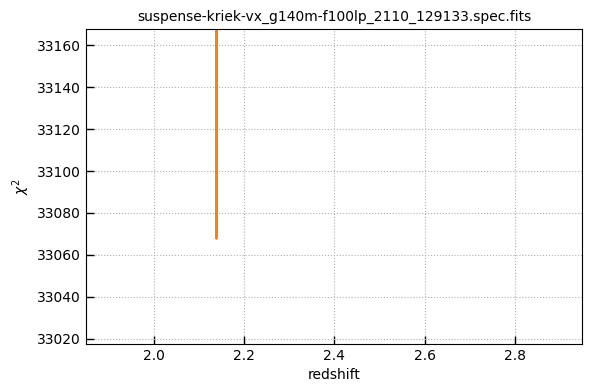

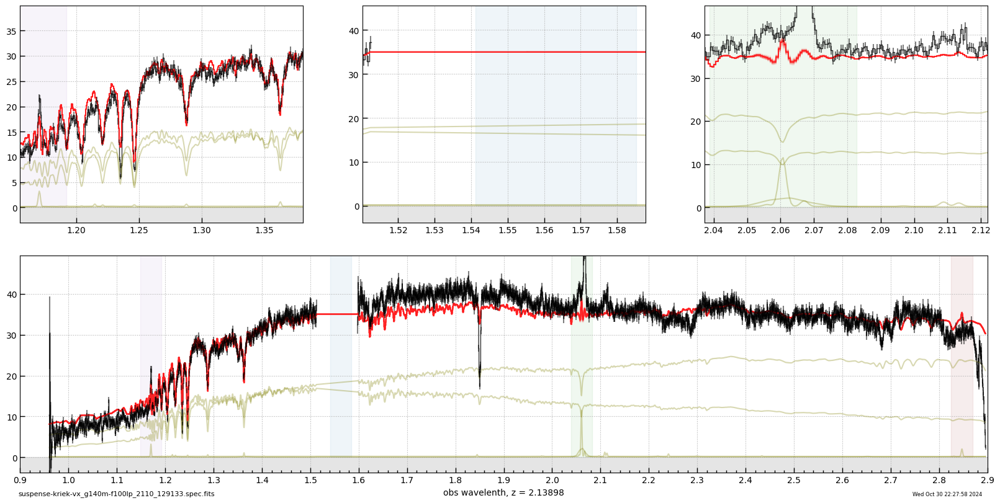

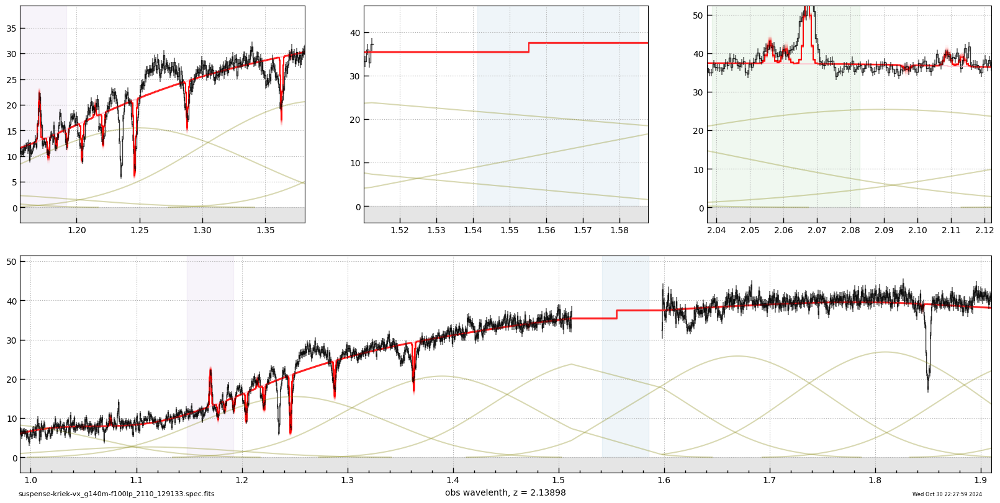

In [4066]:
_ = msaexp.spectrum.fit_redshift(file=new_file,
                             z0 = [1.9, 2.9],
                                 eazy_templates=templ,
                            )

_[0].axes[-1].set_xlim(0.9, 2.9)

# Relative order throughput from JADES object

# (2024-11-05 20:01:30.024)

spectrum.fit_redshift(**{'file': 'jades-gdn2-vy_g140m-f070lp_1181_22847.spec.fits', 'z0': [0.5, 0.7], 'zstep': None, 'nspline': None, 'scale_disp': 1.3, 'vel_width': 100, 'Rline': None, 'is_prism': False, 'use_full_dispersion': False, 'ranges': None, 'sys_err': 0.02, 'kwargs': {}, 'froot': 'jades-gdn2-vy_g140m-f070lp_1181_22847'})



126it [00:02, 58.90it/s]
501it [00:06, 79.75it/s]



# line flux err
# flux x 10^-20 erg/s/cm2
# jades-gdn2-vy_g140m-f070lp_1181_22847.spec.fits
# z = 0.62683
# Tue Nov  5 21:01:38 2024
             line Hb     4074.0 ±    282.0 (EW=    301.6)
      line OIII-4959     9255.2 ±    330.3 (EW=    568.1)
      line OIII-5007    19390.3 ±    470.6 (EW=   1169.3)
       line HeI-5877      436.6 ±     65.8 (EW=     38.2)
        line OI-6302      218.5 ±     58.0 (EW=     21.3)
      line SIII-6314        6.1 ±     45.7 (EW=      0.6)
       line NII-6549       24.8 ±     35.1 (EW=      2.5)
             line Ha     5445.9 ±    130.5 (EW=    553.5)
       line NII-6584      300.6 ±     40.4 (EW=     30.6)
       line HeI-6680      156.7 ±     41.7 (EW=     16.2)
       line SII-6717      355.5 ±     36.6 (EW=     37.1)
       line SII-6731      318.3 ±     36.2 (EW=     33.3)
       line HeI-7065      155.6 ±     32.3 (EW=     17.8)
     line ArIII-7138      333.3 ±     36.0 (EW=     39.0)
       line OII-7323       92.7 ±     30.7 (EW=     11

(0.6, 5.2)

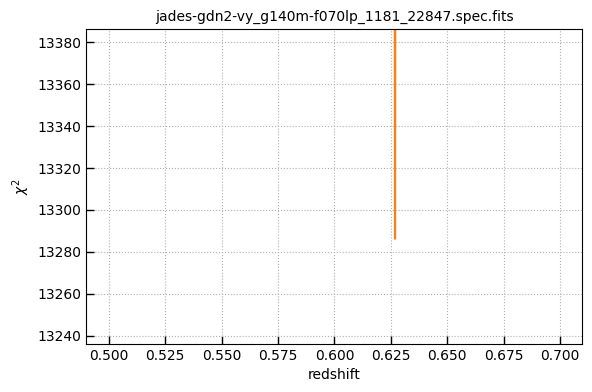

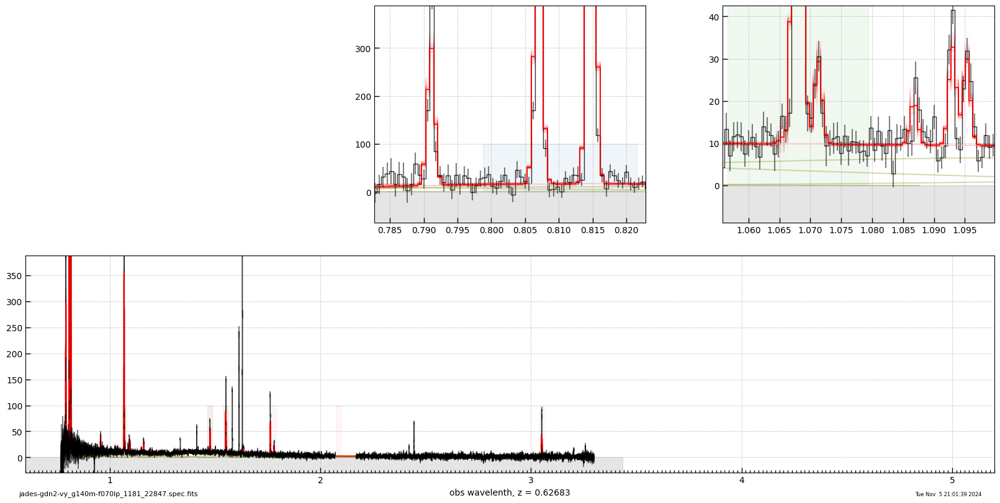

In [447]:
new_file = 'jades-gdn2-vy_g140m-f070lp_1181_22847.spec.fits'
# new_file = 'jades-gdn2-vy_g235m-f170lp_1181_22847.spec.fits'

_ = msaexp.spectrum.fit_redshift(file=new_file,
                             z0 = [0.5, 0.7],
                                 eazy_templates=None,
                            )

_[0].axes[-1].set_xlim(0.6, 5.2)

In [440]:
z = 0.62683

sp = msaexp.spectrum.SpectrumSampler(new_file)

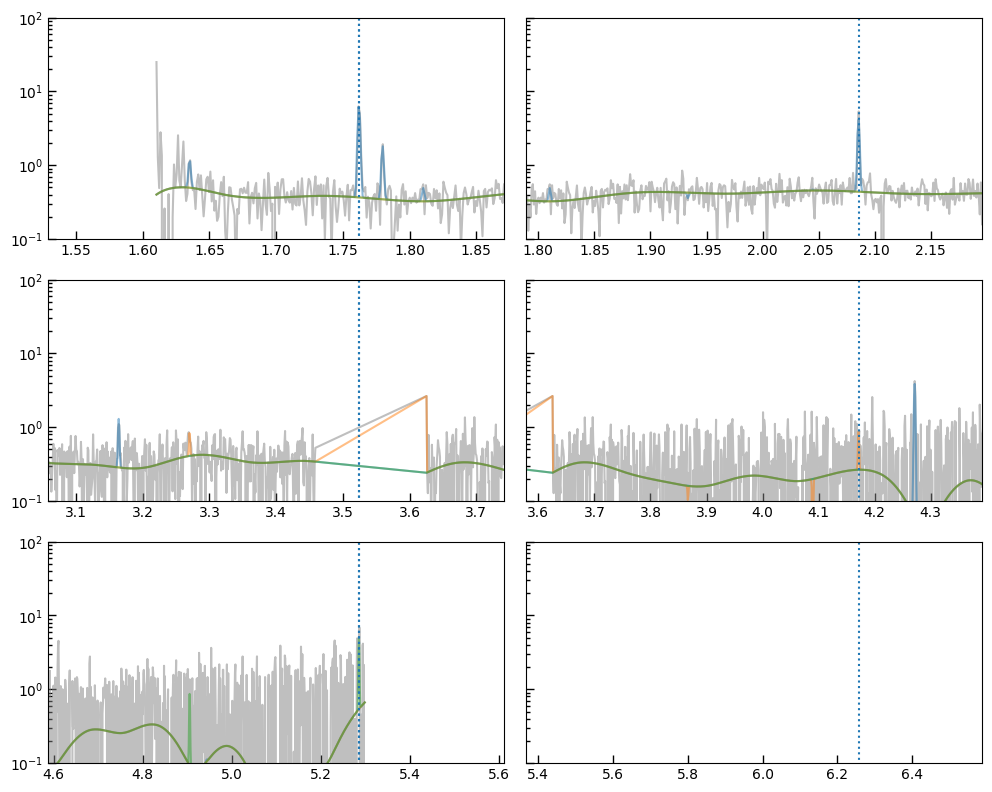

In [446]:
lw, lr = utils.get_line_wavelengths()

fit_result = _[2]
z = fit_result['z']
lines_coeffs = fit_result['coeffs']

line_templates = []
orders = []

scale_disp = 1.4
velocity_sigma = 50

for k in lines_coeffs:
    if not k.startswith('line '):
        continue
    lname = k.split()[1]
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4, line_flux=1., scale_disp=scale_disp, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_1')
        
for k in lines_coeffs:
    if not k.startswith('line '):
        continue
    lname = k.split()[1]
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4*2, line_flux=1., scale_disp=scale_disp*2, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_2')

for k in lines_coeffs:
    if not k.startswith('line '):
        continue
    lname = k.split()[1]
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4*3, line_flux=1., scale_disp=scale_disp*3, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_3')

line_array = np.array(line_templates).T
line_orders = np.array(orders)

has_line = line_array[sp.valid].sum(axis=0) > 0
line_array = line_array[:, has_line]
line_orders = line_orders[has_line]
line_o = np.array([int(l[-1]) for l in line_orders])

df = 51
spl = sp.bspline_array(nspline=df).T

A = np.hstack([spl, line_array])
Ao = np.hstack([np.zeros(df), line_o])

Ax = (A.T / sp['full_err']).T
yx = sp['flux'] / sp['full_err']

c = np.linalg.lstsq(Ax[sp.valid,:], yx[sp.valid], rcond=None)

ix1 = (Ao == 0) | (Ao == 1)
model1 = A[:,ix1].dot(c[0][ix1])
ix2 = (Ao == 0) | (Ao == 2)
model2 = A[:,ix2].dot(c[0][ix2])
ix3 = (Ao == 0) | (Ao == 3)
model3 = A[:,ix3].dot(c[0][ix3])

if 'f070' in new_file:
    oiii = np.array([4700, 5100, *lw['OIII+Hb+Hg+Hd']])*(1+z)/1.e4
    ha = np.array([6200, 6750, *lw['Ha+NII']])*(1+z)/1.e4
    siii = np.array([8800, 10000, *lw['SIII']])*(1+z)/1.e4
    
    lims = [oiii, ha, siii]
elif 'g235' in new_file:
    
    hei = np.array([9400, 1.15e4, *lw['HeI-1083']])*(1+z)/1.e4
    pab = np.array([1.1e4, 1.35e4, *lw['PaB']])*(1+z)/1.e4
    lims = [hei, pab]
    
fig, axes = plt.subplots(3, len(lims),figsize=(5*len(lims),8), sharey=True)
models = [model1, model2, model3]

for i, lim in enumerate(lims):
    for j, _model in enumerate(models): 
        ax = axes[j,i]
        ax.plot(sp['wave'][sp.valid], sp['flux'][sp.valid], alpha=0.5, color='0.5')
        ax.plot(sp['wave'][sp.valid], model1[sp.valid], alpha=0.5)
        ax.plot(sp['wave'][sp.valid], model2[sp.valid], alpha=0.5)
        ax.plot(sp['wave'][sp.valid], model3[sp.valid], alpha=0.5)
        
        ax.set_xlim(*lim[:2]*(j+1))
        ax.vlines(lim[2:]*(j+1), 0.01, 1000, linestyle=':')
        
        ax.semilogy()
        ax.set_ylim(0.1, 100)

    
fig.tight_layout(pad=1)

(0.7483412239958087, 0.8296826613866575)

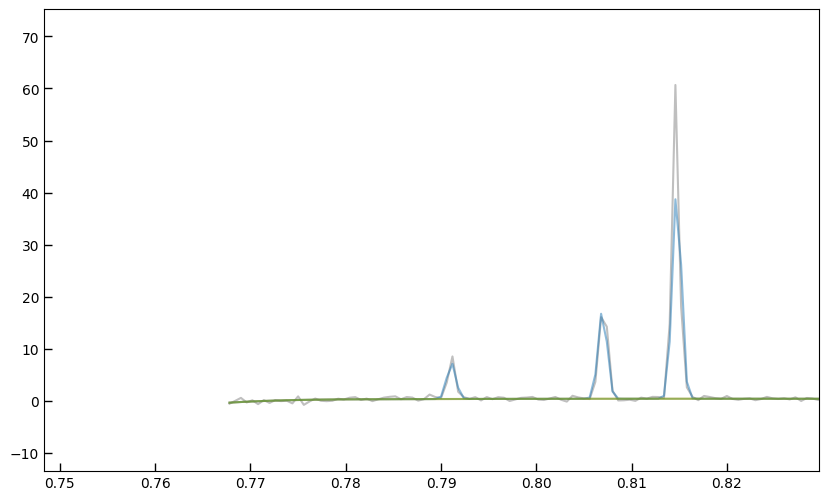

# relative throughput from v4 extractions

In [668]:
lw['NeVI-3426'][0]*(1+tab['z'][0])

12284.598710059721

In [771]:
LINE_NAMES = """
line NeVI-3426
line OII
line NeIII-3867
line NeIII-3968
line He
line Hd
line Hg
             line Hb
      line OIII-4959
      line OIII-5007
       line HeI-5877
        line OI-6302
      line SIII-6314
       line NII-6549
             line Ha
       line NII-6584
       line HeI-6680
       line SII-6717
       line SII-6731
       line HeI-7065
     line ArIII-7138
       line OII-7323
       line OII-7332
     line ArIII-7753
       line HeI-8446
           line Pa10
      line SIII-9068
            line Pa9
      line SIII-9531
            line Pa8
        line CI-9850
            line PaD
       line HeI-1083
            line PaG
     line FeII-11128
      line PII-11886
     line FeII-12570
            line PaB
     line FeII-16440
     line FeII-16877
            line BrF
     line FeII-17418
            line BrE
     line FeII-18362
            line PaA
            line BrD
""".strip().split("\n")

LINE_NAMES = [l.split()[1] for l in LINE_NAMES]


In [772]:
def quick_redshift(sp, z, spl, dz=0.02, nstep=32, scale_disp=1.4, velocity_sigma=50):
    from tqdm import tqdm
    
    zgr = np.linspace(z - dz*(1+z), z + dz*(1+z), nstep)
    loss = zgr*0.
    
    yx = (sp['flux'] / sp['full_err']).data
    
    for i, zi in tqdm(enumerate(zgr)):
        line_templates = []
        for lname in ['Hb','OIII-4959','OIII-5007','Ha','SIII-9068','SIII-9531','SII-6717','SII-6731']:
            templ_i = sp.fast_emission_line(lw[lname][0]*(1+zi)/1.e4, line_flux=1., scale_disp=scale_disp, velocity_sigma=velocity_sigma)
            line_templates.append(templ_i)

        line_array = np.array(line_templates).T
        has_line = line_array[sp.valid].sum(axis=0) > 0
        line_array = line_array[:, has_line]
        A = np.hstack([spl, line_array])
        # print(i, zi, A.shape, sp.valid.sum())
        Ax = (A.T / sp['full_err'].data).T
        
        c = np.linalg.lstsq(Ax[sp.valid,:], yx[sp.valid], rcond=None)
        model = A.dot(c[0])

        loss[i] = (((sp["flux"] - model)/sp["full_err"])[sp.valid]**2).sum()

    zfix = zgr[np.argmin(loss)]

    fx, ax = plt.subplots(1,1,figsize=(8, 5))
    
    ax.plot(zgr, loss)
    ylim = ax.get_ylim()
    ax.vlines(z, *ylim, color='k', linestyle=':')
    ax.vlines(zfix, *ylim, color='r', linestyle=':')
    ax.set_ylim(*ylim)
    ax.grid()
    fx.tight_layout(pad=1)

    return zfix, zgr, loss

In [878]:
def fit_multiple_lines(file, z=None, scale_disp = 1.4, velocity_sigma = 50, skip_existing=False):

    tab_file = os.path.basename(file).replace('.spec.fits','spec.lines.csv')
    if os.path.exists(tab_file) & skip_existing:
        print('skip ', tab_file)
        return utils.read_catalog(tab_file)
        
    sp = msaexp.spectrum.SpectrumSampler(file)
    
    if z is None:
        URL = "https://grizli-cutout.herokuapp.com/nirspec_file_redshift?file={}"
        zquery = utils.read_catalog(URL.format(os.path.basename(file).replace('v4','v3')), format='csv')
    
        z = zquery['z'][0]
        
    print(file, z)
    
    
    lw, lr = utils.get_line_wavelengths()
    
    line_templates = []
    orders = []
    
    
    df = 71
    spl = sp.bspline_array(nspline=df).T
    okspl = spl[sp.valid].sum(axis=0) != 0
    spl = spl[:,okspl]
    df = spl.shape[1]
    
    z, zgr, loss = quick_redshift(sp, z, spl, dz=0.002, nstep=64)
    
    # First order
    for lname in LINE_NAMES:
        if lname in lw:
            templ_i = np.zeros(sp.NSPEC)
            for lwi, lri in zip(lw[lname], lr[lname]):
                templ_i += sp.fast_emission_line(lwi*(1+z)/1.e4, line_flux=lri, scale_disp=scale_disp, velocity_sigma=velocity_sigma)
            line_templates.append(templ_i)
            orders.append(f'{lname}_1')
    
    # Second order
    for lname in LINE_NAMES:
        if lname in lw:
            templ_i = np.zeros(sp.NSPEC)
            for lwi, lri in zip(lw[lname], lr[lname]):
                templ_i += sp.fast_emission_line(lwi*(1+z)/1.e4*2, line_flux=lri, scale_disp=scale_disp*2, velocity_sigma=velocity_sigma)
            line_templates.append(templ_i)
            orders.append(f'{lname}_2')
    
    # Third order
    for lname in LINE_NAMES:
        if lname in lw:
            templ_i = np.zeros(sp.NSPEC)
            for lwi, lri in zip(lw[lname], lr[lname]):
                templ_i += sp.fast_emission_line(lwi*(1+z)/1.e4*3, line_flux=lri, scale_disp=scale_disp*3, velocity_sigma=velocity_sigma)
            line_templates.append(templ_i)
            orders.append(f'{lname}_3')
    
    line_array = np.array(line_templates).T
    line_orders = np.array(orders)
    
    has_line = line_array[sp.valid].sum(axis=0) > 0
    line_array = line_array[:, has_line]
    line_orders = line_orders[has_line]
    line_o = np.array([int(l[-1]) for l in line_orders])
    
    A = np.hstack([spl, line_array])
    Ao = np.hstack([np.zeros(df), line_o])
    
    Ax = (A.T / sp['full_err'].data).T
    yx = (sp['flux'] / sp['full_err']).data
    
    c = np.linalg.lstsq(Ax[sp.valid,:], yx[sp.valid], rcond=None)
    
    ix1 = (Ao == 0) | (Ao == 1)
    model1 = A[:,ix1].dot(c[0][ix1])
    ix2 = (Ao == 0) | (Ao == 2)
    model2 = A[:,ix2].dot(c[0][ix2])
    ix3 = (Ao == 0) | (Ao == 3)
    model3 = A[:,ix3].dot(c[0][ix3])

    all_lims = [
        np.array([1100, 3400, *(lw['Gal-UV-lines'] + lw['OII'] + lw['NeIII-3867'] + lw['NeIII-3968'])])*(1+z)/1.e4,
        np.array([3300, 4400, *(lw['OII'] + lw['NeIII-3867'] + lw['NeIII-3968'])])*(1+z)/1.e4,
        np.array([4700, 5100, *lw['OIII+Hb+Hg+Hd']])*(1+z)/1.e4,
        np.array([6200, 6750, *lw['Ha+NII']])*(1+z)/1.e4,
        np.array([8800, 10000, *lw['SIII']])*(1+z)/1.e4,
        np.array([9400, 1.15e4, *lw['HeI-1083']])*(1+z)/1.e4,
        np.array([1.05e4, 1.35e4, *(lw['HeI-1083'] + lw['PaB'])])*(1+z)/1.e4,
        np.array([1.25e4, 1.9e4, *(lw['PaA'] + lw['PaB'])])*(1+z)/1.e4,
    ]
    
    lims = []
    for lim in all_lims:
        test1 = sp.valid & (sp["wave"] > lim[0]) & (sp["wave"] < lim[1])
        test2 = sp.valid & (sp["wave"] > lim[0]*2) & (sp["wave"] < lim[1]*2)

        test = (test1.sum() > 0) & (test2.sum() > 0)
        if test:
            lims.append(lim)

    if len(lims) == 1:
        lims = lims*2

    if len(lims) > 0:
        f0, ax0 = plt.subplots(1,1,figsize=(8,5))
        
        fig, axes = plt.subplots(3, len(lims),figsize=(5*len(lims),6), sharey=True)
        models = [model1, model2, model3]
        
        for i, lim in enumerate(lims):
            for j, _model in enumerate(models): 
                for ax in [ax0, axes[j,i]]:
                    ax.plot(sp['wave'][sp.valid], sp['flux'][sp.valid], alpha=0.5, color='0.5')
                    ax.plot(sp['wave'][sp.valid], model1[sp.valid], alpha=0.5)
                    ax.plot(sp['wave'][sp.valid], model2[sp.valid], alpha=0.5)
                    ax.plot(sp['wave'][sp.valid], model3[sp.valid], alpha=0.5)
        
                ax.grid()
                
                ax.vlines(lim[2:]*(j+1), 0.01, 1000, linestyle=':')
                
                ax.set_xlim(*lim[:2]*(j+1))
                
                ax.semilogy()
                # ax.set_ylim(0.1, 100)
        
        ymax = np.nanmax(model1[(model1 > 0) & sp.valid])
        
        ax.set_ylim(0.002*ymax, 2*ymax)
        
        ax0.set_ylim(-0.1*ymax, 1.1*ymax)
        ax0.set_xlim(sp['wave'][sp.valid].min(), sp['wave'][sp.valid].max())
        ax0.grid()
        
        f0.tight_layout(pad=1)
        fig.tight_layout(pad=1)
    
    try:
        AxT = Ax[sp.valid,:]
        cov = utils.safe_invert(
             np.dot(AxT.T, AxT)
        )
    
        cerr = np.sqrt(cov.diagonal())
    except:
        cerr = np.ones_like(c[0])*0.20
        
    rows = []
    for i, ln in enumerate(line_orders):
        if not ln.endswith('_1'):
            continue
    
        sn_1 = c[0][df + i] / cerr[df + i]
        if sn_1 < 3:
            continue
            
        row = [os.path.basename(file), sp.meta['GRATING'], sp.meta['FILTER'],
               z, ln.split('_')[0], lw[ln.split('_')[0]][0] * (1+z) / 1.e4, c[0][df + i]*1.e3, cerr[df + i]*1.e3]
        for o in ['_2','_3']:
            lno = ln.replace('_1', o)
            if lno in line_orders:
                j = np.where(line_orders == lno)[0][0]
                row += [c[0][df + j]*1.e3, cerr[df + j]*1.e3]
            else:
                row += [0., 0.]
    
        rows.append(row)
    
    try:
        tab = utils.GTable(names=['file','grating','filter','z', 'line','wave', 'f1','e1','f2','e2','f3','e3'], rows=rows)
    except ValueError:
        return None
        
    for col in ['z','wave','f1','e1','f2','e2','f3','e3']:
        tab[col].format = '.4f'
    
    tab.write(tab_file, overwrite=True)
    return tab


In [928]:
# From db
from grizli.aws import db

v4 = db.SQL("""select root, file, ra, dec, grating, filter from nirspec_extractions where root like '%%v4'""")
un = utils.Unique(v4['root'])

line_table = utils.read_catalog('/usr/local/share/python/ResearchNotebooks/Grizli/JWST/NIRSpec/dja_msaexp_emission_lines_v3.2.csv.gz', format='csv')
uni = db.SQL("""select * from nirspec_unique where z > 0""")

roots = [v.replace('v4','v3') for v in un.values]
roots

   N  value     
====  ==========
 232  cosmos-curti-v4
 690  gds-rieke-v4
 623  jades-gdn-v4
 991  jades-gdn09-v4
1017  jades-gdn10-v4
1023  jades-gdn11-v4
2286  jades-gdn2-v4


['cosmos-curti-v3',
 'gds-rieke-v3',
 'jades-gdn-v3',
 'jades-gdn09-v3',
 'jades-gdn10-v3',
 'jades-gdn11-v3',
 'jades-gdn2-v3']

In [933]:
idx, dr = uni.match_to_catalog_sky(v4)
hasm = (dr.value < 0.2)
line_table['file4'] = [f.replace('v3','v4') for f in line_table['file']]

sn_lim = 7

line_sn = (line_table['line_ha_err'] > 0) & (line_table['line_ha'] > line_table['line_ha_err']*sn_lim)
line_sn |= (line_table['line_oii_err'] > 0) & (line_table['line_oii'] > line_table['line_oii_err']*sn_lim)
line_sn |= (line_table['line_oiii_5007_err'] > 0) & (line_table['line_oiii_5007'] > line_table['line_oiii_5007_err']*sn_lim)
line_sn |= (line_table['line_siii_9068_err'] > 0) & (line_table['line_siii_9068'] > line_table['line_siii_9068_err']*sn_lim)
line_sn |= (line_table['line_siii_9531_err'] > 0) & (line_table['line_siii_9531'] > line_table['line_siii_9531_err']*sn_lim)
line_sn |= (line_table['line_hei_1083_err'] > 0) & (line_table['line_hei_1083'] > line_table['line_hei_1083_err']*sn_lim)
line_sn |= (line_table['line_paa_err'] > 0) & (line_table['line_paa'] > line_table['line_paa_err']*sn_lim)
line_sn |= (line_table['line_pab_err'] > 0) & (line_table['line_pab'] > line_table['line_pab_err']*sn_lim)
line_sn &= line_table['grade'] == 3
line_sn.sum()

keep = (dr.value < 0.2) & np.isin(v4['file'], line_table['file4'][line_sn])
keep &= v4['filter'] != 'CLEAR'

keep &= np.isin(v4['filter'], ['F070LP','F100LP','F170LP','F290LP'][1:2])

# keep &= v4['root'] == 'cosmos-curti-v4'

utils.Unique(v4['filter'][keep])
utils.Unique(v4['root'][keep])

db_files = ['https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row) for row in v4[keep]]
db_z = uni['z_grating'][idx][keep]

i = -1

   N  value     
====  ==========
 147  F100LP    
   N  value     
====  ==========
  54  cosmos-curti-v4
  93  gds-rieke-v4


In [934]:
# i += 1
istart = np.maximum(i-2, 0)

for i in range(istart, len(db_files)):
    print(i)
    plt.close('all')
    tab = fit_multiple_lines(db_files[i], z=db_z[i], velocity_sigma=100, skip_existing=True)
    if tab is None:
        continue
        
    sub = (tab['e2'] > 0) | (tab['e3'] > 0)
    
    print(tab['line','wave','f1','e1','f2','e2','f3','e3'][sub])



0
skip  gds-rieke-v4_g140m-f100lp_1207_113325spec.lines.csv
line wave  f1  e1  f2  e2  f3  e3
---- ---- --- --- --- --- --- ---
1
skip  gds-rieke-v4_g140m-f100lp_1207_113796spec.lines.csv
   line    wave    f1     e1      f2     e2    f3  e3
--------- ------ ------ ------ ------- ------ --- ---
       Hb 1.0192 1.1998 0.2002  -0.032 0.2445 0.0 0.0
OIII-5007 1.0497 0.8382  0.219 -0.1741 0.2547 0.0 0.0
2
skip  gds-rieke-v4_g140m-f100lp_1207_116551spec.lines.csv
line  wave    f1     e1     f2     e2    f3  e3
---- ------ ------ ------ ------ ------ --- ---
 OII 1.3352 0.8211 0.0891 0.0266 0.1136 0.0 0.0
3
skip  gds-rieke-v4_g140m-f100lp_1207_124908spec.lines.csv
line  wave    f1     e1      f2     e2    f3  e3
---- ------ ------ ------ ------- ------ --- ---
 OII 1.0828 2.0959 0.1266  0.2353 0.1304 0.0 0.0
  Hg 1.2614 0.7692 0.1851 -0.0078 0.2334 0.0 0.0
4
skip  gds-rieke-v4_g140m-f100lp_1207_139052spec.lines.csv
   line    wave    f1     e1      f2     e2     f3     e3  
--------- ------

64it [00:00, 394.67it/s]


83
skip  gds-rieke-v4_g140m-f100lp_1207_219204spec.lines.csv
line  wave   f1     e1     f2     e2    f3  e3
---- ----- ------ ------ ------ ------ --- ---
 OII 0.973 1.1179 0.1046 0.1518 0.1556 0.0 0.0
84
skip  gds-rieke-v4_g140m-f100lp_1207_219630spec.lines.csv
line wave  f1  e1  f2  e2  f3  e3
---- ---- --- --- --- --- --- ---
85
skip  gds-rieke-v4_g140m-f100lp_1207_226445spec.lines.csv
   line    wave    f1     e1      f2     e2      f3     e3  
--------- ------ ------ ------ ------- ------ ------- ------
       Hb 0.9963 0.8189 0.2235  0.3208 0.2499  0.2919 0.2457
OIII-5007 1.0261 1.8398 0.2314  0.2698 0.2476 -0.1908 0.2164
       Ha  1.345 5.2346 0.2706  0.1465 0.2287     0.0    0.0
 NII-6584 1.3493 1.0379 0.2235 -0.1242 0.2282     0.0    0.0
 SII-6717 1.3765  1.262 0.2329 -0.1462 0.2363     0.0    0.0
86
skip  gds-rieke-v4_g140m-f100lp_1207_254016spec.lines.csv
   line    wave    f1     e1     f2     e2      f3     e3  
--------- ------ ------ ------ ------ ------ ------- ------


F070LP
F100LP
F170LP
F290LP


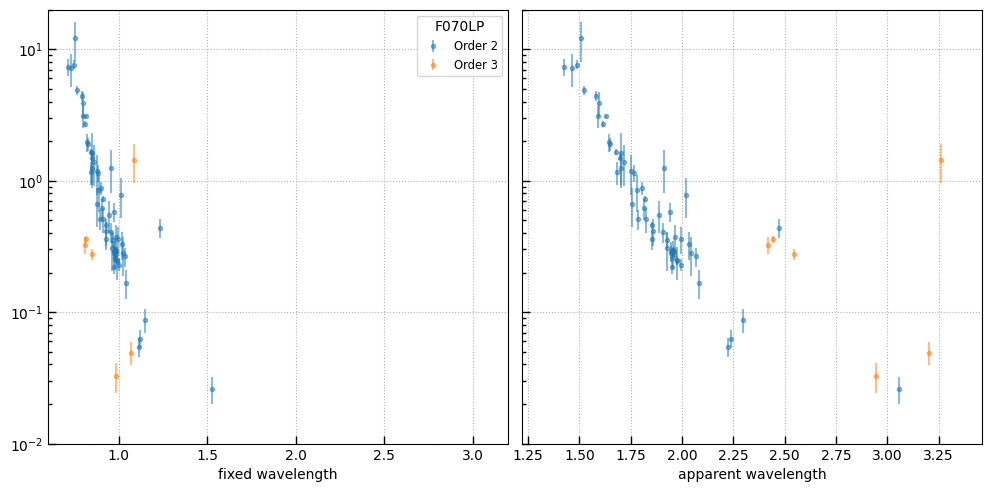

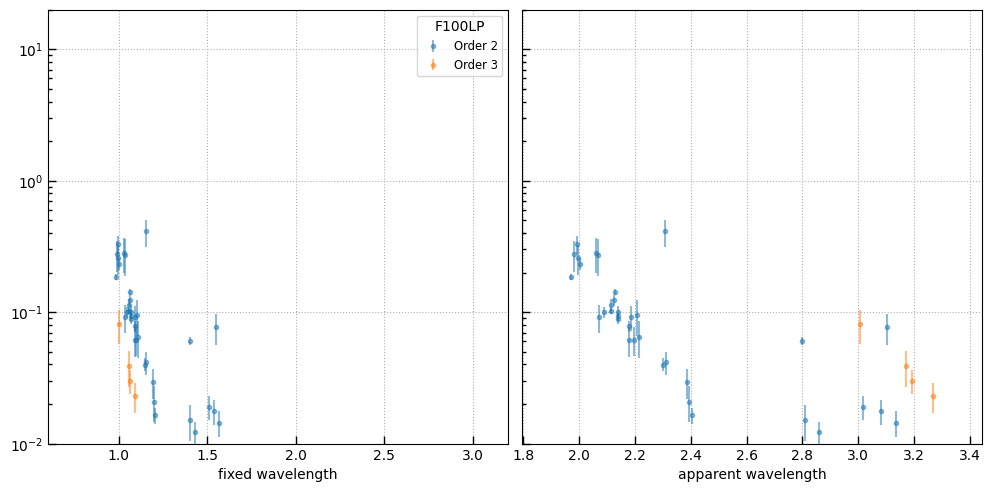

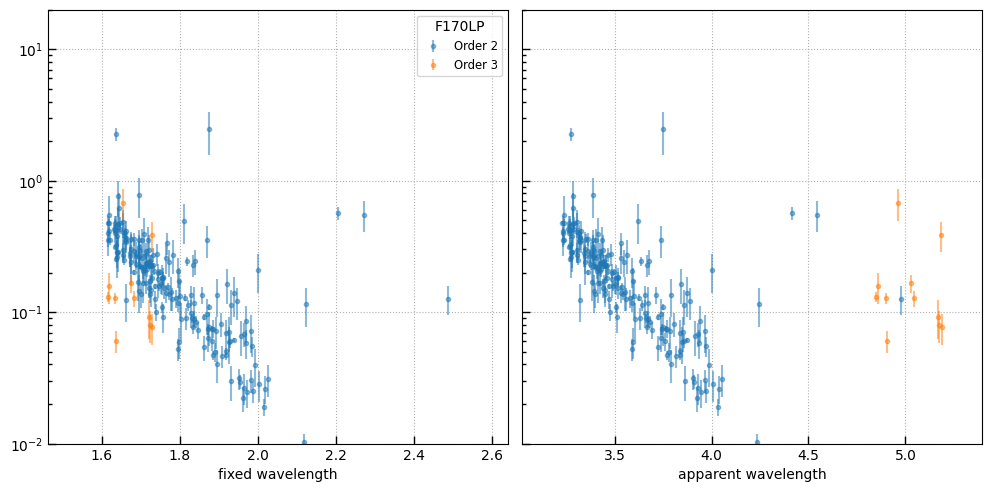

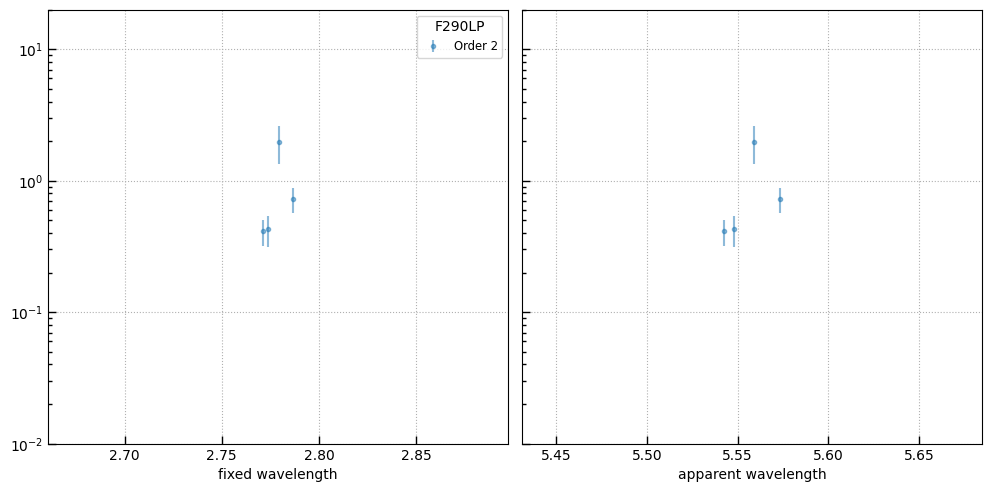

In [936]:
import astropy.table

files = glob.glob('*spec.lines.csv')
files.sort()
tabs = [utils.read_catalog(f) for f in files]
tab = astropy.table.vstack(tabs)

order = 2
filters = ['F070LP','F100LP','F170LP','F290LP']

# filters = np.unique(v4['filter'][keep]).tolist()

for filt in filters:
    print(filt)
    # sel = np.isin(tab['filter'], filters)
    sel = np.isin(tab['filter'], [filt])
    sel &= (tab['e1'] < tab['f1']/3)
    
    if sel.sum() == 0:
        continue

    fig, axes = plt.subplots(1,2,figsize=(10,5), sharey=True)
    
    for order in [2,3]:
        sel = np.isin(tab['filter'], [filt])
        sel &= (tab['e1'] < tab['f1']/3)
        sel &= (tab['e1'] < tab['f1']/2) & (tab[f'e{order}'] > 0)
    
        if 1:
            sel &= (tab[f'e{order}'] < tab[f'f{order}']/3) & (tab[f'e{order}'] > 0)
        
        if sel.sum() == 0:
            continue
            
        lratio = tab[f'f{order}'] / tab['f1']
        eratio = np.abs(lratio) * np.sqrt((tab['e1']/tab['f1'])**2 + (tab[f'e{order}'] / tab[f'f{order}'])**2)
    
        axes[0].errorbar(tab['wave'][sel], lratio[sel], eratio[sel], marker='.', linestyle='None', alpha=0.5, label=f'Order {order}')
        axes[1].errorbar(tab['wave'][sel]*order, lratio[sel], eratio[sel], marker='.', linestyle='None', alpha=0.5)
        
        axes[0].hlines(0, tab['wave'][sel].min()-0.1, tab['wave'][sel].max()+0.1, color='k', alpha=0.5, linestyle=':')
        axes[1].hlines(0, tab['wave'][sel].min()*order-0.1, tab['wave'][sel].max()*order+0.1, color='k', alpha=0.5, linestyle=':')
        
    for ax in axes:
        ax.set_ylim(-0.4, 20.0)
        ax.set_ylim(0.01, 20); ax.semilogy()
        
        ax.grid()
    
    axes[0].set_xlabel('fixed wavelength')
    # axes[0].set_xlim(0.6, 5.3)

    if filt in ['F070LP','F100LP']:
        axes[0].set_xlim(0.6, 3.2)
        
    axes[1].set_xlabel('apparent wavelength')
    
    leg = axes[0].legend()
    leg.set_title(filt)
    
    # leg.set_title(' '.join(filters))
    
    fig.tight_layout(pad=1)


In [833]:
print(break)

SyntaxError: invalid syntax (1126903501.py, line 1)

In [796]:
files = """
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_195549.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_199799.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_205123.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_207227.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_199799.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_205818.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_196290.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_203417.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_210730.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_195280.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_217321.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_194061.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_207739.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_205123.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_748.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_1631.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_2257.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_2952.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4327.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_552.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_2366.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4496.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g140m-f070lp_1181_34491.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g140m-f070lp_1181_64818.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g140m-f070lp_1181_30206.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g140m-f070lp_1181_29875.spec.fits
""".strip().split()

file = files[-1]


https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g140m-f070lp_1181_29875.spec.fits jades-gdn2-v3_g140m-f070lp_1181_29875.spec.fits 1.7906440666666665


64it [00:02, 23.18it/s]


          line      wave         f1        e1        f2        e2   f3   e3
0          OII  1.040132   3.901595  0.134651  0.650638  0.160828  0.0  0.0
1   NeIII-3867  1.079977   1.353693  0.188719 -0.059793  0.225190  0.0  0.0
2           Hg  1.211661   1.913645  0.235391 -0.343809  0.232649  0.0  0.0
3           Hb  1.357060   6.622462  0.327868  0.000000  0.000000  0.0  0.0
4    OIII-4959  1.384286   8.258654  0.402742  0.000000  0.000000  0.0  0.0
5    OIII-5007  1.397666  23.159787  0.512023  0.000000  0.000000  0.0  0.0
6     HeI-5877  1.640183   1.175130  0.254022  0.000000  0.000000  0.0  0.0
7     NII-6549  1.827891   1.707068  0.273659  0.000000  0.000000  0.0  0.0
8           Ha  1.832031  30.577317  0.610615  0.000000  0.000000  0.0  0.0
9     NII-6584  1.837773   5.329238  0.339331  0.000000  0.000000  0.0  0.0
10    SII-6717  1.874895   2.908232  0.288563  0.000000  0.000000  0.0  0.0
11    SII-6731  1.878908   2.595122  0.287194  0.000000  0.000000  0.0  0.0


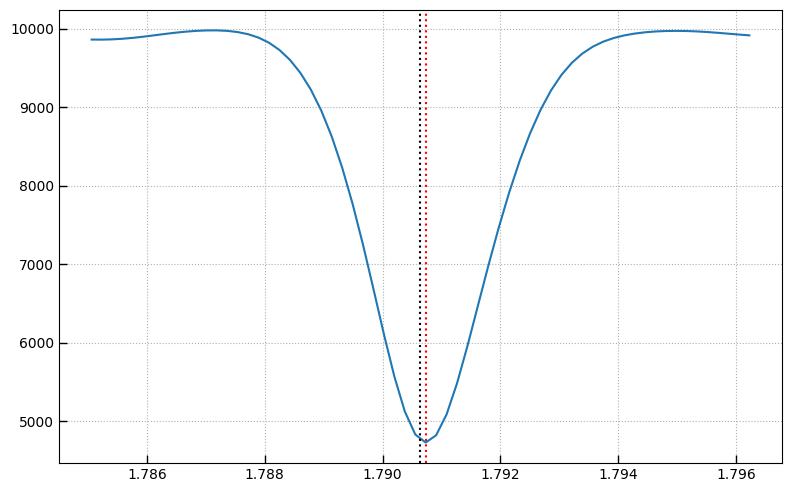

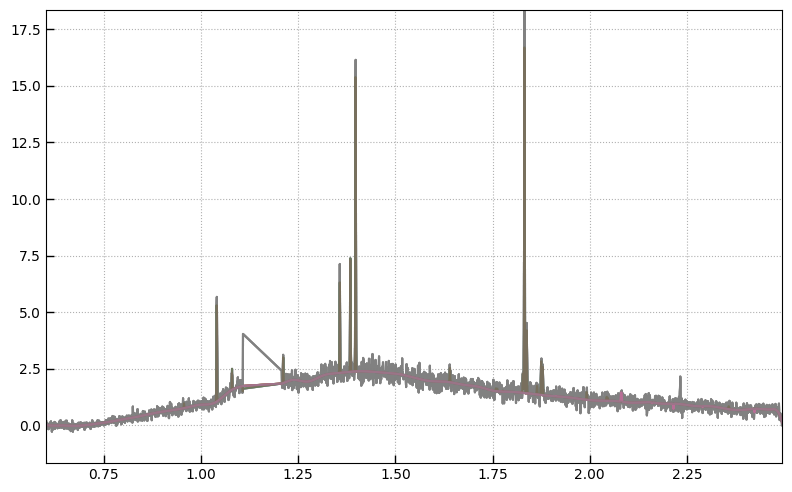

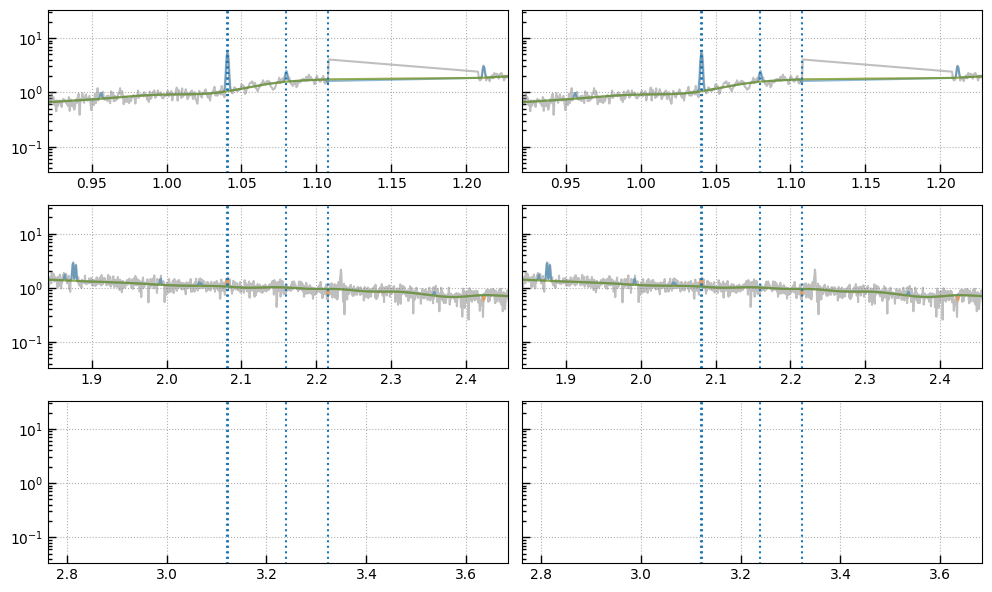

In [797]:
tab = fit_multiple_lines(file, velocity_sigma=100)
print(tab['line','wave','f1','e1','f2','e2','f3','e3'].to_pandas())


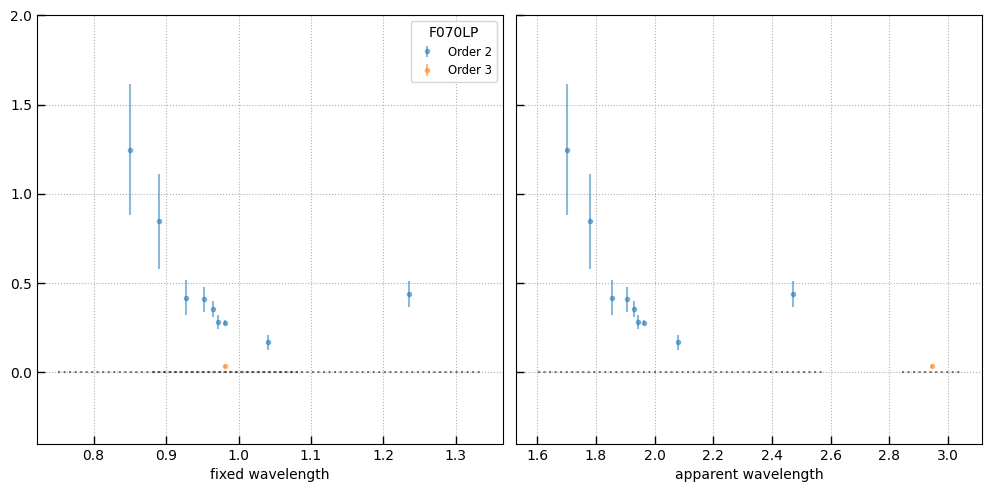

In [832]:
import astropy.table

files = glob.glob('*spec.lines.csv')
files.sort()
tabs = [utils.read_catalog(f) for f in files]
tab = astropy.table.vstack(tabs)

order = 2
filters = ['F070LP','F100LP','F170LP','F290LP'][0:1]

fig, axes = plt.subplots(1,2,figsize=(10,5), sharey=True)

for order in [2,3]:
    sel = (tab['e1'] < tab['f1']/3) & (tab[f'e{order}'] > 0)

    if 1:
        sel &= (tab[f'e{order}'] < tab[f'f{order}']/3) & (tab[f'e{order}'] > 0)
    
    sel &= np.isin(tab['filter'], filters)
    
    if sel.sum() == 0:
        continue
        
    lratio = tab[f'f{order}'] / tab['f1']
    eratio = np.abs(lratio) * np.sqrt((tab['e1']/tab['f1'])**2 + (tab[f'e{order}'] / tab[f'f{order}'])**2)

    axes[0].errorbar(tab['wave'][sel], lratio[sel], eratio[sel], marker='.', linestyle='None', alpha=0.5, label=f'Order {order}')
    axes[1].errorbar(tab['wave'][sel]*order, lratio[sel], eratio[sel], marker='.', linestyle='None', alpha=0.5)
    
    axes[0].hlines(0, tab['wave'][sel].min()-0.1, tab['wave'][sel].max()+0.1, color='k', alpha=0.5, linestyle=':')
    axes[1].hlines(0, tab['wave'][sel].min()*order-0.1, tab['wave'][sel].max()*order+0.1, color='k', alpha=0.5, linestyle=':')
    
for ax in axes:
    ax.set_ylim(-0.4, 2.0)
    ax.grid()

axes[0].set_xlabel('fixed wavelength')
axes[1].set_xlabel('apparent wavelength')

leg = axes[0].legend()
leg.set_title(' '.join(filters))

fig.tight_layout(pad=1)


In [786]:
sp = msaexp.spectrum.SpectrumSampler(file)

URL = "https://grizli-cutout.herokuapp.com/nirspec_file_redshift?file={}"
zquery = utils.read_catalog(URL.format(os.path.basename(file).replace('v4','v3')), format='csv')

z = zquery['z'][0]
print(file, zquery['file'][0], z)

https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4496.spec.fits cosmos-curti-v3_g140m-f100lp_1879_4496.spec.fits 2.488073343341421


64it [00:00, 131.08it/s]


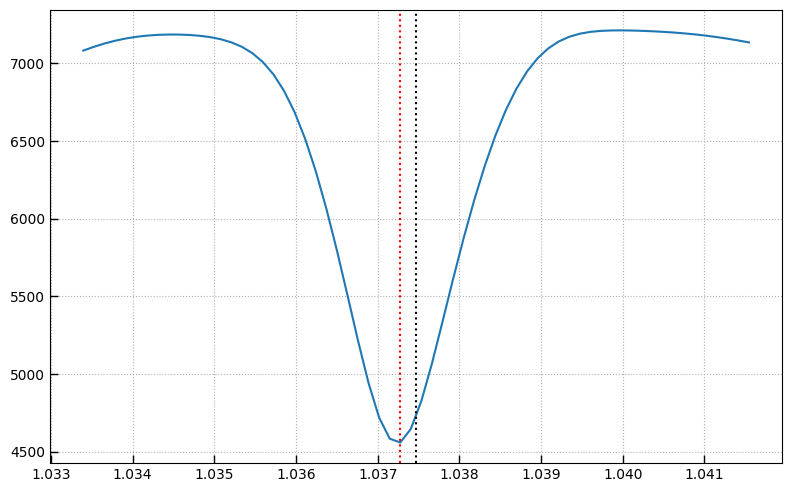

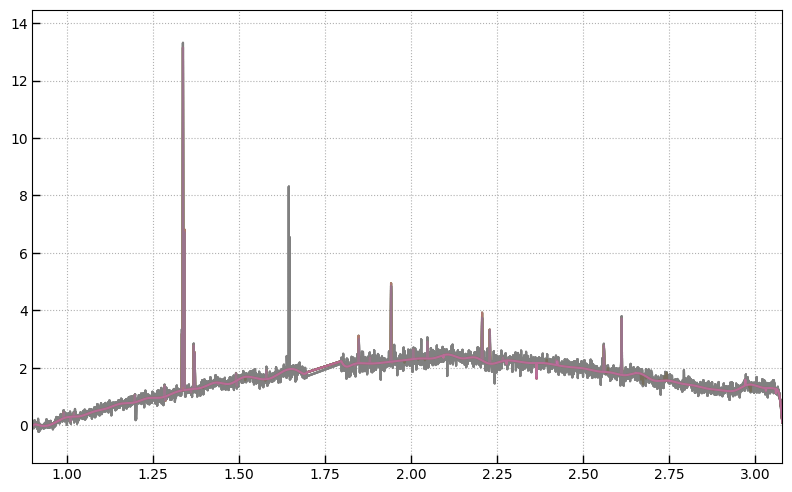

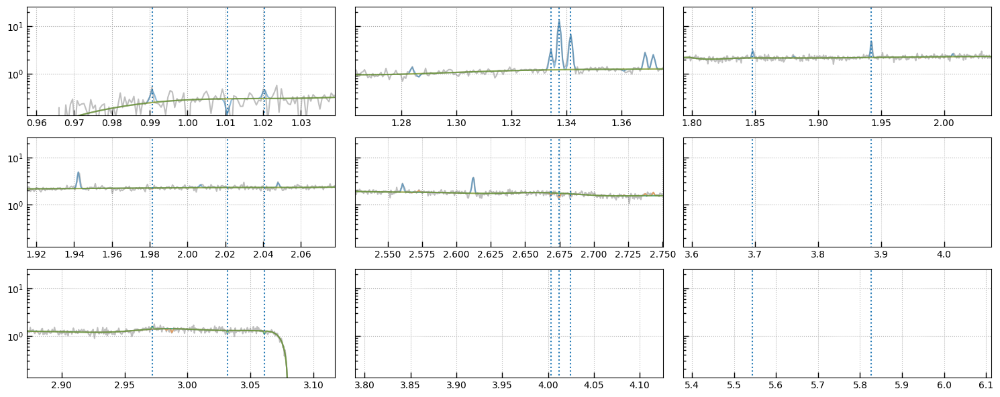

In [749]:
lw, lr = utils.get_line_wavelengths()

line_templates = []
orders = []

scale_disp = 1.4
velocity_sigma = 50

df = 71
spl = sp.bspline_array(nspline=df).T
okspl = spl[sp.valid].sum(axis=0) != 0
spl = spl[:,okspl]
df = spl.shape[1]

z, zgr, loss = quick_redshift(sp, z, spl, dz=0.002, nstep=64)

# First order
for lname in LINE_NAMES:
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4, line_flux=1., scale_disp=scale_disp, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_1')

# Second order
for lname in LINE_NAMES:
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4*2, line_flux=1., scale_disp=scale_disp*2, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_2')

# Third order
for lname in LINE_NAMES:
    if lname in lw:
        templ_i = sp.fast_emission_line(lw[lname][0]*(1+z)/1.e4*3, line_flux=1., scale_disp=scale_disp*3, velocity_sigma=velocity_sigma)
        line_templates.append(templ_i)
        orders.append(f'{lname}_3')

line_array = np.array(line_templates).T
line_orders = np.array(orders)

has_line = line_array[sp.valid].sum(axis=0) > 0
line_array = line_array[:, has_line]
line_orders = line_orders[has_line]
line_o = np.array([int(l[-1]) for l in line_orders])

A = np.hstack([spl, line_array])
Ao = np.hstack([np.zeros(df), line_o])

Ax = (A.T / sp['full_err'].data).T
yx = (sp['flux'] / sp['full_err']).data

c = np.linalg.lstsq(Ax[sp.valid,:], yx[sp.valid], rcond=None)

ix1 = (Ao == 0) | (Ao == 1)
model1 = A[:,ix1].dot(c[0][ix1])
ix2 = (Ao == 0) | (Ao == 2)
model2 = A[:,ix2].dot(c[0][ix2])
ix3 = (Ao == 0) | (Ao == 3)
model3 = A[:,ix3].dot(c[0][ix3])

if 'f070' in new_file:
    oiii = np.array([4700, 5100, *lw['OIII+Hb+Hg+Hd']])*(1+z)/1.e4
    ha = np.array([6200, 6750, *lw['Ha+NII']])*(1+z)/1.e4
    siii = np.array([8800, 10000, *lw['SIII']])*(1+z)/1.e4
    
    lims = [oiii, ha, siii]
elif 'g235' in new_file:
    
    hei = np.array([9400, 1.15e4, *lw['HeI-1083']])*(1+z)/1.e4
    pab = np.array([1.1e4, 1.35e4, *lw['PaB']])*(1+z)/1.e4
    lims = [hei, pab]

f0, ax0 = plt.subplots(1,1,figsize=(8,5))

fig, axes = plt.subplots(3, len(lims),figsize=(5*len(lims),6), sharey=True)
models = [model1, model2, model3]

for i, lim in enumerate(lims):
    for j, _model in enumerate(models): 
        for ax in [ax0, axes[j,i]]:
            ax.plot(sp['wave'][sp.valid], sp['flux'][sp.valid], alpha=0.5, color='0.5')
            ax.plot(sp['wave'][sp.valid], model1[sp.valid], alpha=0.5)
            ax.plot(sp['wave'][sp.valid], model2[sp.valid], alpha=0.5)
            ax.plot(sp['wave'][sp.valid], model3[sp.valid], alpha=0.5)

        ax.grid()
        
        ax.vlines(lim[2:]*(j+1), 0.01, 1000, linestyle=':')
        
        ax.set_xlim(*lim[:2]*(j+1))
        
        ax.semilogy()
        # ax.set_ylim(0.1, 100)

ymax = np.nanmax(model1[(model1 > 0) & sp.valid])

ax.set_ylim(0.01*ymax, 2*ymax)

ax0.set_ylim(-0.1*ymax, 1.1*ymax)
ax0.set_xlim(sp['wave'][sp.valid].min(), sp['wave'][sp.valid].max())
ax0.grid()

f0.tight_layout(pad=1)
fig.tight_layout(pad=1)

In [603]:
try:
    AxT = Ax[sp.valid,:]
    cov = utils.safe_invert(
         np.dot(AxT.T, AxT)
    )

    cerr = np.sqrt(cov.diagonal())
except:
    cerr = np.ones_like(c[0])*0.20
    
rows = []
for i, ln in enumerate(line_orders):
    if not ln.endswith('_1'):
        continue

    sn_1 = c[0][df + i] / cerr[df + i]
    if sn_1 < 3:
        continue
        
    row = [os.path.basename(file), sp.meta['GRATING'], sp.meta['FILTER'],
           z, ln.split('_')[0], lw[ln.split('_')[0]][0] * (1+z) / 1.e4, c[0][df + i]*1.e3, cerr[df + i]*1.e3]
    for o in ['_2','_3']:
        lno = ln.replace('_1', o)
        if lno in line_orders:
            j = np.where(line_orders == lno)[0][0]
            row += [c[0][df + j]*1.e3, cerr[df + j]*1.e3]
        else:
            row += [0., 0.]

    rows.append(row)

tab = utils.GTable(names=['file','grating','filter','z', 'line','wave', 'f1','e1','f2','e2','f3','e3'], rows=rows)
for col in ['z','wave','f1','e1','f2','e2','f3','e3']:
    tab[col].format = '.4f'

tab.write(os.path.basename(file).replace('.spec.fits','spec.lines.csv'), overwrite=True)
tab

file,grating,filter,z,line,wave,f1,e1,f2,e2,f3,e3
str47,str5,str6,float64,str10,float64,float64,float64,float64,float64,float64,float64
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,OI-6302,1.8743,0.9083,0.2246,0.0780,0.1665,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,NII-6549,1.9480,1.3887,0.2202,0.0549,0.1660,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,Ha,1.9524,31.6847,0.5641,0.9952,0.1812,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,NII-6584,1.9585,5.5037,0.2962,0.1698,0.1538,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,SII-6717,1.9981,2.9031,0.2520,-0.0319,0.1700,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,SII-6731,2.0024,2.8526,0.2526,0.2815,0.1714,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,ArIII-7138,2.1229,0.8998,0.2390,0.0000,0.0000,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,SIII-9068,2.6979,2.6973,0.2293,0.0000,0.0000,0.0000,0.0000
gds-rieke-v4_g235m-f170lp_1207_194121.spec.fits,G235M,F170LP,1.9741,SIII-9531,2.8353,7.1097,0.2808,0.0000,0.0000,0.0000,0.0000


# Check new sensitivity curves

In [1049]:
v4 = db.SQL("""select root, srcid, file, ra, dec, grating, filter from nirspec_extractions where root like '%%v4'""")

In [1413]:
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g395m-f290lp_1181_28074.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g395m-f290lp_1181_25480.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn2-v4/jades-gdn2-v4_g235m-f170lp_1181_29875.spec.fits'
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_217321.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_201306.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_209962.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_205964.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g235m-f170lp_1207_212434.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_3942.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_1967.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn-v4/jades-gdn-v4_prism-clear_1181_68797.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn-v4/jades-gdn-v4_g235m-f170lp_1181_68490.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn-v4/jades-gdn-v4_prism-clear_1181_78013.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn-v4/jades-gdn-v4_prism-clear_1181_76320.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn09-v4/jades-gdn09-v4_g140m-f070lp_1181_76477.spec.fits'

# red star
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/gds-rieke-v4/gds-rieke-v4_g140m-f100lp_1207_197052.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4502.spec.fits'
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_3111.spec.fits'
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4350.spec.fits'
file =  'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4327.spec.fits'
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_bkg77.spec.fits'
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/cosmos-curti-v4/cosmos-curti-v4_g140m-f100lp_1879_4279.spec.fits'
file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_g140m-f070lp_1181_82948.spec.fits'

# Red source to use for throughput constraint because it will have little order contam
# file = 'https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_prism-clear_1181_27839.spec.fits'


https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_g140m-f070lp_1181_82948.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_g235m-f170lp_1181_82948.spec.fits
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_g395m-f290lp_1181_82948.spec.fits
correct_to_crds
https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_prism-clear_1181_82948.spec.fits
correct_to_crds


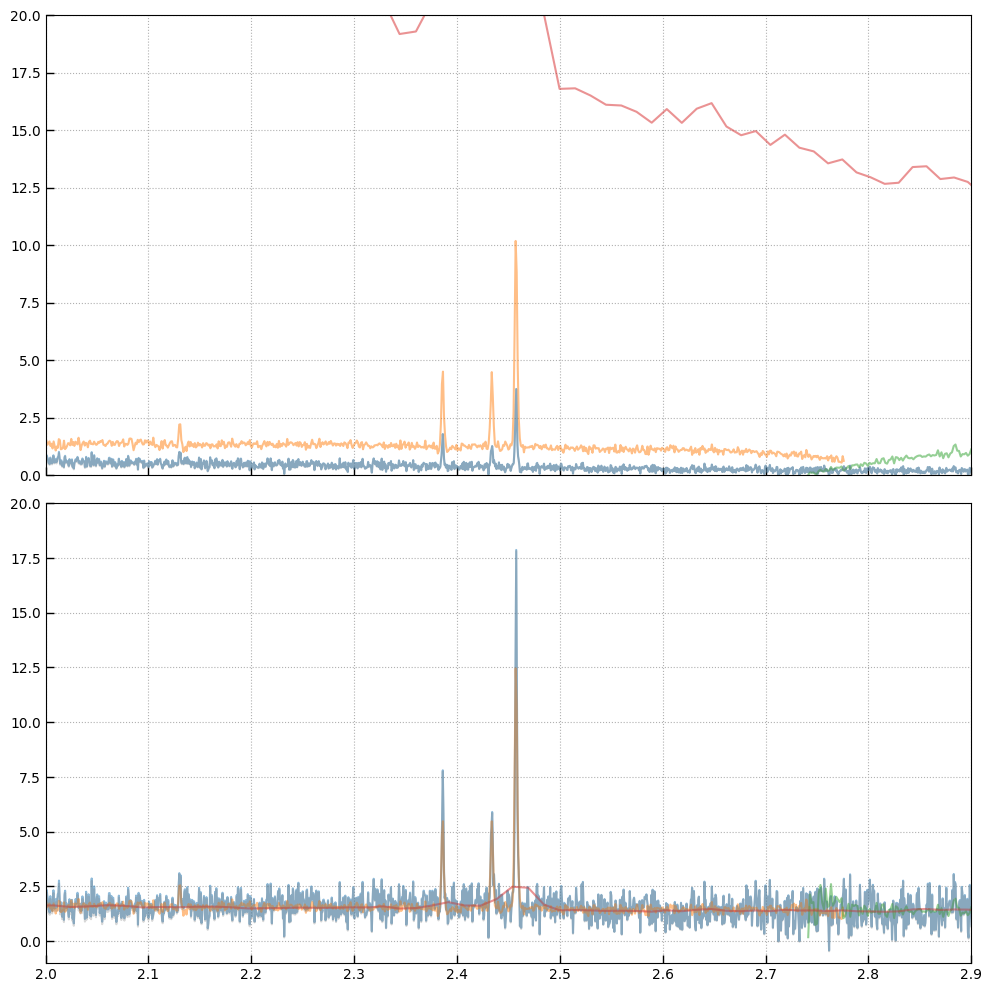

In [1423]:
root = file.split('/')[-2]
srcid = int(file.split('_')[-1].split('.')[0])

rows = (v4['root'] == root) & (v4['srcid'] == srcid)

sens_path = '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/tyc4433_s200a1_sensitivity_{FILTER}_{GRATING}.fits'

# sens_path = '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/tyc4433_s1600a1_sensitivity_{FILTER}_{GRATING}.fits'

fig, axes = plt.subplots(2,1,figsize=(10,10), sharex=True)

if 0:
    for row in v4[rows]:
        sp = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row).replace('v4','v3'))
        axes[1].plot(sp['wave'], sp['flux'] / sp['path_corr']**0, alpha=0.5, color='purple')

for row in v4[rows]:
    sp = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row))
    print(sp.file)

    sens = utils.read_catalog(sens_path.format(**sp.meta))

    if 'correct_to_crds' in sens.colnames:
        print('correct_to_crds')
        sens['sensitivity'] *= sens['correct_to_crds']
        sens['sensitivity'][~np.isfinite(sens['sensitivity'])] = 0
        
    si = np.interp(sp['wave'], sens['wavelength'], sens['sensitivity'])

    ok = (sp.valid) & (si > np.nanmax(sens['sensitivity'])*0.05)
    sp['flux'][~ok] = np.nan
    
    axes[0].plot(sp['wave'], sp['flux'], alpha=0.5)

    axes[1].plot(sp['wave'], sp['flux'] / sp['path_corr'] /si, alpha=0.5)

    if sp.meta['GRATING'] == 'PRISM':
        prism = sp

if 1:
    for row in v4[rows]:
        if row['grating'] in ['PRISM','G395M']:
            continue
            
        sp = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row))
        sens = utils.read_catalog(sens_path.format(**sp.meta))
        if 'sensitivity_2' in sens.colnames:
            if 'correct_to_crds' in sens.colnames:
                # print('correct_to_crds')
                sens['sensitivity'] *= sens['correct_to_crds']
                sens['sensitivity'][~np.isfinite(sens['sensitivity'])] = 0

            extra = np.interp(sp['wave'], sp['wave']*2, sp['flux'] * sens['sensitivity_2'] / sens['sensitivity'])
            axes[0].plot(sp['wave'], sp['flux'] - extra, color='0.5', alpha=0.3)
            axes[1].plot(sp['wave'], (sp['flux'] - extra) / sens['sensitivity'], color='0.5', alpha=0.3)
            axes[0].set_ylim(0, 20)
if 0:
    # Do it again and show contam
    for row in v4[rows]:
        sp = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row))
        print(sp.file)
    
        sens = utils.read_catalog(sens_path.format(**sp.meta))
    
        pwi = np.interp(sens['wavelength'], prism['wave'], prism['flux'])
        s1 = np.interp(sens['wavelength']*2, sens['wavelength'], sens['sensitivity'], left=np.nan, right=np.nan)
        
        if 'sensitivity_2' in sens.colnames:
            print(sens_path.format(**sp.meta))
            axes[1].plot(sens['wavelength']*2, sens['sensitivity_2']**-1 * pwi * s1**1, alpha=0.5, color='magenta')
    
for ax in axes:
    #ax.semilogy()
    ax.grid()

# axes[1].set_ylim(0.1, 100)

# plt.xlim(1.1, 1.3)

# axes[1].semilogy()


# plt.xlim(2, 2.3)
plt.ylim(-1, 5)

plt.xlim(2, 2.9); plt.ylim(-1, 20)

fig.tight_layout(pad=1)

In [1418]:
1.82e4/3727.*2799

13668.312315535284

# Redo combination

In [1374]:
! aws s3 sync s3://msaexp-nirspec/extractions/slitlets/{root}/ ./ --exclude "*" --include "*_{srcid}.fits"
! aws s3 sync s3://msaexp-nirspec/extractions/slitlets/{root.replace('v4','v3')}/ ./ --exclude "*" --include "*_{srcid}.fits"

download: s3://msaexp-nirspec/extractions/slitlets/cosmos-curti-v4/jw01879007001_03101_00002_nrs1_f100lp_g140m_raw.123.1879_4502.fits to ./jw01879007001_03101_00002_nrs1_f100lp_g140m_raw.123.1879_4502.fits
download: s3://msaexp-nirspec/extractions/slitlets/cosmos-curti-v4/jw01879007001_03101_00003_nrs1_f100lp_g140m_raw.123.1879_4502.fits to ./jw01879007001_03101_00003_nrs1_f100lp_g140m_raw.123.1879_4502.fits
download: s3://msaexp-nirspec/extractions/slitlets/cosmos-curti-v4/jw01879007001_03101_00001_nrs1_f100lp_g140m_raw.123.1879_4502.fits to ./jw01879007001_03101_00001_nrs1_f100lp_g140m_raw.123.1879_4502.fits
download: s3://msaexp-nirspec/extractions/slitlets/cosmos-curti-v4/jw01879007001_05101_00001_nrs2_f100lp_g140m_raw.123.1879_4502.fits to ./jw01879007001_05101_00001_nrs2_f100lp_g140m_raw.123.1879_4502.fits
download: s3://msaexp-nirspec/extractions/slitlets/cosmos-curti-v4/jw01879007001_05101_00003_nrs2_f100lp_g140m_raw.123.1879_4502.fits to ./jw01879007001_05101_00003_nrs2_f100lp

In [1375]:
prog_str = file.split('_')[-2]

key = f'{prog_str}_{srcid}'

# key = 'background_123'

outroot = root.replace('v4','vx')

targets = [key]

FORCE_DIFFS = True

utils.LOGFILE = 'extract.log'

print(key, outroot)
pfiles = glob.glob(f'*_phot*{key}.fits')
pfiles.sort()

rfiles = glob.glob(f'*nrs?_*_raw*{key}.fits')
rfiles.sort()

if 0:
    outroot = spe.file.split('/')[-2].replace('v3','vo')
    pfiles = glob.glob(f'*nrs?_*_xphot*{key}.fits')
    pfiles.sort()

print('phot files: ', len(pfiles))
print('raw files: ', len(rfiles))

pfiles + ['\n'] + rfiles

1879_4502 cosmos-curti-vx
phot files:  62
raw files:  102


['jw01879007001_03101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_03101_00002_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_03101_00003_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_05101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_05101_00002_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_05101_00003_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_07101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_07101_00002_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_07101_00003_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_09101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_09101_00002_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_09101_00003_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_11101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_11101_00002_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_11101_00003_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_13101_00001_nrs1_phot.123.1879_4502.fits',
 'jw01879007001_13101_00002_nrs1_phot.123.1879_4502.fits

In [1376]:
if outroot in ['gds-udeep-lr-v1','xxgds-deep-lr-v1','gds-deep-xmr-v1','bluejay-north-v1','xbluejay-north-alt-v1']:
    join = [0,3,5]
    # join = [0,1,3,5]
    join = [3,5]
elif 'gds-udeep' in outroot:
    join = [0,3,5]
elif 'gds-deep' in outroot:
    join = [0,1,3,5]
elif 'uncover' in outroot:
    join = [0,3,5]
elif 'egami' in outroot:
    join = [3,5]
elif 'macsj0647-hr' in outroot:
    join = [3,5]
    # join = [0,3]
elif 'glazebrook-v' in outroot:
    join = [0,3]
elif 'suspense-kriek-v' in outroot:
    join = [3, 5, 7]
elif 'cecilia' in outroot:
    join = [0,1,3]
else:
    join = [0,3,5]

outroot, join 
# join += [-1]

if (1):
    GRATING_LIMITS = {
        "prism": [0.54, 5.63, 0.01],
        "g140m": [0.55, 3.35, 0.00063],
        "g235m": [1.58, 5.3, 0.00106],
        "g395m": [2.68, 5.6, 0.00179],
        "g140h": [0.68, 1.9, 0.000238],
        "g235h": [1.66, 3.17, 0.000396],
        "g395h": [2.83, 5.24, 0.000666],
    }
elif (1):
    GRATING_LIMITS = {
        "prism": [0.54, 5.63, 0.01],
        "g140m": [0.5, 5.65, 0.00063],
        "g235m": [0.5, 5.65, 0.00106],
        "g395m": [0.5, 5.65, 0.00179],
        "g140h": [0.68, 1.9, 0.000238],
        "g235h": [1.66, 3.17, 0.000396],
        "g395h": [2.83, 5.24, 0.000666],
    }

else:
    GRATING_LIMITS = msaexp.utils.GRATING_LIMITS

# DRIZZLE_KWS = dict(
#     step=1,
#     with_pathloss=False,
#     wave_sample=1.05,
#     ny=13,
#     dkws=dict(oversample=16, pixfrac=0.8),
#     grating_limits=GRATING_LIMITS,
# )

import msaexp.utils
from importlib import reload
import msaexp.slit_combine

reload(msaexp.utils); reload(msaexp.slit_combine)
reload(msaexp.utils); reload(msaexp.slit_combine)

prf = msaexp.slit_combine.set_lookup_prf()
print(prf.psf_file)
# msaexp.slit_combine.LOOKUP_PRF = None

outroot

Initialize LookupTablePSF({})
nirspec_merged_s200a1_exp_psf_lookup.fits


'cosmos-curti-vx'

# (2024-11-10 01:57:27.158)
Start
Run:  1879_4502
# (2024-11-10 01:57:27.161)

slit_combine.extract_spectra(**{'target': '1879_4502', 'root': 'cosmos-curti-vo', 'path_to_files': './', 'files': ['jw01879007001_03101_00001_nrs1_phot.123.1879_4502.fits', 'jw01879007001_03101_00002_nrs1_phot.123.1879_4502.fits', 'jw01879007001_03101_00003_nrs1_phot.123.1879_4502.fits', 'jw01879007001_05101_00001_nrs1_phot.123.1879_4502.fits', 'jw01879007001_05101_00002_nrs1_phot.123.1879_4502.fits', 'jw01879007001_05101_00003_nrs1_phot.123.1879_4502.fits', 'jw01879007001_07101_00001_nrs1_phot.123.1879_4502.fits', 'jw01879007001_07101_00002_nrs1_phot.123.1879_4502.fits', 'jw01879007001_07101_00003_nrs1_phot.123.1879_4502.fits', 'jw01879007001_09101_00001_nrs1_phot.123.1879_4502.fits', 'jw01879007001_09101_00002_nrs1_phot.123.1879_4502.fits', 'jw01879007001_09101_00003_nrs1_phot.123.1879_4502.fits', 'jw01879007001_11101_00001_nrs1_phot.123.1879_4502.fits', 'jw01879007001_11101_00002_nrs1_phot.123.1879_4502.f

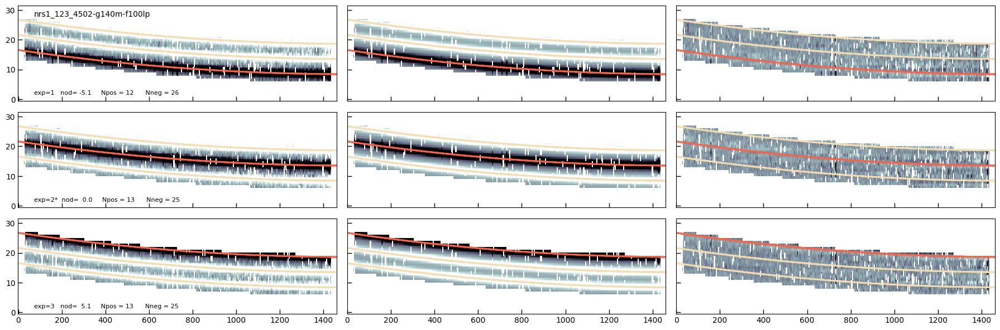

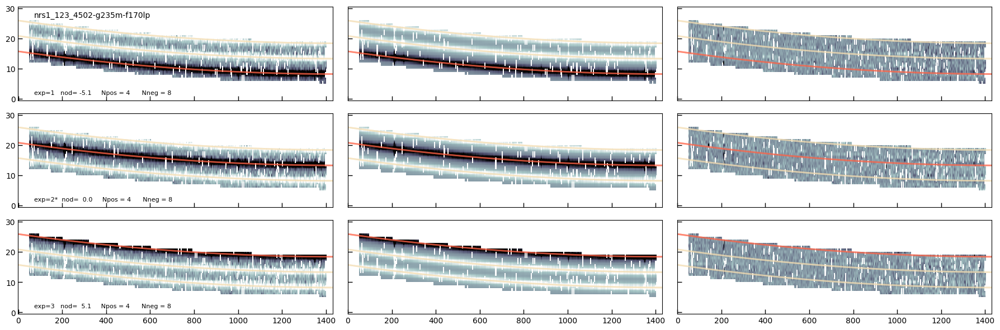

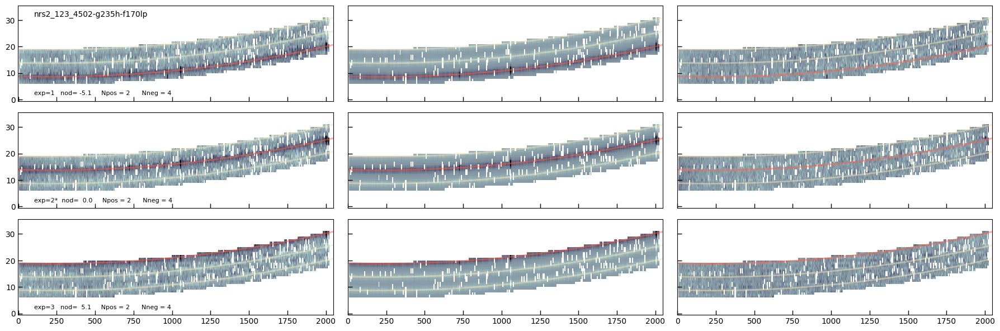

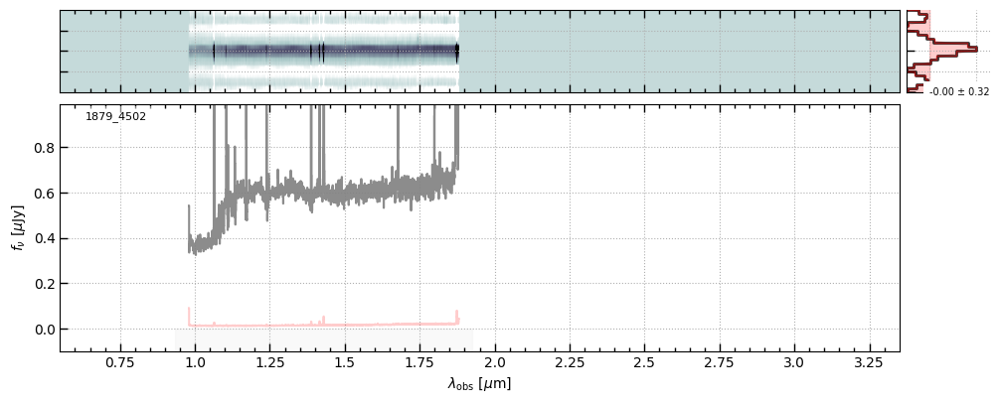

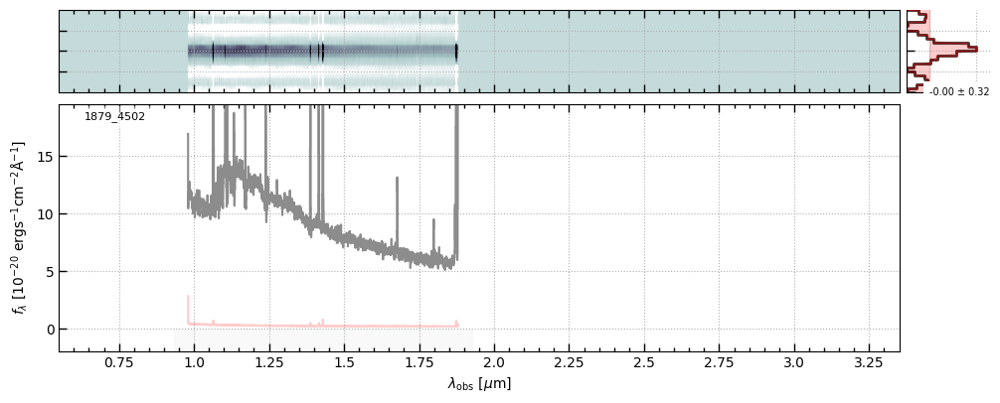

...

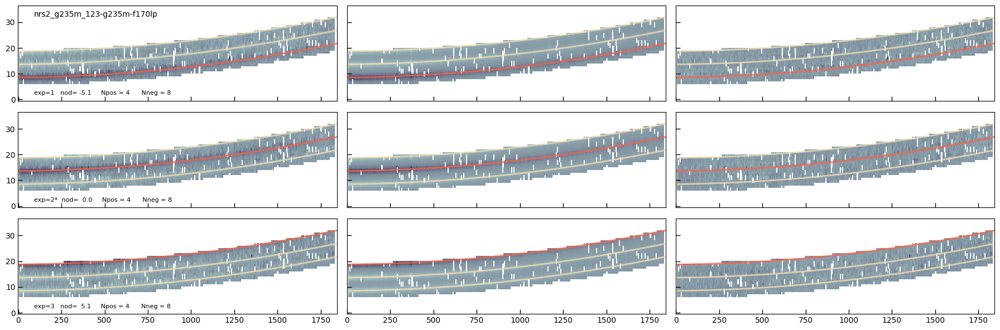

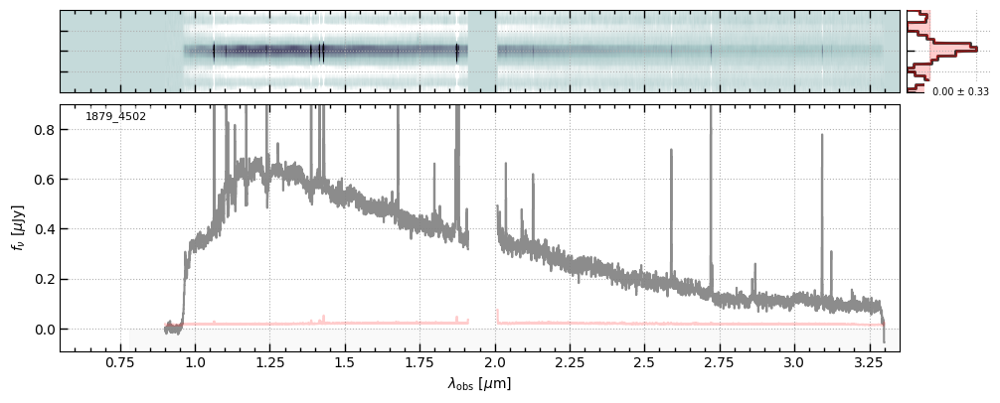

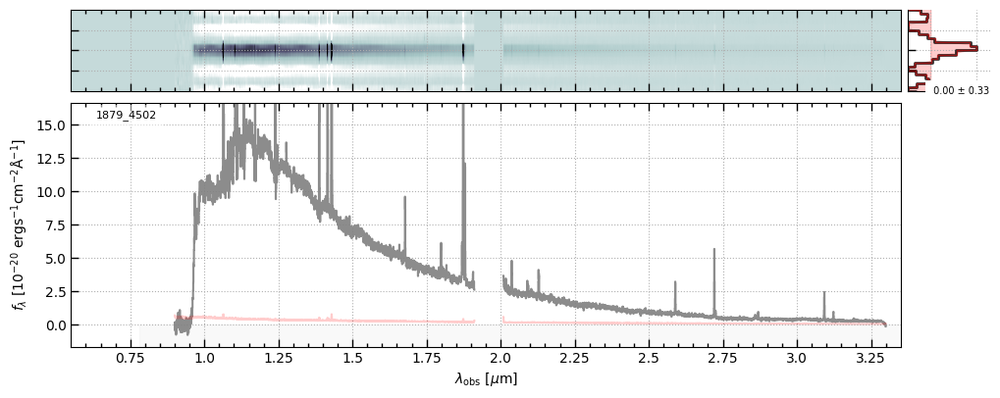

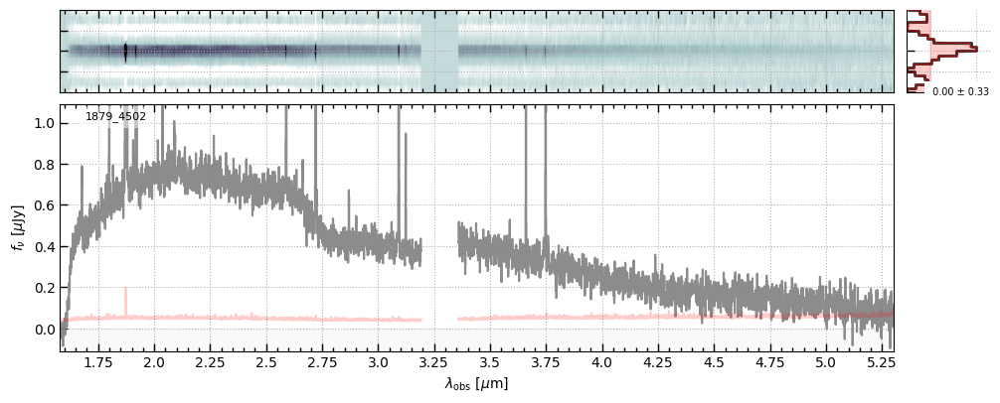

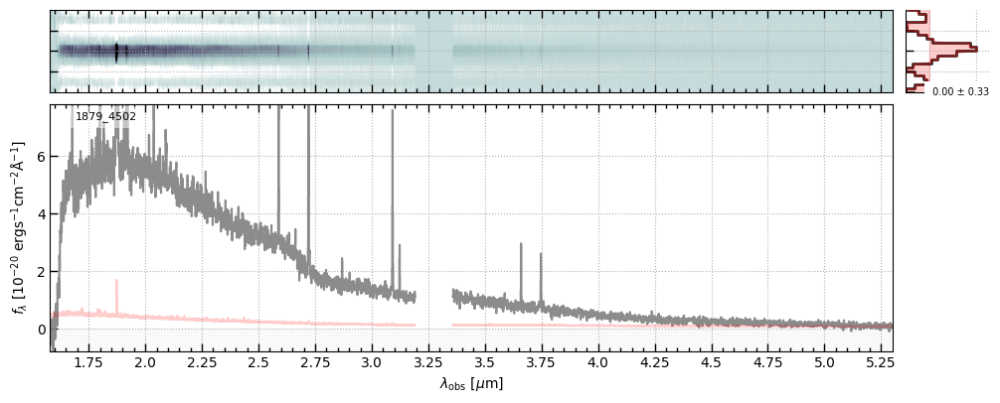

In [1377]:
import gc
import matplotlib.pyplot as plt
import time
import traceback
from msaexp.slit_combine import extract_spectra
import jwst.datamodels


PLOT_OFF = False
SKIP_COMPLETED = False
IS_INTERACTIVE = True

done = []

plt.rcParams['scatter.marker'] = '.'

if PLOT_OFF:
    plt.ioff()

join = [3, 5, 7]

for key in targets:
    # for key in keys:

    # plt.close('all')
    # files = glob.glob(f'*{key}.spec.fits')
    # files += glob.glob(f'*{key}.extract.log')
    # files += glob.glob(f'*{key.replace("m","-").replace("_b", "_background_")}.spec.fits')
    # if ((len(files) > 0) | (key in done)) & SKIP_COMPLETED:
    #     print('Skip: ', key)
    #     continue

    utils.LOGFILE = f'{outroot}_{key}.extract.log'
    utils.log_comment(utils.LOGFILE, 'Start', verbose=True, show_date=True)

    # pfiles = glob.glob(f'*phot.*{key}.fits')
    # pfiles.sort()
    
    if len(pfiles + rfiles) < 2:
        print('Skip: ', key, len(pfiles), 'files')
        continue

    print('Run: ', key)
    
    try:
        DRIZZLE_KWS = dict(step=1,
                       # with_pathloss=True,
                        with_pathloss=False,
                        wave_sample=1.05,
                        ny=15,
                        dkws=dict(oversample=16, pixfrac=0.8),
                               grating_limits=GRATING_LIMITS,
                          )
        
        FIT_PARAMS_SN_KWARGS = dict(sn_percentile=95,
                                    sigma_threshold=0,
                                    # degree_sn=[[-10000,10,100], [0,1,2]],
                                    degree_sn=[[-10000], [0]],
                                    verbose=True)

        if 'b' in key:
            msaexp.slit_combine.CENTER_WIDTH = 0.1
            initial_theta = [5., -0.5]
        else:
            msaexp.slit_combine.CENTER_WIDTH = 0.1
            initial_theta = None
            # initial_theta = [5., -2.5]

        position_key = 'y_index'
        trace_from_yoffset = True

        kwargs = dict(
            path_to_files='./',
            files=rfiles,
            root=outroot,
            do_gratings=['PRISM','G140H','G235H','G395H','G395M','G235M','G140M'][:],
            join=join,
            stuck_min_sn=0.9 - 500,
            pad_border=2,
            sort_by_sn=True,
            position_key=position_key,
            reference_exposure='auto',
            offset_degree=1,
            trace_from_yoffset=trace_from_yoffset,
            recenter_all=False,
            initial_sigma=5,
            fit_type=1,
            initial_theta=initial_theta,
            fix_params=False,
            input_fix_sigma=None,
            fit_params_kwargs=FIT_PARAMS_SN_KWARGS,
            drizzle_kws=DRIZZLE_KWS,
            undo_barshadow=False,
            undo_pathloss=True,
            get_xobj=True,
            make_2d_plots=2,
        )

        kwargs['fix_prism_norm'] = False
        
        if 0:
            # Use point source pathloss
            kwargs['drizzle_kws']['with_pathloss'] = False; kwargs['undo_pathloss'] = 2
        else:
            kwargs['drizzle_kws']['with_pathloss'] = True; kwargs['undo_pathloss'] = 1
    
        kwargs['split_uncover'] = 1
        kwargs['pad_border'] = 0
        
        kwargs['hot_cold_kwargs'] = None #{'dilate':1}
        # kwargs['hot_cold_kwargs'] = {'cold_percentile':0.5, 'hot_percentile':99.95, 'absolute':False}
        # kwargs['hot_cold_kwargs'] = {'cold_percentile':0.5, 'hot_percentile':99.9, 'absolute':False}
        
        # kwargs['initial_theta'] = [5, -5.]
        kwargs['fix_params'] = False
        kwargs['flag_profile_kwargs'] = None #{'make_plot': True, 'grow': 2, 'require_multiple': False}
        # kwargs['flag_profile_kwargs'] = {'require_multiple': True, 'make_plot': True, 'nfilt':-32, 'grow': 2.}
        kwargs['flag_percentile_kwargs'] = dict(plevels=[0.95, -4, -0.1], yslit=[-2, 2], scale=2., dilate=np.ones((3,3)))
        kwargs['flag_trace_kwargs'] = {}
        
        kwargs['weight_type'] = 'ivm'
        
        estimate_sky_kwargs={'make_plot':True, 'df':71,
                             'outlier_threshold': 7,
                             'var_percentiles': [-2,-2],
                             'absolute_threshold':0.2,
                             'min_bar': 0.95,
                             'mask_yslit': [[-4, 4]],
                             'high_clip':0.9,
                            }
            
        if outroot.startswith('glazebrook'):
            estimate_sky_kwargs['mask_yslit'] = [[-8,8]]
            estimate_sky_kwargs['absolute_threshold'] = 0.1
            kwargs['pad_border'] = 2

        kwargs['undo_barshadow'] = 2
        kwargs['min_bar'] = 0.4
        
        kwargs['fixed_offset'] = 0.0
        kwargs['bar_corr_mode'] = 'wave'
        
        if outroot.split('-v')[0] in ['macsj0647-hr']:
            # kwargs['diffs'] = True
            kwargs['diffs'] = False
            # estimate_sky_kwargs = None
            estimate_sky_kwargs['df'] = 15
            kwargs['hot_cold_kwargs'] = None
            # kwargs['join'] = [0,3]
        else:
            kwargs['diffs'] = False

        ####
        # Scale global sky spectrum
        sky_file = f'{outroot}_prism_sky.csv'

        if os.path.exists(sky_file) & (1):
            
            print(f'\n use {sky_file} for global sky')
        
            sky_data = utils.read_catalog(sky_file)
            kwargs['sky_arrays'] = sky_data['wave'], sky_data['flux']

            kwargs['pad_border'] = 1
            
            estimate_sky_kwargs['df'] = 0
            estimate_sky_kwargs['mask_yslit'] = [[-4, 4]]

            if 1:
                estimate_sky_kwargs['df'] = 5
                estimate_sky_kwargs['mask_yslit'] = [[-6, 6]]
                if outroot.startswith('glazebrook'):
                    estimate_sky_kwargs['mask_yslit'] = [[-8,8]]

            # Fixed sky
            if 0:
                estimate_sky_kwargs['df'] = -1
                estimate_sky_kwargs['mask_yslit'] = [[-8, 8]]
            
            estimate_sky_kwargs['outlier_threshold'] = 7
            
            if 0:
                estimate_sky_kwargs['outlier_threshold'] = 1000
        
        kwargs['estimate_sky_kwargs'] = estimate_sky_kwargs
        kwargs['fix_prism_norm'] = True

        if outroot.split('-v3')[0] in ['gds-barrufet-s67']:
            kwargs['diffs'] = True
            kwargs['sky_arrays'] = None
            kwargs['estimate_sky_kwargs'] = None

        if outroot.split('-v3')[0] in ['macsj0647-single','whl0137']:
            kwargs['diffs'] = False
            kwargs['estimate_sky_kwargs'] = None
            kwargs['join'] = [0,3,5]
            kwargs['flag_profile_kwargs'] = {'make_plot':True, 'grow':4}
            kwargs['flag_trace_kwargs'] = None
            kwargs['make_2d_plots'] = False
            kwargs['pad_border'] = 0
            kwargs['min_bar'] = 0.1

        if 0:
            kwargs['initial_theta'] = [8, 0.]
            kwargs['fit_params_kwargs']['sigma_threshold'] = -10

        if 0:
            kwargs['input_fix_sigma'] = 10.

        BAD_PIXEL_NAMES = [
            "DO_NOT_USE",
            # "OTHER_BAD_PIXEL",
            "MSA_FAILED_OPEN",
            # "UNRELIABLE_SLOPE",
            # "UNRELIABLE_BIAS",
            # "NO_SAT_CHECK",
            # "NO_GAIN_VALUE",
            "HOT",
            "DEAD",
            # # "TELEGRAPH",
            # "RC",
            # "LOW_QE",
            "OPEN",
            "ADJ_OPEN",
            "SATURATED",
        ]
        msaexp.slit_combine.BAD_PIXEL_FLAG = 1024
        for _bp in BAD_PIXEL_NAMES:
            msaexp.slit_combine.BAD_PIXEL_FLAG |= jwst.datamodels.dqflags.pixel[_bp]
        
        # Use point source path loss to compare to MAST
        if 0:
            kwargs['drizzle_kws']['with_pathloss'] = False
            kwargs['undo_pathloss'] = 0 # to compare to mast

        if 1:
            kwargs["sky_file"] = "read"
            # kwargs["global_sky_df"] = -1; kwargs['estimate_sky_kwargs'] = None
            kwargs["global_sky_df"] = 7
            kwargs['estimate_sky_kwargs']['mask_yslit'] = [[-8, 8]]
            kwargs['estimate_sky_kwargs']['high_clip'] = 1.5
            kwargs['estimate_sky_kwargs']['absolute_threshold'] = 1.

        if outroot.split('-v')[0] in ['cecilia', 'cosmos-curti','stark-a1703','cosmos-alpha', 'stark-rxcj2248']:
            kwargs['recenter_all'] = True
            kwargs['grating_diffs'] = False
            kwargs['diffs'] = True
            # kwargs['flag_percentile_kwargs'] = {'plev': [0.95, 0.9999, 0.999999], 'scale':2, 'dilate':False}
            # kwargs['flag_profile_kwargs'] = None
            # kwargs['flag_profile_kwargs'] = {'require_multiple': True, 'make_plot': True, 'nfilt':-32, 'grow': 3.}
            kwargs['include_full_pixtab'] = ['PRISM']

        if outroot.split('-v3')[0] in ['abell2744-glass']:
            kwargs['diffs'] = True
            kwargs['sky_arrays'] = None
            kwargs['estimate_sky_kwargs'] = None
            kwargs['valid_frac_threshold'] = 0.1

            kwargs['dilate_failed_open'] = False

            if key in ['1324_180009', '1324_320027']:
                kwargs['num_shutters'] = -1
            else:
                kwargs['num_shutters'] = 0

            import msaexp.utils as msautils
            import jwst.datamodels
            
            print(msautils.BAD_PIXEL_FLAG)
            msautils.BAD_PIXEL_FLAG = 1 | 1024
            
            if "MSA_FAILED_OPEN" in msautils.BAD_PIXEL_NAMES:
                print("pop failed open dq flag")
                _ = msautils.BAD_PIXEL_NAMES.pop(msautils.BAD_PIXEL_NAMES.index("MSA_FAILED_OPEN"))
                msautils._set_bad_pixel_flag()
            
            for _bp in msautils.BAD_PIXEL_NAMES:
                msautils.BAD_PIXEL_FLAG |= jwst.datamodels.dqflags.pixel[_bp]
            
            print(msautils.BAD_PIXEL_FLAG)

        # kwargs['diffs'] = True
        # kwargs['fit_params_kwargs']['degree_sn'] = [[-10000,30,100], [0,1,2]]
        if outroot == 'xglazebrook-v3':
            kwargs['fixed_offset'] = 0.19
        
        kwargs['diffs'] = True

        if outroot in ['ceers-v3', 'macs0416-v3', 'macs1423-v3', 'abell370-v3', 'macs1149-v3', 'gds-egami-ddt-v3', 'macs0417-v3']:
            kwargs['diffs'] = False

        if outroot.startswith('rubies') & ('v3' in outroot):
            kwargs['diffs'] = False

        if (outroot in ['jades-gds-wide3-v3', 
                        'jades-gds-w03-v3',
                        'jades-gds-w05-v3',
                        'jades-gds-w06-v3',
                        'jades-gds-w07-v3',
                        'jades-gds-w08-v3',
                        'jades-gds-w09-v3',
                        'jades-gds05-v3',
                        'abell2744-castellano1-v3',
                      ]) & (True):
            kwargs['diffs'] = False
            if FORCE_DIFFS:
                kwargs['diffs'] = True

        if '-nod' in outroot:
            kwargs['diffs'] = True
        
        elif outroot in ['xrubies-uds31-v3', 'xrubies-uds32-v3', 'xrubies-uds33-v3',
                         'uncover-62-v3', 'uncover-61-v3']:
            kwargs['diffs'] = True
            
        if key in ['4233_61167', '4233_61168']:
            turn_off_flagging = True
            kwargs['grating_diffs'] = True
            kwargs['mask_cross_dispersion'] = [8,1000]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            # kwargs['estimate_sky_kwargs']['df'] = -1
        else:
            kwargs['mask_cross_dispersion'] = None
            kwargs['cross_dispersion_mask_type'] = 'trace'
            turn_off_flagging = False

        if key in ['4233_131457']:
            kwargs['mask_cross_dispersion'] = [3,1000]
            kwargs['cross_dispersion_mask_type'] = 'fixed'
            
        if IS_INTERACTIVE & (1) & (key in ['2561_80166', '2561_80006', '2561_31609']):
            turn_off_flagging = True
            kwargs['diffs'] = False
            kwargs['estimate_sky_kwargs']['df'] = -1
            kwargs['global_sky_df'] = -1
            
        if turn_off_flagging:
            print('Turn off bad pixel flagging')
            kwargs['flag_trace_kwargs'] = None
            kwargs['flag_percentile_kwargs'] = None
            kwargs['flag_profile_kwargs'] = None
            kwargs['estimate_sky_kwargs']['outlier_threshold'] = 10000000
            kwargs['estimate_sky_kwargs']['high_clip'] = 100000

        if (outroot == 'j0252m0503-hennawi-07-v3') & (IS_INTERACTIVE):
            kwargs['diffs'] = True
            
        if outroot.startswith('macsj0647-hr'):
            _files = glob.glob(f'jw04246003001_0310[135]*{key}.fits')
            print(f'{outroot} manual {len(_files)} files {key}')
            if len(_files) == 0:
                continue
                
            kwargs['files'] = _files
            # kwargs['valid_frac_threshold'] = 0.01
            # kwargs['files'] = None
            kwargs['diffs'] = False
            kwargs['grating_diffs'] = False
            kwargs['make_2d_plots'] = False
            kwargs['trace_with_ypos'] = True
            kwargs['trace_from_yoffset'] = False
            kwargs['sky_file'] = 'jw04246003001_sky.csv'
            # kwargs['estimate_sky_kwargs'] = None
            kwargs['global_sky_df'] = 0
            # kwargs['estimate_sky_kwargs']['mask_yslit'] = [[100,-100]]
            kwargs['estimate_sky_kwargs']['outlier_threshold'] = 7
            # kwargs['drizzle_kws']['wave_sample'] = 0.95
            kwargs['drizzle_kws']['dkws']['pixfrac'] = 1.0
            kwargs['estimate_sky_kwargs']['high_clip'] = 5
            kwargs['flag_profile_kwargs'] = {'require_multiple':False, 'make_plot':False}
            kwargs['initial_theta'] = [4.0, 0]
            kwargs['fix_params'] = True
            kwargs['plot_kws'] = {'smooth_sigma':2, 'ymax_sigma_scale':15}
            
        elif (outroot == 'jades-gds-w09-v3') & (key == 'b32'):
            # print('yes')
        
            _files = glob.glob('*phot*b32.fits')
            _files.sort()
            if 0:
                kwargs['files'] = _files[-3:] #_files
                kwargs['bad_shutter_names'] = [1]
            else:
                kwargs['files'] = _files[:-3]
                
        else:
            kwargs['files'] = None

        if 'castellano' in outroot:
            #  kwargs['sky_file'] = 'jw03073010001_sky.csv'
            kwargs['diffs'] = True

        if key in ['3073_22600']:
            kwargs['mask_cross_dispersion'] = [7,100]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            kwargs["diffs"] = True

        if key in ['3073_22600', '3073_21352', '3073_23628']:
            kwargs["diffs"] = True

        if '-xoff' in outroot:
            kwargs['trace_with_xpos'] = True
        
        if ('-v4' in outroot) & (True):
            kwargs['trace_with_xpos'] = True
            kwargs['fix_prism_norm'] = False
            kwargs['diffs'] = len(glob.glob('*sky.csv')) == 0
            if kwargs['diffs']:
                kwargs['estimate_sky_kwargs'] = None
            
            kwargs['include_full_pixtab'] = ['PRISM','G140M','G235M','G395M']

            # kwargs['files'] = glob.glob(f'*_b00*{key}.fits')
            # kwargs['files'].sort()
            
            if FORCE_DIFFS:
                kwargs['diffs'] = True

        ######################
        kwargs['estimate_sky_kwargs'] = None
        kwargs['sky_file'] = None
        kwargs['fix_prism_norm'] = False
        kwargs['min_extended_calibration'] = 0.05
        kwargs['min_extended_calibration'] = None
        kwargs['files'] = pfiles

        kwargs['extended_calibration_kwargs'] = None

        kwargs['trace_with_xpos'] = True
        
        if 0:
            kwargs['mask_cross_dispersion'] = [-100,2]
            kwargs['cross_dispersion_mask_type'] = 'fixed'
        elif key == '3567_66283':
            kwargs['mask_cross_dispersion'] = [-100,-5]
            kwargs['cross_dispersion_mask_type'] = 'trace'
            
        if 'kriek' in outroot:
            kwargs['recenter_all'] = True
            
        #### 
        ##  Run it
        kwargs['drizzle_kws']['with_pathloss'] = False

        if (1) & (len(pfiles) > 0):
            kwargs['files'] = pfiles
            kwargs['root'] = outroot.replace('vx','vo').replace('-v3','-vo')      
            hdul, xobj = extract_spectra(target=key, **kwargs)

        if (1) & (len(rfiles) > 0):
            kwargs['files'] = rfiles
            kwargs['extended_calibration_kwargs'] = None
            kwargs['root'] = outroot.replace('-v3','-vx')      
            hdul, xobj = extract_spectra(target=key, **kwargs)

        # if (1) & (len(rfiles) > 0):
        #     kwargs['files'] = rfiles
        #     kwargs['root'] = outroot.replace('-vx','-vy')      
        #     kwargs['extended_calibration_kwargs'] = {"threshold": 0.005}
        #     hdul, xobj = extract_spectra(target=key, **kwargs)

    except:
        print('Failed: ', key)
        utils.log_exception(utils.LOGFILE, traceback, verbose=True, mode='a')

    utils.log_comment(utils.LOGFILE, 'Done', verbose=True, show_date=True)
    
    done.append(key)
    if IS_INTERACTIVE & (1):
        break

    gc.collect()
    gc.collect()
    gc.collect()

if PLOT_OFF:
    plt.ion()


cosmos-curti-vo_g140m-f100lp_1879_4502.spec.fits
cosmos-curti-vo_g235m-f170lp_1879_4502.spec.fits


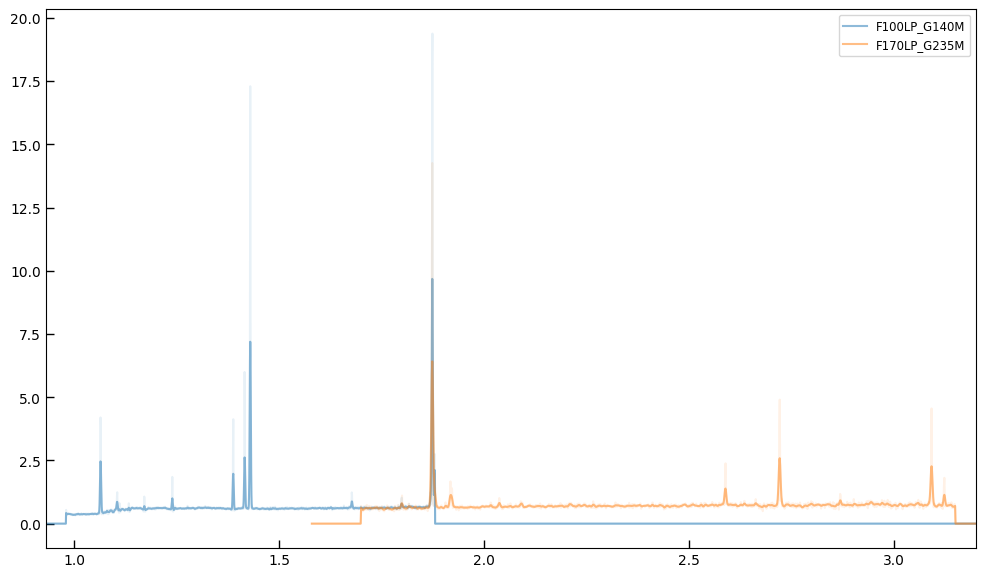

In [1378]:
import scipy.ndimage as nd

new_spe_files = glob.glob(f'{outroot.replace("vx","vo")}*{srcid}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

grating_smooth = 2

# plt.plot(spe["wave"], spe["flux"] * spe["to_flam"]**flam, label=os.path.basename(spe_file).split('.spec')[0], color='0.5')

ymax = None
xmin, xmax = 10, 0

for new_file in new_spe_files:
    if 'h-f' in new_file:
        continue
        
    print(new_file)
    
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    flux = new_spe["flux"] * new_spe["to_flam"]**flam
    if 'prism' in new_file:
        ymax = flux[new_spe.valid].max()
        # continue
        
        plt.plot(new_spe["wave"], flux, label=inst_key, alpha=0.5) #color='tomato')
        
    else:
        smoothed_flux = flux*0.
        smoothed_flux[new_spe.valid] = nd.gaussian_filter1d(flux[new_spe.valid], grating_smooth)

        pl = plt.plot(new_spe["wave"], flux, alpha=0.1)
        plt.plot(new_spe["wave"], smoothed_flux, label=inst_key, alpha=0.5, color=pl[0].get_color())


    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

plt.xlim(xmin, xmax)
if ymax is not None:
    plt.ylim(-0.2*ymax, 2*ymax)
    
inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"
ax.legend()
# plt.ylim(-0.1, 8); plt.xlim(0.6, 5.7)



cosmos-curti-vx_g140m-f100lp_1879_4502.spec.fits
cosmos-curti-vx_g235m-f170lp_1879_4502.spec.fits


(0.6, 5.7)

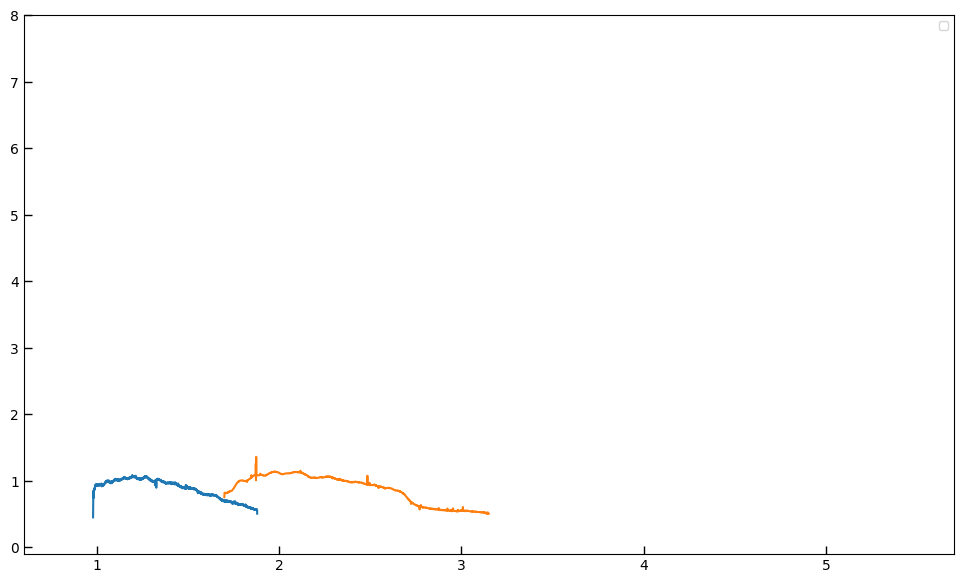

In [1379]:
import scipy.ndimage as nd

new_spe_files = glob.glob(f'{outroot.replace("vx","vx")}*{srcid}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

grating_smooth = 2

# plt.plot(spe["wave"], spe["flux"] * spe["to_flam"]**flam, label=os.path.basename(spe_file).split('.spec')[0], color='0.5')

ymax = None
xmin, xmax = 10, 0
for new_file in new_spe_files:
    if 'h-f' in new_file:
        continue
        
    print(new_file)
    
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    old_spe = msaexp.spectrum.SpectrumSampler(new_file.replace('vx','vo'))

    plt.plot(new_spe['wave'], new_spe['flux'] / old_spe['flux'])
    
    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

ymax = 1.4

plt.xlim(xmin, xmax)
if ymax is not None:
    plt.ylim(-0.2*ymax, 2*ymax)
    
inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"
ax.legend()
plt.ylim(-0.1, 8); plt.xlim(0.6, 5.7)



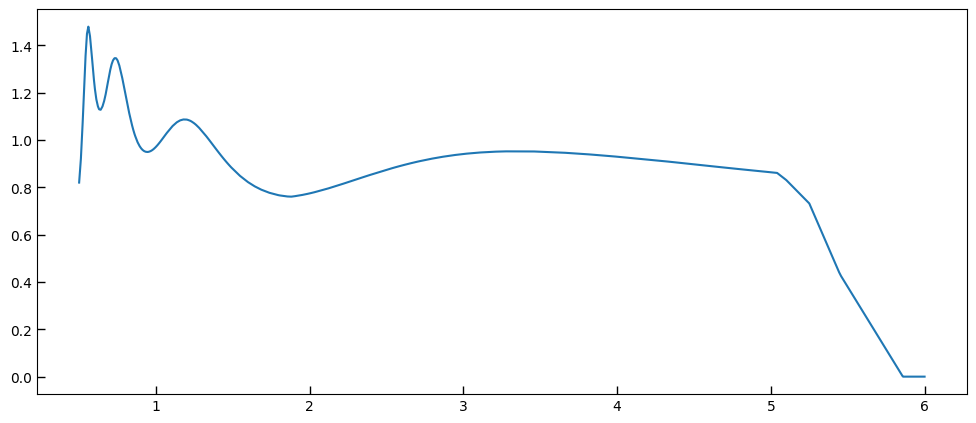

In [1380]:
# New spectra have old dflat 
det = 'NRS2'

sens_path = '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/'

dflat_file = glob.glob(f'{sens_path}/*dflat*{det}*fits')[0]
df = utils.read_catalog(dflat_file)[0]
dfo = df["wavelength"] > 0
plt.plot(df['wavelength'][dfo], df['data'][dfo])

(0.7, 5.7)

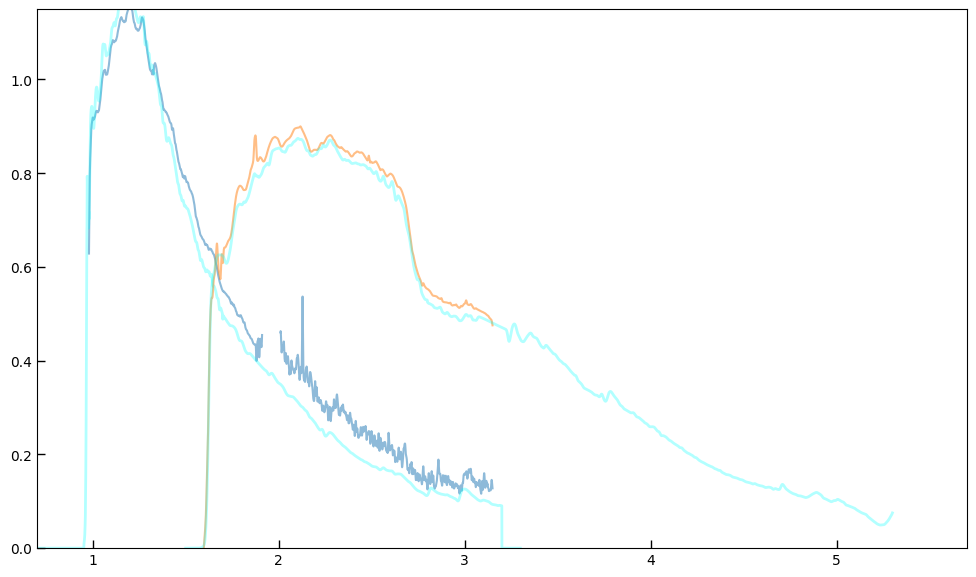

In [1381]:
new_spe_files = glob.glob(f'{outroot}*{srcid}.spec.fits')
new_spe_files.sort()

fig, ax = plt.subplots(1,1,figsize=(12,7))

flam = 0

xmin, xmax = 10, 0
for new_file in new_spe_files:
    new_spe = msaexp.spectrum.SpectrumSampler(new_file)
    old_spe = msaexp.spectrum.SpectrumSampler(new_file.replace('-vx','-vo'))
    oflux = old_spe["flux"]
    
    fill = new_spe["wave"]*0.
    for _f in [new_file] + new_spe_files:

        if 'prism' in new_file:
            if 'prism' not in _f:
                continue
        elif 'g140' in new_file:
            if 'prism' in _f:
                continue
        else:
            if 'xprism' in _f:
                continue
                
        old_spe = msaexp.spectrum.SpectrumSampler(_f.replace('-vx','-vo'))
        if 'prism' in _f:
            old_spe.valid &= nd.binary_erosion(old_spe.valid, iterations=1) & (old_spe["wave"] > 0.9) & (old_spe["wave"] < 5.3)

        ofl = old_spe["flux"]
        ofl[~old_spe.valid] = np.nan
        
        fi = np.interp(new_spe["wave"], old_spe["wave"], old_spe["flux"], left=0, right=0)
        ok = (new_spe.valid) & (fi > 0) & np.isfinite(fi) & (fill == 0)
        
        fill[ok] = fi[ok]

    # fill = nd.gaussian_filter(fill, 5)
    fill[fill == 0] = np.nan

    okf = np.isfinite(fill)
    if 'prism' not in new_file:
        # fill[okf] = nd.median_filter(fill[okf], 3)
        fill[okf] = nd.gaussian_filter1d(fill[okf], 3)

    # oflux = fill
    
    inst_key = f"{new_spe.meta['FILTER']}_{new_spe.meta['GRATING']}"

    # plt.plot(new_spe["wave"], new_spe["flux"] / oflux, label=inst_key, alpha=0.5) #color='tomato')
    scl = 25 if 'prism' in new_file else 1.0

    sens_path = '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/'
    
    fflat = utils.read_catalog(f"{sens_path}/tyc4433_s200a1_sensitivity_{inst_key}.fits")
    #fflat = utils.read_catalog(f"fix_p330e_s1600a1_sensitivity_{inst_key}.fits")
    # plt.plot(fflat["wavelength"], fflat["sensitivity"]*0.75, alpha=0.3)

    newf = new_spe["flux"]*1
    dfi = np.interp(new_spe["wave"], df['wavelength'][dfo], df['data'][dfo])
    newf *= dfi
    
    if 'prism' not in new_file:
        newf[new_spe.valid] = nd.gaussian_filter1d(newf[new_spe.valid], 3)

    plt.plot(new_spe["wave"], newf / fill / scl, label=inst_key, alpha=0.5) #, color='tomato')

    ratio = newf / fill
    ri = np.interp(fflat["wavelength"], new_spe["wave"], ratio, left=np.nan, right=np.nan)
    okr = np.isfinite(ri)

    # plt.plot(fflat["wavelength"][okr], (ri/fflat["sensitivity"])[okr])

    bspl = utils.bspline_templates(fflat["wavelength"], df=7, get_matrix=True)
    c = np.linalg.lstsq(bspl[okr,:], (ri/fflat["sensitivity"])[okr], rcond=None)
    cc = bspl.dot(c[0])

    # cc = cc**0
    
    # plt.plot(fflat["wavelength"], cc, color='r', alpha=0.5)
    
    # c = np.polyfit(fflat["wavelength"][okr], (ri/fflat["sensitivity"])[okr], 5)
    # cc = np.polyval(c, fflat["wavelength"])
    fix_sens = fflat["sensitivity"]*cc
    oflux[oflux == 0] = np.nan
    if 'g140m' in new_file:
        oflux[new_spe["wave"] < 0.9] = np.nan

    if '100lp' in new_file:
        oflux[new_spe["wave"] < 1.] = np.nan
    
    ora = np.interp(fflat["wavelength"], new_spe["wave"], new_spe["flux"]/oflux, left=np.nan, right=np.nan)
    # ora = np.interp(fflat["wavelength"], new_spe["wave"], new_spe["flux"]/oflux, left=np.nan, right=np.nan)
    # ora = fill / oflux
    
    # print(new_file)
    # if ('x395m' not in new_file) & (1):
    #     fix_sens[np.isfinite(ora)] = ora[np.isfinite(ora)]
    
    # plt.plot(fflat["wavelength"], fix_sens / scl, alpha=0.3, color='magenta', lw=3)
    plt.plot(fflat["wavelength"], fflat["sensitivity"] / scl, alpha=0.3, color='cyan', lw=2)

    fflat["sensitivity"] = fix_sens
    
    # fflat.write(f"fix_p330e_s1600a1_sensitivity_{inst_key}.fits", overwrite=True)
    
    xmin = np.minimum(xmin, new_spe["wave"][new_spe.valid].min()-0.05)
    xmax = np.maximum(xmax, new_spe["wave"][new_spe.valid].max()+0.05)

plt.xlim(0.5, 5.8)

plt.ylim(0, 1.15)

# plt.xlim(2.5, 3.6)

plt.xlim(0.7, 5.7)

# plt.xlim(0.5, 1.0)

In [1382]:
inst_key, srcid

('F170LP_G235M', 4502)

F100LP_G140M


(0.0, 1.5)

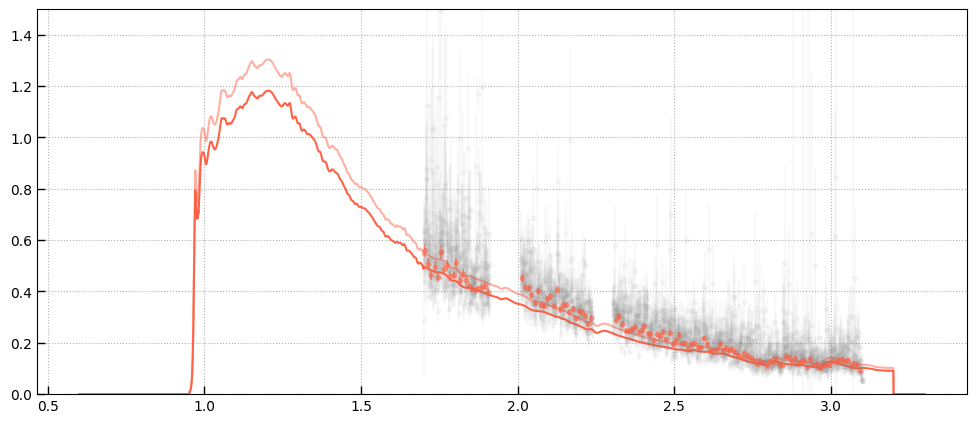

In [1394]:
# Explicit filter 
plt.rcParams['figure.figsize'] = (12, 5)

if 1:
    blue = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*g140m*{srcid}.spec.fits'.replace('vx','vx'))[0])
    red = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*g235*{srcid}.spec.fits'.replace('vx','vo'))[0])
elif 0:
    blue = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*g235*{srcid}.spec.fits'.replace('vx','vx'))[0])
    red = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*g395*{srcid}.spec.fits'.replace('vx','vo'))[0])
else:
    blue = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*pri*{srcid}.spec.fits'.replace('vx','vx'))[0])
    red = msaexp.spectrum.SpectrumSampler(glob.glob(f'{outroot}*pri*{srcid}.spec.fits'.replace('vx','vo'))[0])

red['flux'][~red.valid] = np.nan

if len(red['wave']) == len(blue['wave']):
    red_flux = red['flux']*1
    red_err = red['full_err']*1.e-3
    blue.spec['full_err'] *= 1.e-3
    
else:
    red_flux = np.interp(blue['wave'], red['wave'], red['flux'])
    red_err = np.interp(blue['wave'], red['wave'], red['full_err'])

dfi = np.interp(blue["wave"], df['wavelength'][dfo], df['data'][dfo])

ratio = blue['flux']*dfi / red_flux

err_ratio = np.sqrt(ratio**2 * ((red_err / red_flux)**2 + (blue['full_err'] / blue['flux'])**2))
ratio[~blue.valid] = np.nan
plt.errorbar(blue['wave'], ratio, err_ratio, alpha=0.05, marker='.', linestyle='None', color='0.5')

ok = np.isfinite(ratio)

inst_key = f"{blue.meta['FILTER']}_{blue.meta['GRATING']}"
print(inst_key)
sens_path = '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/'

fflat_file = f"{sens_path}/tyc4433_s200a1_sensitivity_{inst_key}.fits"

fflat = utils.read_catalog(fflat_file)
plt.plot(fflat['wavelength'], fflat['sensitivity'], color='tomato')

import grizli.utils_numba
import grizli.utils_numba.interp
x = np.arange(0.5, 5.4, 0.01)

ok = blue['wave'] > 0

rx, ry, re = grizli.utils_numba.interp.rebin_weighted_c(x, blue['wave'][ok].astype(float), ratio[ok], err_ratio[ok])

tab = utils.GTable()

tab['wave'] = rx
tab['ratio'] = ry
tab['eratio'] = re

tab.write(f'sensitivity_ratio_{srcid}_{inst_key}.fits', overwrite=True)

plt.errorbar(rx, ry, re, alpha=0.5, marker='.', color='tomato', linestyle='None')

sinterp = np.interp(rx, fflat['wavelength'], fflat['sensitivity'])

cc = np.polyfit(rx, ry/sinterp, 1, w=sinterp/re)

sscl = np.median(ry/sinterp)

plt.plot(fflat['wavelength'], fflat['sensitivity'] * np.polyval(cc, fflat['wavelength']), color='tomato', alpha=0.5)

# plt.plot(rx, ry / sinterp * 20)
srcid, inst_key
plt.grid()

if 'correct_to_crds' in fflat.colnames:
    fflat.remove_column('correct_to_crds')

fflat['correct_to_crds'] = np.polyval(cc, fflat['wavelength'])

fflat.write(fflat_file, overwrite=True)

# plt.ylim(0, 2)
# plt.ylim(0, 35)
plt.ylim(0, 1.5)

# 

In [1205]:
for row in v4[rows][:]:
    sp = msaexp.spectrum.SpectrumSampler('https://s3.amazonaws.com/msaexp-nirspec/extractions/{root}/{file}'.format(**row))
    print(sp.file)

    sens = utils.read_catalog(sens_path.format(**sp.meta))

    pwi = np.interp(sens['wavelength'], prism['wave'], prism['flux'])
    s1 = np.interp(sens['wavelength']*2, sens['wavelength'], sens['sensitivity'], left=np.nan, right=np.nan)

    # plt.plot(sens['wavelength'], pwi)
    
    if 'sensitivity_2' in sens.colnames:
        print(sens_path.format(**sp.meta))
        plt.plot(sens['wavelength']*2, sens['sensitivity_2'] * pwi / s1, alpha=0.5, color='magenta')
        # break
        

https://s3.amazonaws.com/msaexp-nirspec/extractions/jades-gdn10-v4/jades-gdn10-v4_g140m-f070lp_1181_27839.spec.fits


IsADirectoryError: [Errno 21] Is a directory: '/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/'

# Chebfit demo

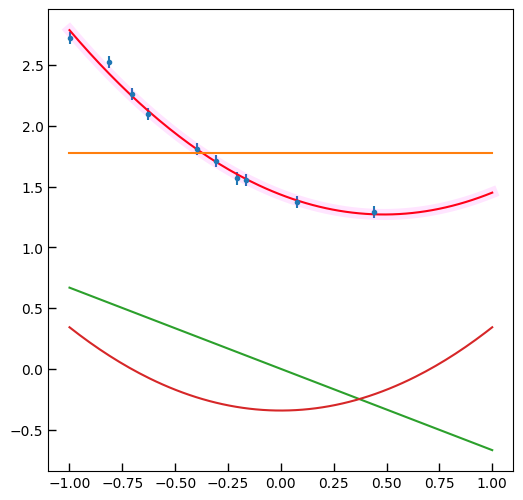

In [2451]:
np.random.seed(1)
x = np.random.rand(10)*2-1
c = np.random.normal(size=3)
eps = np.ones(len(x))*0.05
err = np.random.normal(size=len(x))*eps

y = np.polynomial.chebyshev.chebval(x, c)

yerr = y + err
plt.errorbar(x, yerr, x*0+eps, linestyle='None', marker='.')

cfit = np.polynomial.chebyshev.chebfit(x, yerr, deg=2, w=1./eps)
xfull = np.linspace(-1,1,128)
plt.plot(xfull, np.polynomial.chebyshev.chebval(xfull, cfit), color='r')

# "Design matrix"
A = np.polynomial.chebyshev.chebvander(x, 2)
Afull = np.polynomial.chebyshev.chebvander(xfull, 2)

lsq_coeffs = np.linalg.lstsq((A.T/eps).T, yerr/eps, rcond=None)
plt.plot(xfull, np.polynomial.chebyshev.chebval(xfull, lsq_coeffs[0]), color='magenta', alpha=0.1, lw=8)

# Components
plt.plot(xfull, Afull*lsq_coeffs[0])

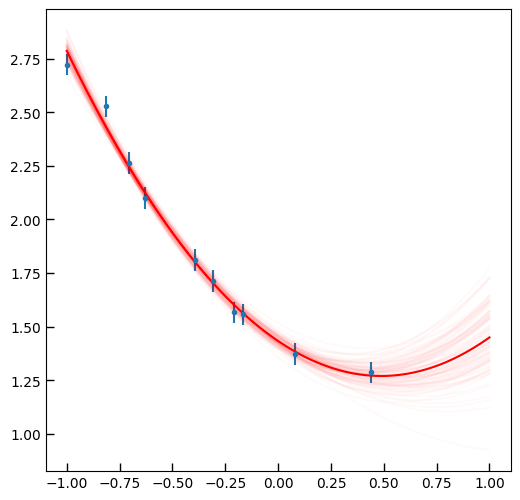

In [2471]:
# Uncertainties
# design matrix with weights
Ax = (A.T/eps).T

covar = utils.safe_invert(np.dot(Ax.T, Ax))
param_uncertainties = np.sqrt(covar.diagonal())
lsq_coeffs[0], param_uncertainties

random_coeffs = np.random.multivariate_normal(lsq_coeffs[0], covar, size=100)
random_models = Afull.dot(random_coeffs.T)

plt.errorbar(x, yerr, x*0+eps, linestyle='None', marker='.')
plt.plot(xfull, np.polynomial.chebyshev.chebval(xfull, cfit), color='r')
_ = plt.plot(xfull, random_models, color='r', alpha=0.02)


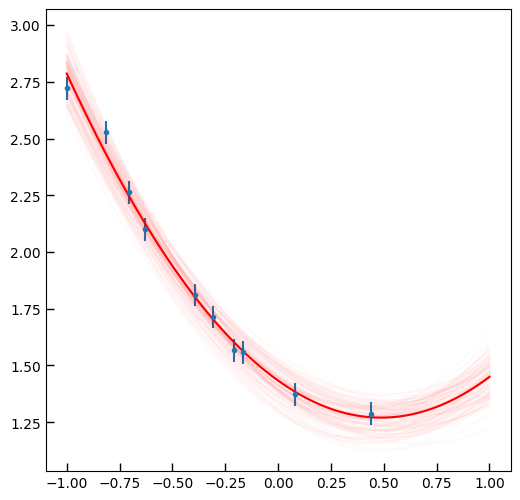

In [2472]:
# ignore off-diagonal elements of covar
covar_fix = np.zeros_like(covar)
np.fill_diagonal(covar_fix, covar.diagonal())
fix_coeffs = np.random.multivariate_normal(lsq_coeffs[0], covar_fix, size=100)
fix_models = Afull.dot(fix_coeffs.T)

plt.errorbar(x, yerr, x*0+eps, linestyle='None', marker='.')
plt.plot(xfull, np.polynomial.chebyshev.chebval(xfull, cfit), color='r')
_ = plt.plot(xfull, fix_models, color='r', alpha=0.02)



2024-10-29 13:47:22,654 - stpipe - WARNING - Too few points to create valid contours
2024-10-29 13:47:22,665 - stpipe - WARNING - Too few points to create valid contours


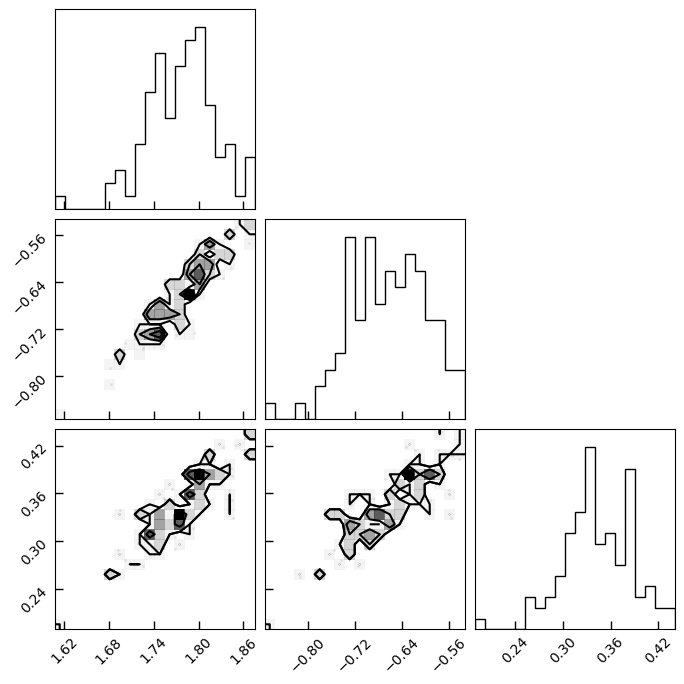

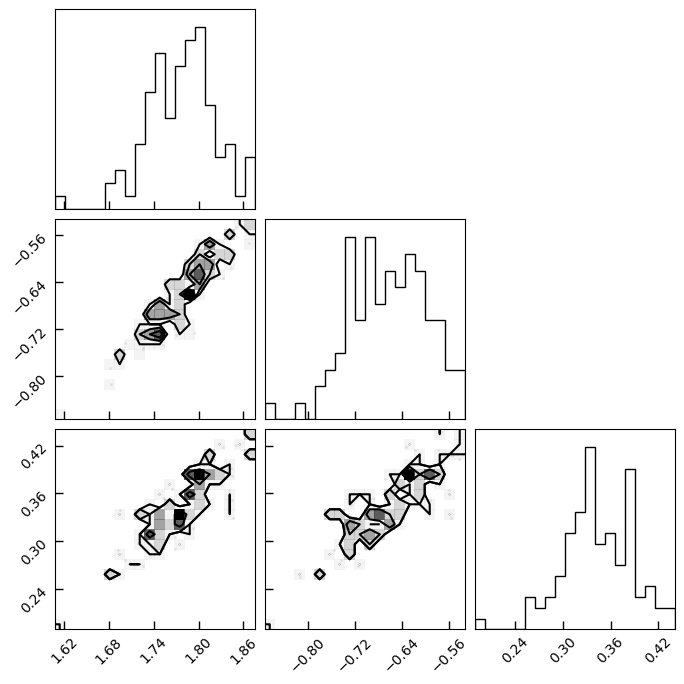

In [2474]:
import corner
corner.corner(random_coeffs)